### Wikipedia Scraping For S&P 500 Tickers + Using Yahoo Finance to Extract Data

In [86]:
import requests
import pandas as pd
# import yfinance as yf
from bs4 import BeautifulSoup
from datetime import datetime

# Step 1: Scrape the Current S&P 500 Component Stocks Table
def get_current_sp500_tickers():
    # Wikipedia URL for S&P 500 components
    url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
    response = requests.get(url)
    soup = BeautifulSoup(response.text, "html.parser")

    # Find the table with S&P 500 current components
    table = soup.find("table", {"id": "constituents"})

    # Extract the data into a DataFrame
    tickers = []
    rows = table.find_all("tr")[1:]  # Skip header row
    for row in rows:
        cols = row.find_all("td")
        ticker = cols[0].text.strip()
        ticker = ticker.replace(".", "-")  # Yahoo Finance uses '-' instead of '.' for tickers like BRK.B
        company = cols[1].text.strip()
        gics_sector = cols[3].text.strip()
        date_added = cols[5].text.strip()
        tickers.append({
            "Ticker": ticker,
            "Company": company,
            "GICS Sector": gics_sector,
            "Date Added": date_added,
        })

    df_tickers = pd.DataFrame(tickers)
    return df_tickers

# # Step 2: Download Historical Data for Tickers in the Formation Period
# def fetch_historical_data(tickers, start_date, end_date, column='Close'):
#     price_data = {}
#     for ticker in tickers:
#         try:
#             stock = yf.Ticker(ticker)
#             hist = stock.history(start=start_date, end=end_date)
#             if not hist.empty:
#                 price_data[ticker] = hist[column]
#         except Exception as e:
#             print(f"Error processing {ticker}: {e}")

#     price_df = pd.DataFrame(price_data)

#     #missing
#     minimum_required_data_points = 0.8 * len(price_df)  # 80% availability required
#     valid_price_df = price_df.dropna(axis=1, thresh=minimum_required_data_points)
#     print(f"Step 3: Price data ready for pairs trading with {valid_price_df.shape[1]} tickers.")

#     # Interpolate missing values
#     price_df = price_df.interpolate(method='linear', limit_direction='forward')


#     return price_df

# # Step 3: Main Function to Prepare Data for Pairs Trading
# def prepare_pairs_trading_data(start_date, end_date):
#     print("Step 1: Scraping current S&P 500 components from Wikipedia...")
#     current_tickers_df = get_current_sp500_tickers()

#     print(f"Step 2: Fetching historical price data for {len(current_tickers_df)} tickers...")
#     valid_tickers = current_tickers_df['Ticker'].tolist()

#     # Fetch price data for the valid tickers
#     price_df = fetch_historical_data(valid_tickers, start_date, end_date, column='Open')

#     return price_df


# # Set the parameters for the period of interest
# start_date = '2000-01-01'
# end_date = datetime.today().strftime('%Y-%m-%d')

# # Prepare the data for pairs trading formation period
# #price_data_for_pairs_trading = prepare_pairs_trading_data(start_date, end_date)

# # Save data to CSV for analysis
# #price_data_for_pairs_trading.to_csv("pairs_trading_open_data.csv")
# print("Price data saved to 'pairs_trading_price_data.csv'")

### Mostly EDA

In [ ]:
import pandas as pd

price_df = pd.read_csv('data/pairs_trading_price_data.csv', index_col='Date', parse_dates=True)
price_df.index = pd.to_datetime(price_df.index, utc=True)
print("shape:", price_df.shape)
print(price_df.head())
# df.reindex()

# explore missing values
missing_values = price_df.isnull().sum() / price_df.shape[0]
missing_columns = missing_values[missing_values > 0]  # Filter for columns with missing values

print(missing_columns) #i think it means the nan values are from before the stock became tradeable

shape: (6273, 503)
                                 MMM       AOS       ABT  ABBV  ACN  \
Date                                                                  
2000-01-03 05:00:00+00:00  19.709011  2.311836  8.288181   NaN  NaN   
2000-01-04 05:00:00+00:00  18.925884  2.278525  8.051376   NaN  NaN   
2000-01-05 05:00:00+00:00  19.474079  2.271863  8.036578   NaN  NaN   
2000-01-06 05:00:00+00:00  21.040354  2.238552  8.317781   NaN  NaN   
2000-01-07 05:00:00+00:00  21.458031  2.331823  8.406583   NaN  NaN   

                                ADBE     AMD        AES       AFL          A  \
Date                                                                           
2000-01-03 05:00:00+00:00  16.274673  15.500  24.847673  6.814988  43.463024   
2000-01-04 05:00:00+00:00  14.909400  14.625  23.862337  6.634147  40.142937   
2000-01-05 05:00:00+00:00  15.204175  15.000  24.119377  6.596074  37.652863   
2000-01-06 05:00:00+00:00  15.328290  16.000  24.312166  6.729324  36.219196   
200

In [88]:
import pandas as pd
import numpy as np

def calculate_returns(price_df, return_type="simple"):
    """
    Calculate returns DataFrame (simple or log returns) from a price DataFrame.

    Parameters:
        price_df (pd.DataFrame): DataFrame with stock prices (columns as assets).
        return_type (str): Type of returns to calculate ("simple" or "log").

    Returns:
        pd.DataFrame: DataFrame containing the calculated returns.
    """
    if return_type == "simple":
        # Calculate simple returns
        returns_df = price_df.pct_change()
    elif return_type == "log":
        # Calculate log returns
        returns_df = np.log(price_df / price_df.shift(1))
    else:
        raise ValueError("Invalid return_type. Choose 'simple' or 'log'.")

    return returns_df

log_returns = calculate_returns(price_df, return_type="log")
log_prices = np.log(price_df)
print("log returns:\n", log_returns.head())

log returns:
                                 MMM       AOS       ABT  ABBV  ACN      ADBE  \
Date                                                                           
2000-01-03 05:00:00+00:00       NaN       NaN       NaN   NaN  NaN       NaN   
2000-01-04 05:00:00+00:00 -0.040545 -0.014514 -0.028988   NaN  NaN -0.087618   
2000-01-05 05:00:00+00:00  0.028554 -0.002928 -0.001840   NaN  NaN  0.019578   
2000-01-06 05:00:00+00:00  0.077358 -0.014771  0.034392   NaN  NaN  0.008130   
2000-01-07 05:00:00+00:00  0.019657  0.040821  0.010620   NaN  NaN  0.047440   

                                AMD       AES       AFL         A  ...  \
Date                                                               ...   
2000-01-03 05:00:00+00:00       NaN       NaN       NaN       NaN  ...   
2000-01-04 05:00:00+00:00 -0.058108 -0.040463 -0.026894 -0.079464  ...   
2000-01-05 05:00:00+00:00  0.025318  0.010714 -0.005755 -0.064038  ...   
2000-01-06 05:00:00+00:00  0.064539  0.007961  0.020000

In [89]:
# Normalize prices
# normalized_price = (price_df - price_df.mean()) / price_df.std()
# i dont think this ^ is the right way to normalize -- i changed it to the paper's formula

# Calculate daily returns from prices
returns_df = price_df.pct_change()

# Calculate normalized prices (cumulative product of returns + 1)
normalized_prices = (1 + returns_df).cumprod()
# print(normalized_prices)

print("Finished normalizing...")
# print(normalized_prices.head())

Finished normalizing...


In [90]:
df_2000 = price_df.loc[price_df.index.year == 2000]
print(df_2000.shape)

df_2000_jan = price_df.loc[(price_df.index.year == 2000) & (price_df.index.month == 1)]
print(df_2000_jan.shape)

# conclusion: each year has 252 trading days and each month has 20 trading days

(252, 503)
(20, 503)


### Correlation Analysis to Select Pairs (Still kind of EDA)

In [91]:
import pandas as pd
import numpy as np

def calculate_correlation_matrix(df, start_date, num_days, min_valid_ratio=0.8):
    """
    Calculate correlation matrix for DataFrame columns with >80% non-NaN values,
    filling zeros where criteria are not met. This is to account for how stocks
    become tradeable at different dates

    Parameters:
        df (pd.DataFrame): DataFrame with data.
        start_date (str or pd.Timestamp): Start date for analysis.
        num_days (int): Number of days to consider after the start_date.
        min_valid_ratio (float): Minimum valid data ratio required (default=0.8).

    Returns:
        pd.DataFrame: Correlation matrix with zeros where conditions aren't met.
    """
    # Ensure datetime conversion
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)

    # Filter the relevant date range
    filtered_data = df.loc[start_date:end_date]

    # Find the first valid index for each column
    first_valid_indices = filtered_data.dropna(how='all').index

    if first_valid_indices.empty:
        print("No valid data found for the specified date range.")
        return pd.DataFrame(0, index=df.columns, columns=df.columns)

    # Start from the first row where at least one column has data
    first_valid_index = first_valid_indices[0]

    # Filter from the first valid index onward
    valid_data = filtered_data.loc[first_valid_index:]

    # Check non-NaN ratios for each column
    valid_ratios = valid_data.notna().mean()

    # Keep only columns with >=80% valid data
    valid_columns = valid_ratios[valid_ratios >= min_valid_ratio].index.tolist()

    if len(valid_columns) < 2:
        print("Not enough columns with valid data for correlation calculation.")
        # Return a zero matrix
        return pd.DataFrame(0.0, index=df.columns, columns=df.columns)

    # Calculate the correlation matrix
    correlation_matrix = valid_data[valid_columns].corr()

    # Fill missing columns with zero rows and columns
    complete_corr_matrix = pd.DataFrame(
        0.0, index=df.columns, columns=df.columns
    )
    complete_corr_matrix.loc[valid_columns, valid_columns] = correlation_matrix
    return complete_corr_matrix
#calculate_correlation_matrix(df, '2000-01-01', 365)

correlation_pairs shape: (126253, 3)
most highly correlated pair:
 Variable 1          AVB
Variable 2          BXP
Correlation    0.992443
Name: 24803, dtype: object
      Variable 1 Variable 2  Correlation
53781         ED         SO     0.818579
top pairs shape: (282, 3)


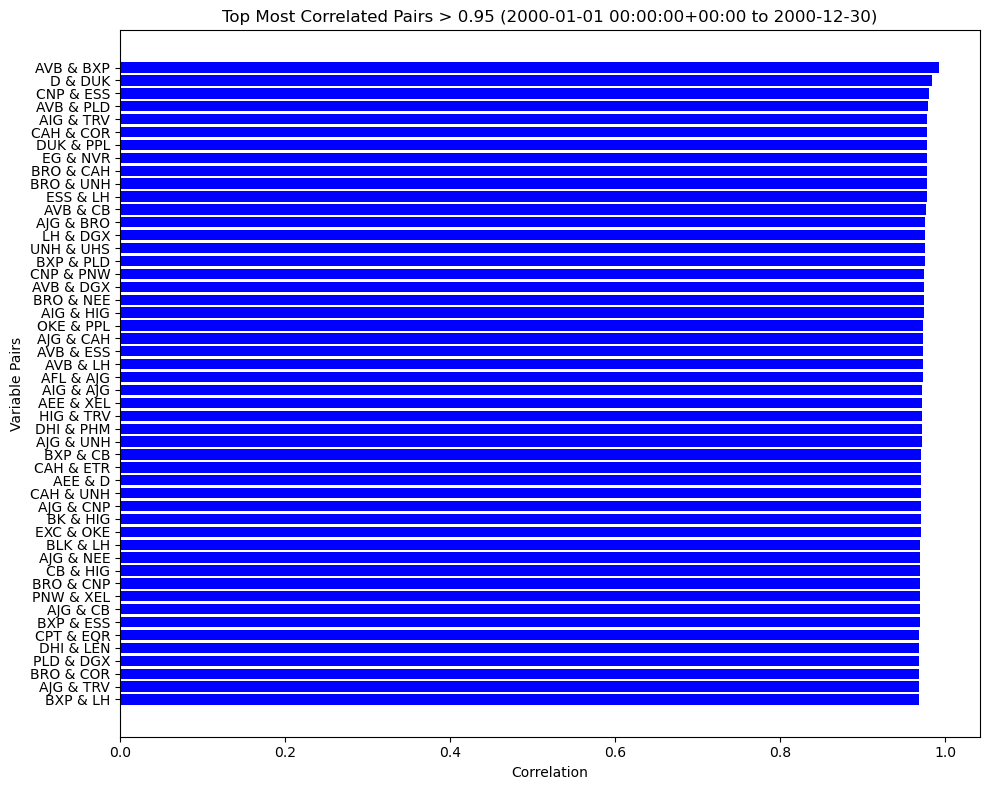

In [92]:
from itertools import combinations
import matplotlib.pyplot as plt

def calculate_corr(data, start_date, num_days=365):
    """
    Calculate correlations over a specified period and plot the top 50 correlated pairs.

    Parameters:
        data (pd.DataFrame): DataFrame of stock prices or returns with columns as assets and index as dates.
        start_date (str): Start date for the period (format: 'YYYY-MM-DD').
        num_days (int): Number of days to consider starting from the start_date.

    Returns:
        pd.DataFrame: DataFrame containing the top 50 correlated pairs.
    """
    # Filter data for the specified period
    end_date = pd.to_datetime(start_date, utc=True) + pd.Timedelta(days=num_days - 1)
    filtered_data = data.loc[start_date:end_date]

    # Check if the filtered_data has sufficient data
    if filtered_data.empty:
        raise ValueError(f"No data available for the specified period: {start_date} to {end_date}")

    # Calculate the correlation matrix
    correlation_matrix = calculate_correlation_matrix(data, start_date, num_days)

    # Extract the upper triangle of the correlation matrix, excluding the diagonal
    correlation_pairs = (
        correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
        .stack()
        .reset_index()
    )
    correlation_pairs.columns = ['Variable 1', 'Variable 2', 'Correlation']
    print("correlation_pairs shape:", correlation_pairs.shape)
    # print(np.argmax(correlation_pairs['Correlation']))
    print("most highly correlated pair:\n", correlation_pairs.loc[np.argmax(correlation_pairs['Correlation'])])

    # check what ED and SO correlation is -- sanity check since this was top 1 pair in the paper for 2000
    result = correlation_pairs[
        (correlation_pairs['Variable 1'] == "ED") &
        (correlation_pairs['Variable 2'] == "SO")
    ]
    print(result)

    # Sort by absolute value of correlation in descending order
    # Filter for correlations > 0.9
    high_corr_pairs = correlation_pairs[correlation_pairs['Correlation'] > 0.95]

    # Sort by correlation in descending order
    top_pairs = high_corr_pairs.sort_values(by='Correlation', ascending=False)
    print("top pairs shape:", top_pairs.shape)

    # Plot the top pairs
    top_50_pairs = top_pairs.head(50)
    plt.figure(figsize=(10, 8))
    plt.barh(
        top_50_pairs.apply(lambda x: f"{x['Variable 1']} & {x['Variable 2']}", axis=1),
        top_50_pairs['Correlation'],
        color=np.where(top_50_pairs['Correlation'] > 0, 'blue', 'red'),
    )
    plt.xlabel("Correlation")
    plt.ylabel("Variable Pairs")
    plt.title(f"Top Most Correlated Pairs > 0.95 ({start_date} to {end_date.strftime('%Y-%m-%d')})")
    plt.gca().invert_yaxis()  # Invert y-axis to display the highest correlation at the top
    plt.tight_layout()
    plt.show()

    return top_pairs

top_pairs_in_2000 = calculate_corr(log_prices, pd.Timestamp("2000-01-01", tz="UTC"))

### Cointegration Analysis to Select Pairs

Clustering Sectors

In [93]:
current_tickers_df = get_current_sp500_tickers()

# Step 1: Group tickers by GICS sector
grouped = current_tickers_df.groupby('GICS Sector')['Ticker'].apply(list)

# Step 2: Find the maximum number of tickers in any sector
max_tickers = max(len(tickers) for tickers in grouped)

# Step 3: Create a DataFrame with GICS sectors as columns and tickers underneath
sector_df = pd.DataFrame({
    sector: tickers + [None] * (max_tickers - len(tickers))  # Pad shorter lists with None
    for sector, tickers in grouped.items()
})

In [94]:
def calculate_sector_returns(sector_df, log_returns, start_date, num_days=252):
    """
    Calculate mean returns for each sector over a given time period.

    Parameters:
        sector_df (pd.DataFrame): DataFrame with GICS sectors as columns and tickers underneath.
        log_returns (pd.DataFrame): DataFrame with log returns (columns: tickers, index: dates).
        start_date (str): The start date for the calculation period (YYYY-MM-DD format).
        num_days (int): The number of days for the calculation period (default is 252).

    Returns:
        pd.DataFrame: Sector mean returns DataFrame with sectors as columns and mean returns as rows.
    """
    # Convert start_date to a pandas datetime
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)

    # Filter log returns for the specified date range
    filtered_returns = log_returns.loc[start_date:end_date]

    # Initialize dictionary to store sector mean returns
    sector_mean_returns = {}

    # Loop through each sector
    for sector in sector_df.columns:
        # Extract tickers for the sector
        tickers = sector_df[sector].dropna().tolist()

        # Check if tickers exist in log_returns
        valid_tickers = [
            ticker for ticker in tickers 
            if ticker in filtered_returns.columns and not filtered_returns[ticker].isnull().any()
        ]
        
        # Aggregate mean returns for the sector
        if valid_tickers:
            sector_mean_returns[sector] = filtered_returns[valid_tickers].mean(axis=1)
    
    # Convert the results to a DataFrame
    sector_returns_df = pd.DataFrame(sector_mean_returns)

    return sector_returns_df

In [95]:
sector_returns_df_2000 = calculate_sector_returns(sector_df, log_returns, "2000-01-04")

In [96]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt

def make_cluster(start_date, n_clusters=5, num_days=252):
    """
    Perform K-Means clustering on GICS sectors based on their return profiles.

    Parameters:
        start_date (str): Start date for clustering (YYYY-MM-DD format).
        n_clusters (int): Number of clusters to form (default is 5).
        num_days (int): Number of days from start_date to consider (default is 252).

    Returns:
        pd.DataFrame: DataFrame mapping GICS sectors to their clusters.
    """
    # Filter data for the specified date range
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)
    sec_returns_df = calculate_sector_returns(sector_df, log_returns, start_date, num_days=num_days)
    filtered_data = sec_returns_df.loc[start_date:end_date]

    # Step 1: Transpose the DataFrame
    sector_transposed = filtered_data.T

    # Step 2: Scale the Data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(sector_transposed)

    # Step 3: Apply K-Means Clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(scaled_data)

    # Step 4: Add Cluster Labels to Sectors
    sector_transposed['Cluster'] = clusters

    # Create a DataFrame mapping GICS sectors to clusters
    sector_cluster_mapping = pd.DataFrame({
        'GICS Sector': filtered_data.columns,
        'Cluster': clusters
    })
    return sector_cluster_mapping

sector_cluster_mapping_2000 = make_cluster('2000-01-04')
# Step 5: Print Clusters
print("Clusters and their GICS Sectors:")
for cluster_id, sectors in sector_cluster_mapping_2000.groupby('Cluster'):
    print(f"Cluster {cluster_id}:")
    print(sectors['GICS Sector'].tolist())
    print()

Clusters and their GICS Sectors:
Cluster 0:
['Footwear']

Cluster 1:
['Advertising', 'Construction & Engineering', 'Gold', 'Integrated Oil & Gas', 'Oil & Gas Equipment & Services', 'Oil & Gas Exploration & Production', 'Oil & Gas Refining & Marketing', 'Oil & Gas Storage & Transportation']

Cluster 2:
['Application Software', 'Biotechnology', 'Broadline Retail', 'Cable & Satellite', 'Communications Equipment', 'Computer & Electronics Retail', 'Diversified Support Services', 'Electronic Components', 'Electronic Equipment & Instruments', 'Electronic Manufacturing Services', 'IT Consulting & Other Services', 'Interactive Home Entertainment', 'Interactive Media & Services', 'Internet Services & Infrastructure', 'Investment Banking & Brokerage', 'Life Sciences Tools & Services', 'Semiconductor Materials & Equipment', 'Semiconductors', 'Systems Software', 'Technology Hardware, Storage & Peripherals', 'Telecom Tower REITs', 'Transaction & Payment Processing Services']

Cluster 3:
['Aerospace 

In [97]:
from statsmodels.tsa.stattools import coint, adfuller
def filter_nonstationary(data, start_date, num_days=252, significance_level=0.05):
    """
    Filter stocks to ensure theyre nonstationary using the ADF test.

    Parameters:
        data (pd.DataFrame): DataFrame of stock prices.
        start_date: start date of the formation period
        num_days = how long formation period is
        significance_level (float): The threshold p-value for stationarity (default=0.05).

    Returns:
        pd.DataFrame: DataFrame of nonstationary stocks
    """
    
    nonstationary = []
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)
    filtered_data = data.loc[start_date:end_date]
    filtered_data = filtered_data.loc[:, ~filtered_data.isna().any()]

    for col in filtered_data.columns:
        adf_result = adfuller(filtered_data[col])
        adf_stat = adf_result[0]  # Test statistic
        p_value = adf_result[1]   # p-value

        # drop if the spread is stationary
        if p_value > significance_level:
            nonstationary.append({
                "Tick": col,
                "P-Value": p_value
            })

    return nonstationary

nonstat_stocks = filter_nonstationary(log_prices, "2000-01-03")

Forming Pairs by Cointegration and Correlation

In [98]:
from statsmodels.tsa.stattools import coint
import pandas as pd
from itertools import combinations

def cointegration_analysis(data, ticks, start_date, num_days=252, significance_level=0.05, correlation_min=0.8):
    """
    Perform cointegration analysis on all possible pairs from ticks.

    Parameters:
        data (pd.DataFrame): Historical asset prices.
        ticks (list): List of tickers from `filter_nonstationary`.
        start_date (str): Start date for analysis.
        num_days (int): Number of days to analyze (default=365).
        significance_level (float): P-value significance threshold (default=0.05).
        correlation_min: minimum threshold for pairs to be considered for cointegration

    Returns:
        pd.DataFrame, pd.DataFrame: Top cointegrated pairs, top volatile pairs. (didn't end up using volatile pairs)
    """
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)
    filtered_data = data.loc[start_date:end_date]
    cointegration_results = []

    # Generate all possible pairs from the ticks list
    for asset1, asset2 in combinations(ticks, 2):
        # Drop rows with NaNs for both assets
        valid_data = filtered_data[[asset1, asset2]].dropna()

        correlation = np.corrcoef(valid_data[asset1], valid_data[asset2])[0, 1]
        if abs(correlation) < correlation_min:
            continue  # Skip pairs with low correlation
        
        if valid_data.empty:
            continue

        try:
            # Perform cointegration test
            score, p_value, _ = coint(valid_data[asset1], valid_data[asset2])

            if p_value < significance_level:  # Check for significance
                spread = valid_data[asset1] - valid_data[asset2]
                cointegration_results.append({
                    'Asset 1': asset1,
                    'Asset 2': asset2,
                    'T Statistic': score,
                    'P-Value': p_value,
                    'Volatility': spread.std()
                })

        except Exception as e:
            print(f"Error testing pair ({asset1}, {asset2}): {e}")

    # Convert results to DataFrame
    coint_df = pd.DataFrame(cointegration_results)

    if coint_df.empty:
        print("No cointegrated pairs found.")
        return pd.DataFrame(), pd.DataFrame()

    # Sort by T-statistic and Volatility
    top_coint_pairs = coint_df.nsmallest(20, 'T Statistic')
    top_volatile_pairs = coint_df.nlargest(20, 'Volatility')

    return top_coint_pairs, top_volatile_pairs

Saving Cointegrated Pairs (1 Yr Formation Period Every 6 Months)

In [99]:
import pandas as pd
from datetime import timedelta

def run_cointegration_rolling_no_cluster(log_prices, start_date, num_days=252, window_size=126, significance_level=0.05):
    """
    Get top 20 pairs from cointegration(not using cluster) every half trading year using 1 year formation period

    Parameters:
        log_prices (pd.DataFrame): Historical log prices.
        start_date (str): Start date for the first window.
        window_size (int): Number of trading days in each window (default=126).
        significance_level (float): P-value threshold for cointegration (default=0.05).

    Returns:
        None: Saves CSV files with top 20 pairs for each half trading year window.
    """
    start_date = pd.to_datetime(start_date, utc=True)

    while True:
        # Define end date for the current window
        end_date = start_date + pd.Timedelta(days=num_days - 1)

        # Ensure date range is within data bounds
        if end_date > log_prices.index.max():
            print("Reached the end of the available data.")
            break

        # Run cointegration analysis for the current window
        print(f"Processing window: {start_date.date()} to {end_date.date()}")
        ticks_list = [item['Tick'] for item in filter_nonstationary(log_prices, start_date)]
        results, _ = cointegration_analysis(log_prices, ticks_list, start_date,  num_days=num_days, correlation_min=0.95)

        
        # Extract top 20 pairs by T-statistic
        top_20_pairs = results

        # Save to CSV
        file_name = f"noclusterpairs_{start_date.date()}_{end_date.date()}.csv"
        top_20_pairs.to_csv(file_name, index=False)
        print(f"Saved top 20 pairs to {file_name}")


        # Move the window forward by half the window size (~half trading year)
        start_date = start_date + pd.Timedelta(days=window_size - 1) + timedelta(days=1)


In [100]:
#this is how we save the pairs for each formation period
#run_cointegration_rolling_no_cluster(log_prices, "2020-05-12") 

Saving Cointegrated Pairs with Clustering (1 Yr Formation Period Every 6 Months)

In [101]:
from itertools import combinations
from statsmodels.tsa.stattools import coint
import pandas as pd

def run_cointegration_by_cluster(log_prices, cluster_mapping, start_date, num_days=252, significance_level=0.05):
    """
    Run cointegration analysis for each cluster and get top 20 pairs every formation period.

    Parameters:
        log_prices (pd.DataFrame): Historical log prices of tickers.
        cluster_mapping (pd.DataFrame): DataFrame mapping GICS sectors to clusters.
        start_date (str): Start date for analysis.
        num_days (int): Number of days to analyze (default=365).
        significance_level (float): P-value significance threshold (default=0.05).

    Returns:
        dict: Dictionary of results for each cluster, containing top cointegrated pairs.
    """
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)
    
    # Filter non-stationary stocks
    nonstat = filter_nonstationary(log_prices, start_date=start_date)
    tickers = [d['Tick'] for d in nonstat]
    # Prepare dictionary to store results for each cluster
    cluster_results = {}

    # Group tickers by cluster
    for cluster_id, cluster_data in cluster_mapping.groupby('Cluster'):
        print(f"Processing Cluster {cluster_id}...")
        cluster_tickers = []

        for sector in cluster_data['GICS Sector']:
            for tick in sector_df[sector].dropna():
                if tick in tickers: 
                    cluster_tickers.append(tick)
        print(cluster_tickers)
        cluster_log_prices = log_prices.loc[start_date:end_date, cluster_tickers].dropna(axis=1, how='any')
        
        # Run cointegration analysis on the cluster-specific log prices
        top_coint_pairs, top_volatile_pairs = cointegration_analysis(
            cluster_log_prices, cluster_tickers, start_date, num_days=num_days, significance_level=significance_level, correlation_min=0.95
        )

        # Store the results in the dictionary
        cluster_results[cluster_id] = {
            'Top Cointegrated Pairs': top_coint_pairs,
        }

    return cluster_results

# Example Usage
cluster_results = run_cointegration_by_cluster(log_prices, sector_cluster_mapping_2000, start_date='2000-01-03', num_days=252)

# Print results for each cluster
for cluster_id, results in cluster_results.items():
    print(f"\nCluster {cluster_id}:")
    print("Top Cointegrated Pairs:")
    print(results['Top Cointegrated Pairs'])


Processing Cluster 0...
['DECK']
No cointegrated pairs found.
Processing Cluster 1...
['IPG', 'J', 'PWR', 'NEM', 'CVX', 'HES', 'BKR', 'HAL', 'SLB', 'APA', 'COP', 'CTRA', 'DVN', 'EOG', 'EQT', 'OXY', 'VLO', 'OKE']
Processing Cluster 2...
['ADBE', 'ANSS', 'ADSK', 'CDNS', 'FICO', 'INTU', 'ORCL', 'PTC', 'SNPS', 'TYL', 'AMGN', 'BIIB', 'GILD', 'INCY', 'REGN', 'VRTX', 'AMZN', 'EBAY', 'CMCSA', 'FFIV', 'JNPR', 'MSI', 'BBY', 'CTAS', 'CPRT', 'APH', 'GLW', 'ROP', 'TDY', 'TRMB', 'ZBRA', 'JBL', 'CTSH', 'IT', 'IBM', 'EA', 'TTWO', 'AKAM', 'VRSN', 'SCHW', 'GS', 'MS', 'RJF', 'A', 'TECH', 'DHR', 'MTD', 'TMO', 'WAT', 'AMAT', 'KLAC', 'LRCX', 'TER', 'AMD', 'ADI', 'INTC', 'MCHP', 'MU', 'NVDA', 'QCOM', 'SWKS', 'TXN', 'GEN', 'MSFT', 'AAPL', 'HPQ', 'NTAP', 'WDC', 'AMT', 'CCI', 'FI', 'JKHY']
No cointegrated pairs found.
Processing Cluster 3...
['BA', 'GE', 'GD', 'LMT', 'NOC', 'RTX', 'DE', 'ADM', 'CHRW', 'EXPD', 'FDX', 'UPS', 'ROST', 'NKE', 'RL', 'BLK', 'BK', 'BEN', 'IVZ', 'NTRS', 'STT', 'TROW', 'F', 'BWA', 'KMX',

In [102]:
import pandas as pd
from datetime import timedelta

def run_cointegration_rolling(log_prices, start_date, num_days=252, window_size=126, significance_level=0.05):
    """
    Perform cointegration analysis every half trading year and save results.

    Parameters:
        log_prices (pd.DataFrame): Historical log prices.
        cluster_mapping (pd.DataFrame): DataFrame mapping GICS sectors to clusters.
        start_date (str): Start date for the first window.
        window_size (int): Number of trading days in each window (default=126).
        significance_level (float): P-value threshold for cointegration (default=0.05).

    Returns:
        None: Saves CSV files with top 20 pairs for each half trading year window.
    """
    start_date = pd.to_datetime(start_date, utc=True)

    while True:
        # Define end date for the current window
        end_date = start_date + pd.Timedelta(days=num_days - 1)
        cluster_mapping = make_cluster(start_date, num_days=num_days)

        # Ensure date range is within data bounds
        if end_date > log_prices.index.max():
            print("Reached the end of the available data.")
            break

        # Run cointegration analysis for the current window
        print(f"Processing window: {start_date.date()} to {end_date.date()}")
        cluster_results = run_cointegration_by_cluster(
            log_prices, cluster_mapping, start_date=start_date, num_days=num_days, significance_level=significance_level
        )

        # Combine results into a DataFrame
        all_results = pd.concat(
            [results['Top Cointegrated Pairs'].assign(Cluster=cluster_id)
             for cluster_id, results in cluster_results.items()
             if not results['Top Cointegrated Pairs'].empty],
            ignore_index=True
        )

        if not all_results.empty:
            # Extract top 20 pairs by T-statistic
            top_20_pairs = all_results.nsmallest(20, 'T Statistic')

            # Save to CSV
            file_name = f"pairs_{start_date.date()}_{end_date.date()}.csv"
            top_20_pairs.to_csv(file_name, index=False)
            print(f"Saved top 20 pairs to {file_name}")
        else:
            print(f"No cointegrated pairs found for window: {start_date.date()} to {end_date.date()}")

        # Move the window forward by half the window size (~half trading year)
        start_date = start_date + pd.Timedelta(days=window_size - 1) + timedelta(days=1)


In [103]:
#this is how we save results
#run_cointegration_rolling(log_prices, "2013-06-18") 

Plotting spread of pairs

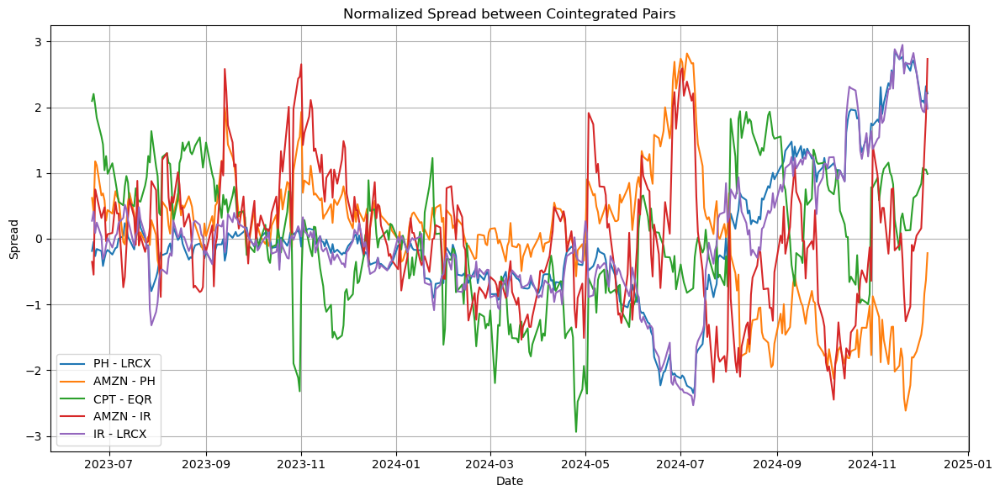

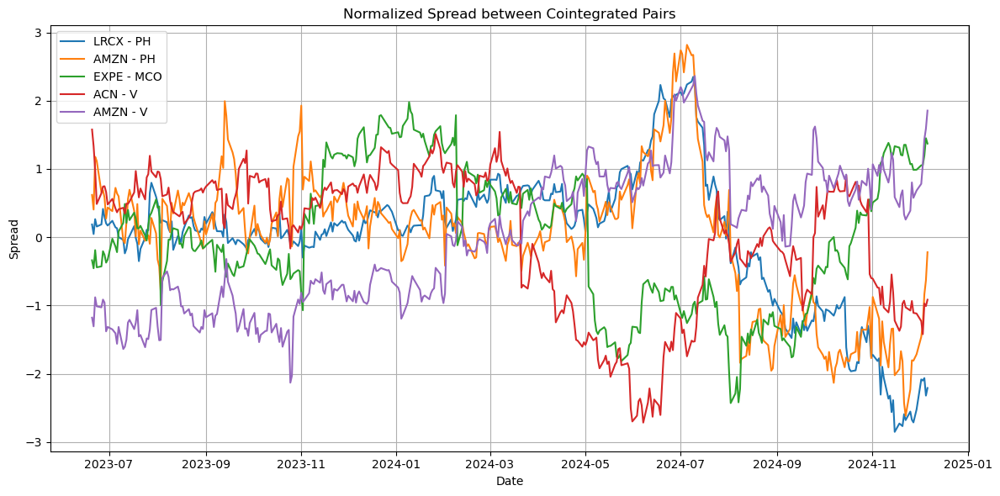

In [104]:
import matplotlib.pyplot as plt
# Unused code that did both top cointegrated and top volatile pairs
# decided against using top volatile because it was taking too long to process

# def cointegration_analysis(data, top_pairs, start_date, num_days=365):
#     start_date = pd.to_datetime(start_date, utc=True)
#     end_date = start_date + pd.Timedelta(days=num_days - 1)
#     filtered_data = data.loc[start_date:end_date]
#     cointegration_results = []

#     for _, row in top_pairs.iterrows():
#         asset1, asset2 = row['Variable 1'], row['Variable 2']

#         # Find first valid index where both assets are non-NaN
#         valid_data = filtered_data
#         # Perform cointegration test
#         result = coint(valid_data[asset1], valid_data[asset2])
#         p_value = result[1]
#         score = result[0]
#         crit = result[2]
#         spread = valid_data[asset1] - valid_data[asset2]

#         if p_value < 0.05:  # Check for p-value significance
#           cointegration_results.append({
#               'Asset 1': asset1,
#               'Asset 2': asset2,
#               'T Statistic': score,
#               'P-Value': p_value,
#               'Volatility': spread.std()
#         })

#     # Convert to DataFrame
#     coint_df = pd.DataFrame(cointegration_results)

#     # Sort by trace statistic and keep the top 20 pairs
#     coint_df.sort_values(by='T Statistic', ascending=True, inplace=True)
#     top_coint_pairs = coint_df.head(20)

#     coint_df.sort_values(by='Volatility', ascending=False, inplace=True)
#     top_volatile_pairs = coint_df.head(20)
#     return top_coint_pairs, top_volatile_pairs

# plot spread
def plot_coint_spreads(data, cointegrated_pairs, start_date, num_days=365*2):
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)
    filtered_data = data.loc[start_date:end_date]

    plt.figure(figsize=(12, 6))
    for _, row in cointegrated_pairs.iterrows():
        asset1, asset2 = row['Asset 1'], row['Asset 2']
        # Calculate the spread
        spread = filtered_data[asset1] - filtered_data[asset2]
        normalized_spread = (spread - spread.mean()) / spread.std()
        plt.plot(filtered_data.index, normalized_spread, label=f"{asset1} - {asset2}")

    plt.title('Normalized Spread between Cointegrated Pairs')
    plt.xlabel('Date')
    plt.ylabel('Spread')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

pairs = pd.read_csv('data/coint_pairs/pairs_2000-01-04_2000-09-11.csv')
pairs_nc = pd.read_csv('data/nocluster_pairs/noclusterpairs_2000-01-04_2000-09-11.csv')

pairs2 = pd.read_csv('data/coint_pairs/pairs_2023-06-20_2024-02-26.csv')
pairs2_nc = pd.read_csv('data/nocluster_pairs/noclusterpairs_2023-06-20_2024-02-26.csv')
plot_coint_spreads(log_prices, pairs2[:5], start_date="2023-06-20")
plot_coint_spreads(log_prices, pairs2_nc[:5], start_date="2023-06-20")


### SSD Analysis to Select Pairs

In [105]:
from itertools import combinations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def calculate_ssd(data, start_date, num_days=365, top_n=20, min_valid_ratio=0.8):
    """
    Calculate SSD (Sum of Squared Differences) for all stock pairs meeting >80% valid data threshold.
    Start SSD calculation from the first valid index where both stocks are non-NaN.

    Parameters:
        data (pd.DataFrame): DataFrame of stock prices or returns with columns as assets and index as dates.
        start_date (str or pd.Timestamp): Start date for the period (format: 'YYYY-MM-DD').
        num_days (int): Number of days to consider starting from the start_date.
        top_n (int): Number of top pairs to return based on the smallest SSD.
        min_valid_ratio (float): Minimum valid data ratio required (default=0.8).

    Returns:
        pd.DataFrame: DataFrame containing the top N pairs with the smallest SSD.
    """
    # Ensure datetime conversion
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)

    # Filter the relevant date range
    filtered_data = data.loc[start_date:end_date][1:]
    # print(filtered_data)

    # Check if filtered data is available
    if filtered_data.empty:
        raise ValueError(f"No data available for the specified period: {start_date} to {end_date}")

    # only process stocks that don't have missing values
    cleaned_df = filtered_data.loc[:, ~filtered_data.isna().any()]
    # print(cleaned_df.shape)

    # Step 1: Compute the pairwise differences matrix
    cleaned_data = cleaned_df.values
    n_stocks = cleaned_data.shape[1]

    # Create a 3D array where each slice is the difference between a pair of columns
    diff_matrix = cleaned_data[:, :, None] - cleaned_data[:, None, :]  # Shape: (n_rows, n_stocks, n_stocks)

    # Step 2: Compute SSD matrix
    ssd_matrix = np.nansum(diff_matrix ** 2, axis=0)  # Shape: (n_stocks, n_stocks)

    # Step 3: Extract upper triangle of SSD matrix (to avoid duplicate pairs)
    stock_names = cleaned_df.columns
    i, j = np.triu_indices(n_stocks, k=1)  # Indices for the upper triangle
    ssd_results = pd.DataFrame({
        'Stock 1': stock_names[i],
        'Stock 2': stock_names[j],
        'SSD': ssd_matrix[i, j]
    })

    # Convert results to DataFrame
    ssd_df = pd.DataFrame(ssd_results)

    if ssd_df.empty:
        raise ValueError("No valid pairs found with sufficient data.")

    # Sort by SSD in ascending order and select the top N pairs
    top_pairs = ssd_df.sort_values(by='SSD', ascending=True).head(top_n)

    # Plot the SSD of the top N pairs
#     plt.figure(figsize=(10, 8))
#     plt.barh(
#         top_pairs.apply(lambda x: f"{x['Stock 1']} & {x['Stock 2']}", axis=1),
#         top_pairs['SSD'],
#         color='green'
#     )
#     plt.xlabel("SSD (Sum of Squared Differences)")
#     plt.ylabel("Stock Pairs")
#     plt.title(f"Top {top_n} Pairs with Smallest SSD ({start_date.strftime('%Y-%m-%d')} to {end_date.strftime('%Y-%m-%d')})")
#     plt.gca().invert_yaxis()  # Invert y-axis to display the lowest SSD at the top
#     plt.tight_layout()
#     plt.show()

    return top_pairs

In [106]:
top_ssd_2000 = calculate_ssd(normalized_prices, pd.Timestamp("2000-01-01", tz="UTC"))
top_ssd_2010 = calculate_ssd(normalized_prices, pd.Timestamp("2010-01-01", tz="UTC"))
top_ssd_2020 = calculate_ssd(normalized_prices, pd.Timestamp("2020-01-01", tz="UTC"))

In [107]:
print(top_ssd_2000.head())
print(normalized_prices.shape)
print(top_ssd_2000.shape)

      Stock 1 Stock 2       SSD
12730     AVB     BXP  0.202789
19915     CPT     REG  0.272440
19764     CPT     EQR  0.327203
49828     KIM     PLD  0.364820
3877      ARE     CPT  0.433844
(6273, 503)
(20, 3)


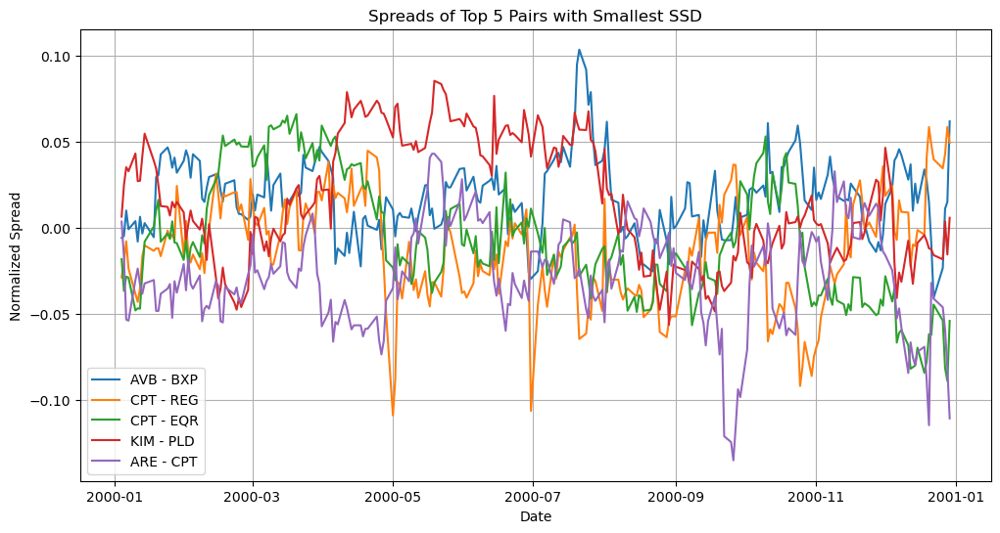

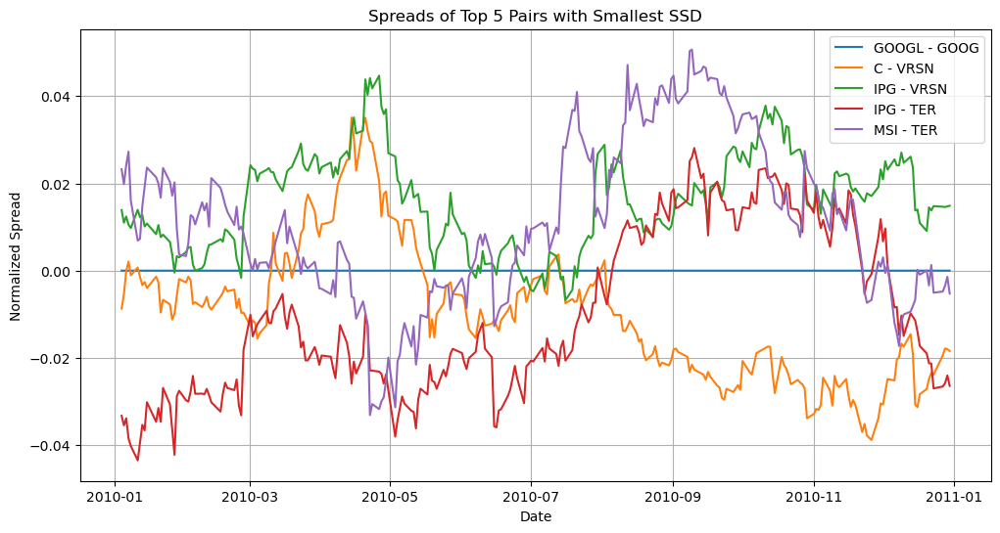

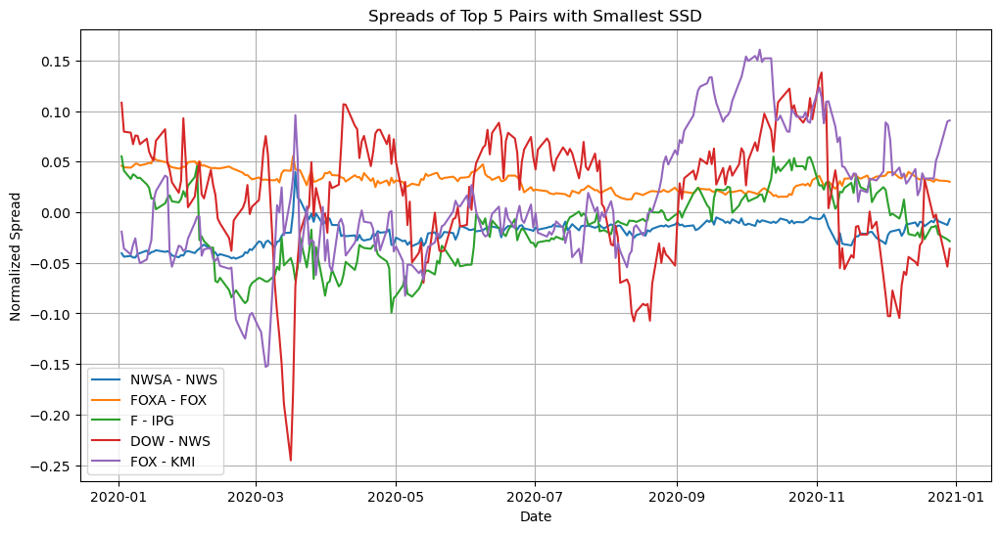

In [108]:
def plot_spreads_from_ssd(normalized_data, top_ssd_pairs, start_date, num_days=365):
    """
    Plot the spreads for the top pairs with smallest SSD.

    Parameters:
        data (pd.DataFrame): DataFrame of stock prices or returns with columns as assets and index as dates.
        top_ssd_pairs (pd.DataFrame): DataFrame containing top SSD pairs ('Stock 1', 'Stock 2').
        start_date (str or pd.Timestamp): Start date for the period (format: 'YYYY-MM-DD').
        num_days (int): Number of days to consider starting from the start_date.
"""
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)
    filtered_data = normalized_data.loc[start_date:end_date]

    # Plot spreads for the top SSD pairs
    plt.figure(figsize=(12, 6))
    for _, row in top_ssd_pairs.iterrows():
        stock1, stock2 = row['Stock 1'], row['Stock 2']
        spread = filtered_data[stock1] - filtered_data[stock2]
        # spread_normalized = (spread - spread.mean()) / spread.std()
        plt.plot(filtered_data.index, spread, label=f"{stock1} - {stock2}")

    plt.title(f"Spreads of Top 5 Pairs with Smallest SSD")
    plt.xlabel("Date")
    plt.ylabel("Normalized Spread")
    plt.legend()
    plt.grid(True)
    plt.show()

plot_spreads_from_ssd(normalized_prices, top_ssd_2000[0:5], start_date="2000-01-01")
plot_spreads_from_ssd(normalized_prices, top_ssd_2010[0:5], start_date="2010-01-01")
plot_spreads_from_ssd(normalized_prices, top_ssd_2020[0:5], start_date="2020-01-01")

#notice how some companies go public at differing dates

### Gaussian HMM (2-Regime) Fitting -- testing to see how it works

In [109]:
pip install hmmlearn

Note: you may need to restart the kernel to use updated packages.


In [110]:
from os import statvfs_result
from hmmlearn import hmm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the HMM modeling function
def model(df, stock_a, stock_b, start_date, num_days=365, states=2):
    """
    Apply Gaussian HMM to model spread between two stocks.

    Parameters:
        df (pd.DataFrame): DataFrame with stock price data.
        stock_a (str): Ticker for the first stock.
        stock_b (str): Ticker for the second stock.
        start_date (str or pd.Timestamp): Start date of analysis.
        num_days (int): Number of days to include in the analysis.

    Returns:
        None: Displays model parameters and plots the spread and hidden states.
    """

    # Ensure the DataFrame index is datetime
    if not pd.api.types.is_datetime64_any_dtype(df.index):
        df.index = pd.to_datetime(df.index)

    # Filter data for the specified period
    start_date = pd.to_datetime(start_date, utc=True)
    end_date = start_date + pd.Timedelta(days=num_days - 1)
    filtered_data = df.loc[start_date:end_date]
    filtered_data = filtered_data[[stock_a, stock_b]].dropna()

    # Calculate the spread
    spread = filtered_data[stock_a] - filtered_data[stock_b]
    spread_data = spread.values.reshape(-1, 1)

    # Initialize and fit the Gaussian HMM model
    hmm_model = hmm.GaussianHMM(n_components=states, covariance_type="diag", n_iter=100)
    hmm_model.fit(spread_data)

    # Extract hidden states
    hidden_states = hmm_model.predict(spread_data)

    # Display estimated parameters
    print("Transition Probabilities:\n", hmm_model.transmat_)
    print("Means (Regime Means):\n", hmm_model.means_.flatten())
    print("Covariances (Spread Variances):\n", hmm_model.covars_.flatten())

    # Plot the spread and estimated regimes
    plt.figure(figsize=(12, 6))
    plt.plot(filtered_data.index, spread, label="Spread")
    plt.step(filtered_data.index, hidden_states, where='mid', linestyle="--", label="Hidden States")
    plt.title(f"Estimated Regime Switching States for {stock_a} & {stock_b}")
    plt.xlabel("Date")
    plt.ylabel("Spread")
    plt.legend()
    plt.grid(True)
    plt.show()


Transition Probabilities:
 [[9.92400438e-01 3.20315963e-69 7.59956194e-03]
 [1.85691226e-53 9.87187301e-01 1.28126995e-02]
 [5.42871934e-19 3.03405872e-02 9.69659413e-01]]
Means (Regime Means):
 [0.0363174  0.5335509  0.45313425]
Covariances (Spread Variances):
 [0.0112874  0.0020603  0.02974061]


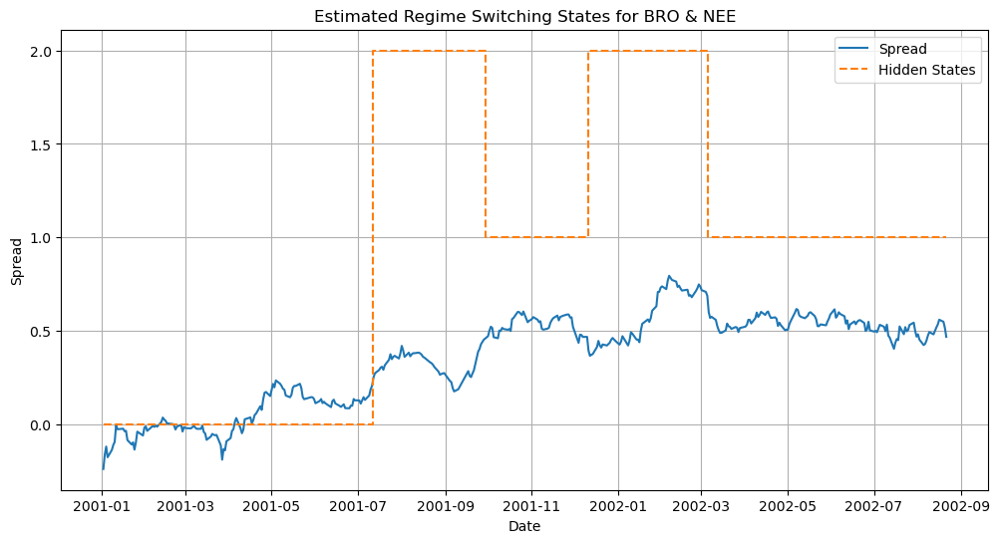

In [111]:
model(log_prices, 'BRO', 'NEE', start_date='2000-12-31', num_days=600, states=3) #ssd

Transition Probabilities:
 [[0.98960932 0.01039068]
 [0.0149987  0.9850013 ]]
Means (Regime Means):
 [-1.13417146 -0.91329021]
Covariances (Spread Variances):
 [0.00438658 0.01100382]


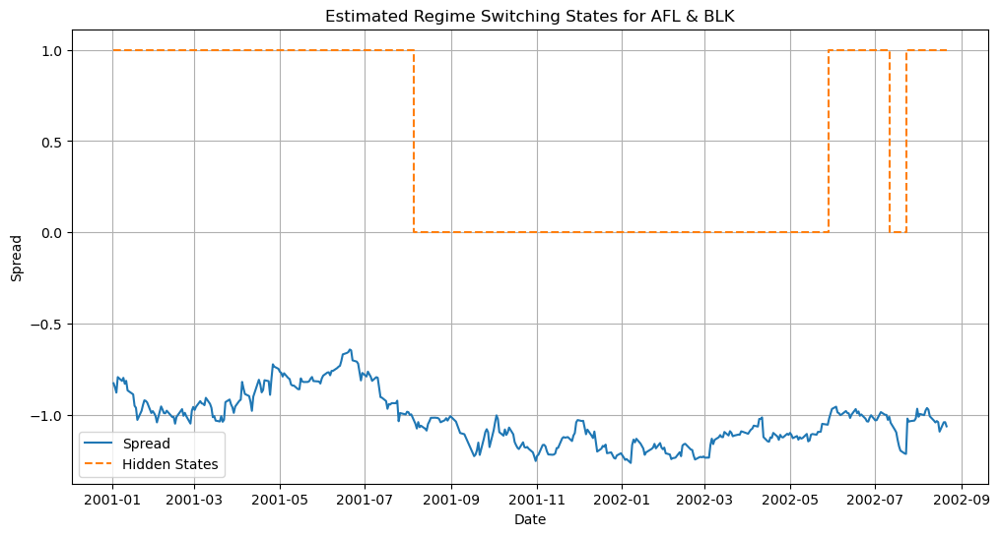

In [112]:
model(log_prices, 'AFL', 'BLK', start_date='2000-12-31', num_days=600) #volatile, stationary

Transition Probabilities:
 [[1.00000000e+00 4.23839028e-10]
 [3.22308451e-03 9.96776915e-01]]
Means (Regime Means):
 [1.85149418 3.16019323]
Covariances (Spread Variances):
 [0.14621083 0.21107765]


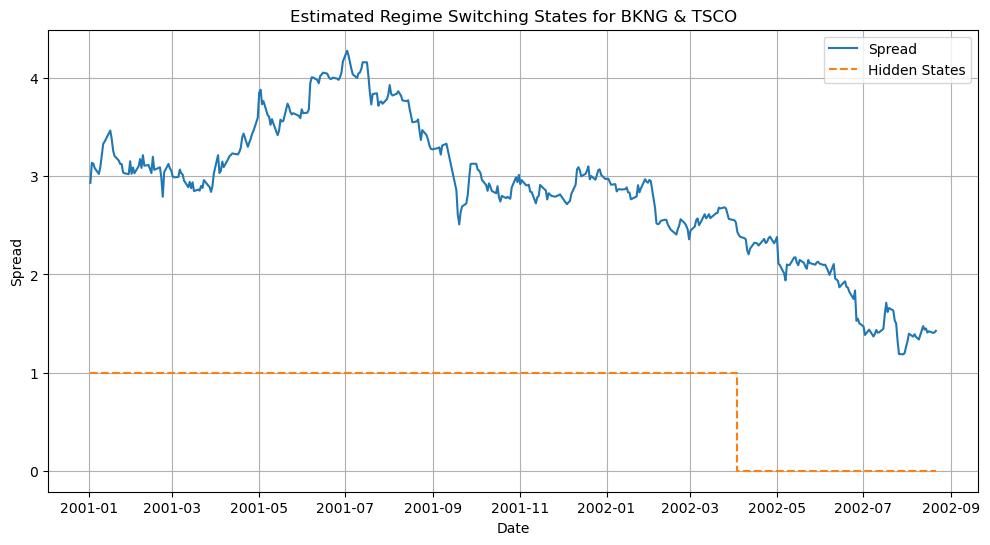

In [113]:
# Example usage
model(log_prices, 'BKNG', 'TSCO', start_date='2000-12-31', num_days=600) #volatile, nonstationary

Transition Probabilities:
 [[0.98078502 0.01921498]
 [0.00803853 0.99196147]]
Means (Regime Means):
 [-1.22088291 -1.01738596]
Covariances (Spread Variances):
 [0.00579992 0.00427834]


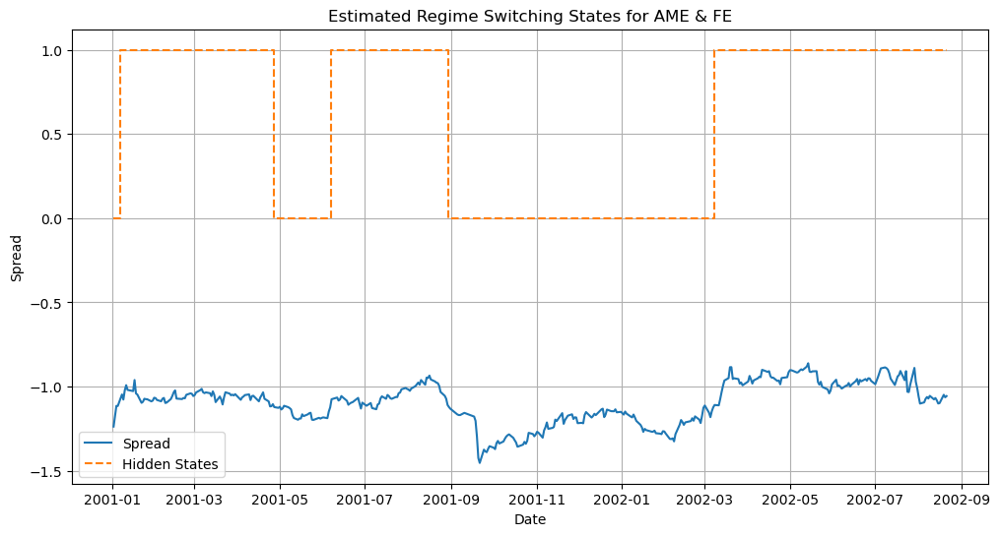

In [114]:
model(log_prices, 'AME', 'FE', start_date='2000-12-31', num_days=600) #low t stat, stationary

### Simple Distance Method Strategy on Cointegrated Pairs

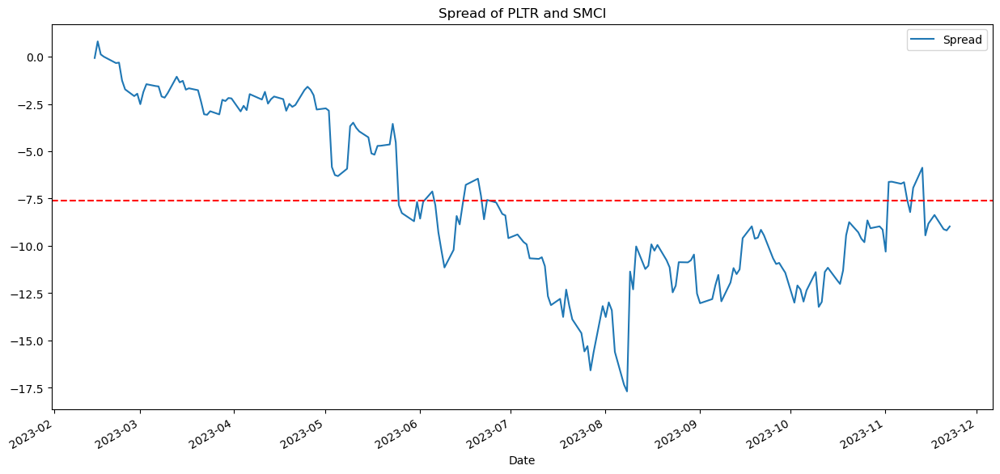

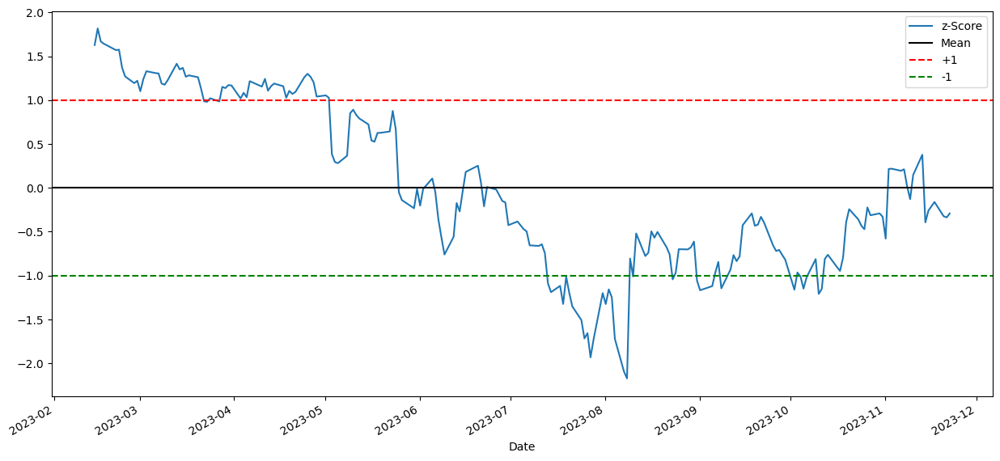

profit (raw price):  225.56905171733283


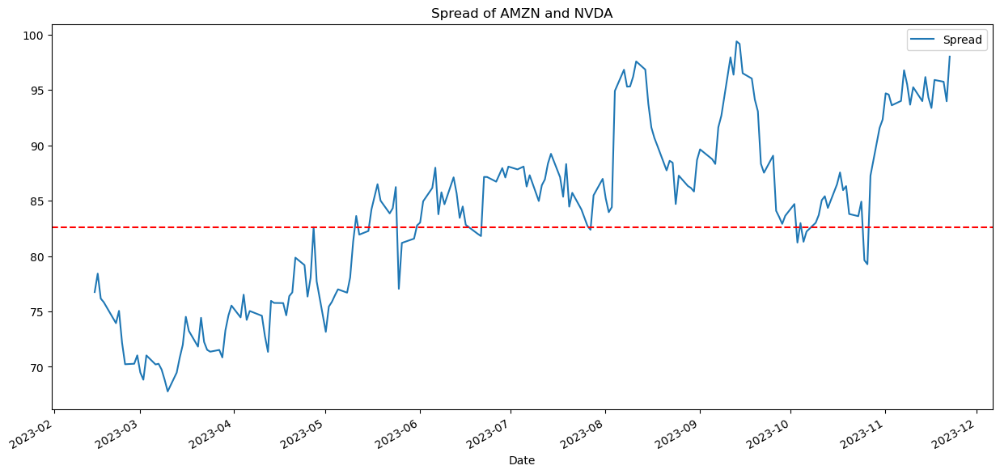

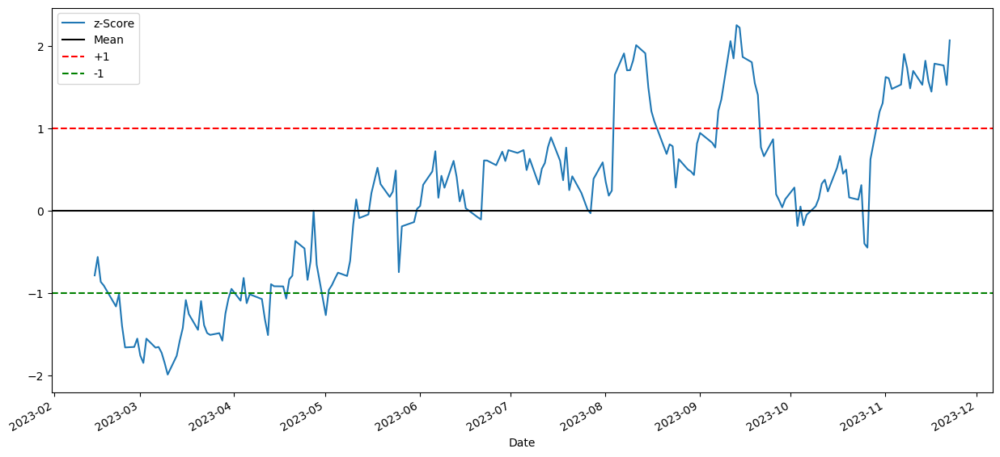

profit (raw price):  298.805057471072


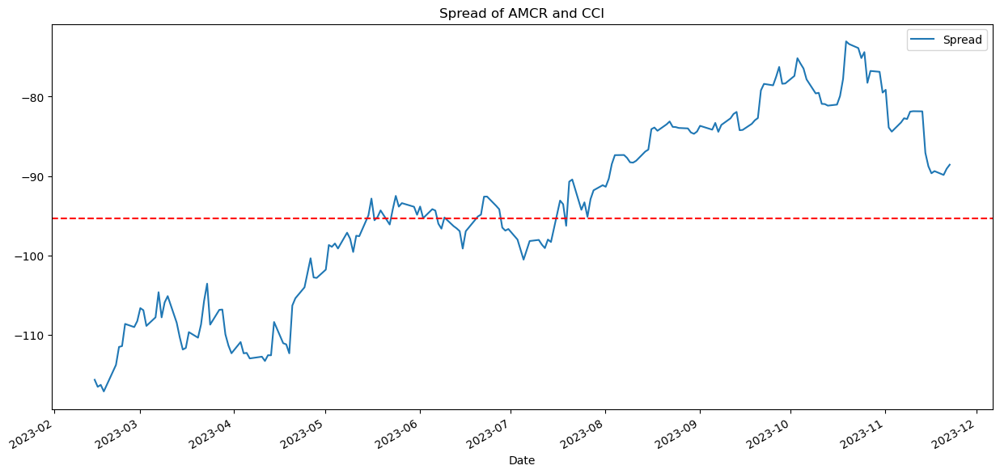

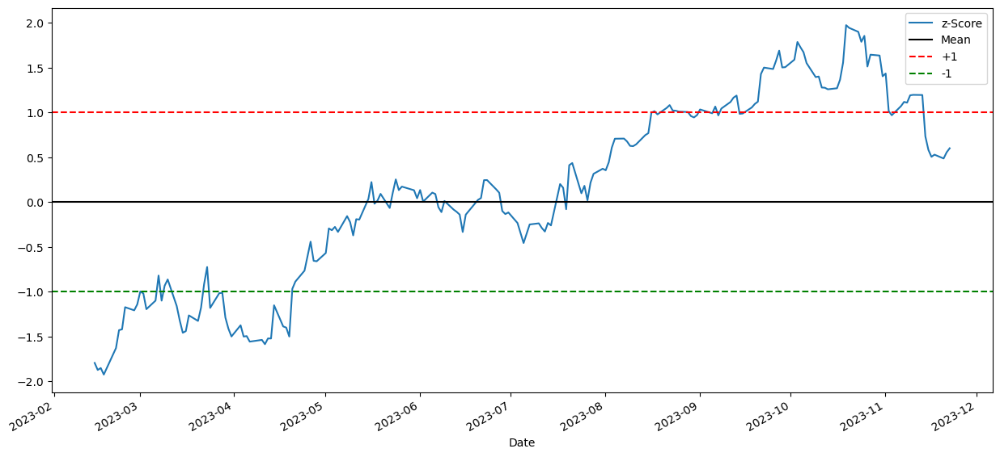

profit (raw price):  57.03896621559835


In [115]:
def extract_date(filename):
        """
        Extracts the formation end date from the pairs_file name and determines the start date for trading.
        """
        formation_start = filename.split("_")[1]
        formation_end = filename.split("_")[2]  # Assuming "pairs_STARTDATE_ENDDATE.csv"
        formation_end_date = datetime.strptime(formation_end.split(".csv")[0], "%Y-%m-%d")
        formation_end_date = pd.to_datetime(formation_end_date, utc=True)
        formation_start_date = pd.to_datetime(formation_start, utc=True)
        return formation_start_date, formation_end_date

def trade_pairs_distance(filename, df=price_df, top_n_pairs=20, trading_horizon_days=180, plot='off'):
        """
        Executes the distance method trading strategy for top n pairs in the pairs file within a defined trading period.
        """

        start_formation, end_formation = extract_date(filename)
        start_date = end_formation + timedelta(days=1)
        trading_horizon = timedelta(days=trading_horizon_days)
        money_list = []
        end_date = start_date + trading_horizon
        end_date = pd.to_datetime(end_date, utc=True)

        if filename[:5] == 'pairs':
            pairs = pd.read_csv('data/coint_pairs/'+filename)
        else:
            pairs = pd.read_csv('data/nocluster_pairs/'+filename)

        pairs = pairs.iloc[:top_n_pairs]

        for _, row in pairs.iterrows():
            asset1_name, asset2_name = row["Asset 1"], row["Asset 2"]
            asset1 = df[asset1_name].loc[start_formation:end_date]
            asset2 = df[asset2_name].loc[start_formation:end_date]
            ratio = asset1/asset2
            spread = asset1 - asset2
            static_mean = spread.loc[start_formation:end_formation].mean()
            static_std = spread.loc[start_formation:end_formation].std()
            zscore1 = (spread - static_mean)/static_std

            ##plot
            if plot == 'on':
                spread.plot(figsize=(15,7))
                plt.axhline(y=static_mean, color='red', linestyle='--', label='Mean')
                plt.legend(['Spread'])
                plt.title(f'Spread of {asset1_name} and {asset2_name}')
                plt.show()
                
                plt.figure(figsize=(15,7))
                zscore1.plot()
                plt.axhline(0, color='black')
                plt.axhline(1.0, color='red', linestyle='--')
                plt.axhline(-1.0, color='green', linestyle='--')
                plt.legend(['z-Score', 'Mean', '+1', '-1'])
                plt.show()
            ##trade
            money = 0
            countS1 = 0
            countS2 = 0
            for i in spread.index:
                # Sell short if the z-score is > 1
                if zscore1[i] > 1:
                        money += asset1[i] - asset2[i]*ratio[i]
                        countS1 -= 1
                        countS2 += ratio[i]
                # Buy long if the z-score is < 1
                elif zscore1[i] < -1:
                        money -= asset1[i] - asset2[i]*ratio[i]
                        countS1 += 1
                        countS2 -= ratio[i]
                # Clear positions if the z-score between -.5 and .5
                elif abs(zscore1[i]) < 0.5:
                        money += countS1*asset1[i] + asset2[i] * countS2
                        countS1 = 0
                        countS2 = 0
                #print('Z-score: '+ str(zscore[i]), countS1, countS2, S1[i] , S2[i])
            if plot =='on': print("profit (raw price): ", money)
            money_list.append(money)
        return money_list
#money_data = plot_pairs('pairs_2004-06-29_2005-03-07.csv', trading_horizon_days=30)     

money_data = trade_pairs_distance('pairs_2023-02-14_2023-10-23.csv', price_df, top_n_pairs=3, trading_horizon_days=30, plot='on')


In [116]:
from scipy.stats import ttest_1samp
from scipy.stats import ttest_ind

def test_mean_greater_than_zero(data, alpha=0.05):
    """
    Tests if the mean of the given data is greater than 0.

    Parameters:
    - data: list or array-like, the sample data.
    - alpha: float, the significance level (default is 0.05).

    Returns:
    - t_stat: float, the t-statistic.
    - p_value: float, the p-value (one-tailed).
    - result: str, the test conclusion.
    """
    # Perform a one-sample t-test
    t_stat, p_value_two_tailed = ttest_1samp(data, popmean=0)
    
    # Convert to one-tailed p-value
    p_value_one_tailed = p_value_two_tailed / 2 if t_stat > 0 else 1.0

    # Conclusion
    if p_value_one_tailed < alpha:
        result = "Reject the null hypothesis: The mean is greater than 0."
    else:
        result = ""

    return t_stat, p_value_one_tailed, result

def test_mean_greater_than(data1, data2, alpha=0.05):
    """
    Tests whether the mean of data1 is greater than the mean of data2.

    Parameters:
    - data1: list or array-like, the first sample.
    - data2: list or array-like, the second sample.
    - alpha: float, significance level (default is 0.05).

    Returns:
    - t_stat: float, the t-statistic.
    - p_value: float, the one-tailed p-value.
    - result: str, the conclusion of the test.
    """
    # Perform a two-sample t-test
    t_stat, p_value_two_tailed = ttest_ind(data1, data2, equal_var=False)
    
    # Convert to one-tailed p-value
    p_value_one_tailed = p_value_two_tailed / 2 if t_stat > 0 else 1.0

    # Test result
    if p_value_one_tailed < alpha:
        result = "REJECT the null: Clustering achieves better returns."
    else:
        result = ""
    
    return t_stat, p_value_one_tailed, result

# Example Usage
data1 = [2.1, 3.5, 4.0, 5.2]  # Sample 1
data2 = [1.0, 1.5, 2.3, 3.0]  # Sample 2

t_stat, p_value, result = test_mean_greater_than(data1, data2)
print(f"T-statistic: {t_stat:.4f}")
print(f"P-value: {p_value:.4f}")
print(result)

T-statistic: 2.2483
P-value: 0.0356
REJECT the null: Clustering achieves better returns.


With clustering, avg results is 259.3630275588146
Without, avg results is -41.29134778622082
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 200.03588163180493
Without, avg results is 117.128742387249
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 129.8482174285539
Without, avg results is 149.1586921811987
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 41.955842312264224
Without, avg results is 45.211726213690426
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 82.74133239798974
Without, avg results is 107.17862328484846
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 68.60629994956831
Without, avg results is 80.19849252335723
__


With clustering, avg results is 32.151232141798204
Without, avg results is 15.219226636250633
__
Reject the null hypothesis: The mean is gr

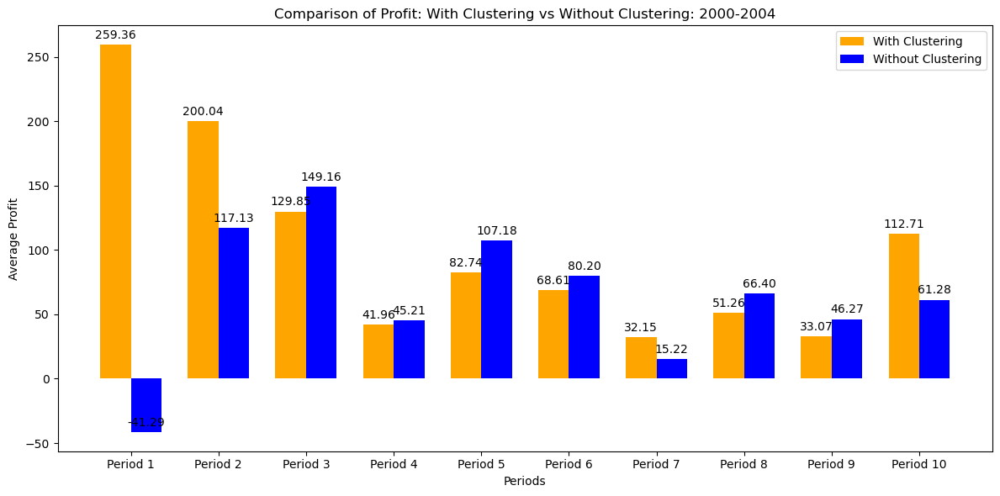

################# recent:
With clustering, avg results is 247.10707433000093
Without, avg results is 286.79098053606623
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 456.65012713382214
Without, avg results is 233.01800309223145
__
Reject the null hypothesis: The mean is greater than 0.
REJECT the null: Clustering achieves better returns.
With clustering, avg results is 915.5663362936999
Without, avg results is 414.6867134979719
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 425.43626845845426
Without, avg results is 249.70632007312412
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 289.5072026712651
Without, avg results is 634.0274728177934
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 492.97582948116406
Without, avg results is 637.0670066042605
__
Reject the null hypothesis: The mean is greater than 0.

Wit

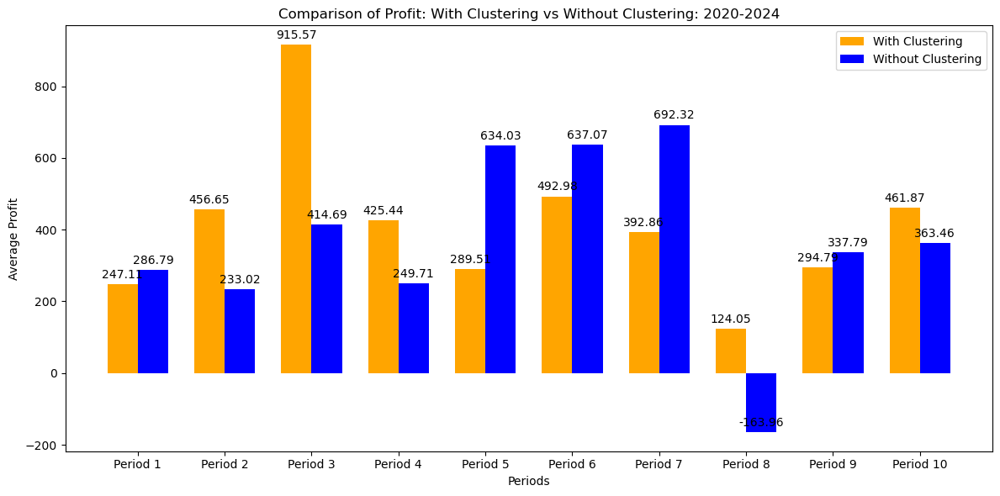

In [117]:
import numpy as np
import matplotlib.pyplot as plt

filenames = [
    'pairs_2000-05-09_2001-01-15.csv',
    'pairs_2000-09-12_2001-05-21.csv',
    'pairs_2001-05-22_2002-01-28.csv',
    'pairs_2001-09-25_2002-06-03.csv',
    'pairs_2002-01-29_2002-10-07.csv',
    'pairs_2002-06-04_2003-02-10.csv',
    'pairs_2002-10-08_2003-06-16.csv',
    'pairs_2003-02-11_2003-10-20.csv',
    'pairs_2003-06-17_2004-02-23.csv',
    'pairs_2003-10-21_2004-06-28.csv',
]

# Initialize lists to store average returns for plotting
avg_returns_with_cluster = []
avg_returns_without_cluster = []

# Iterate through filenames and compute returns
for f in filenames:
    f2 = 'nocluster' + f
    money_list = trade_pairs_distance(f, trading_horizon_days=30) #change to trade_pairs_rolling to get the results for that strategy
    money_list2 = trade_pairs_distance(f2, trading_horizon_days=30)

    # Compute averages
    avg_with_cluster = np.mean(money_list)
    avg_without_cluster = np.mean(money_list2)
    avg_returns_with_cluster.append(avg_with_cluster)
    avg_returns_without_cluster.append(avg_without_cluster)

    # Print results
    print(f"With clustering, avg results is {avg_with_cluster}")
    print(f"Without, avg results is {avg_without_cluster}")
    _, _, result_0 = test_mean_greater_than_zero(money_list)
    _, _, result = test_mean_greater_than(money_list, money_list2)
    print("__")
    if avg_with_cluster > 0:
        print(result_0)
    print(result)

# Plot the comparison of returns
x_labels = [f"Period {i+1}" for i in range(len(filenames))]
x = np.arange(len(x_labels))  # Label locations
width = 0.35  # Width of the bars

# Create the bar chart
fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width/2, avg_returns_with_cluster, width, label='With Clustering', color='orange')
bars2 = ax.bar(x + width/2, avg_returns_without_cluster, width, label='Without Clustering', color='blue')

# Adding labels, title, and legend
ax.set_xlabel("Periods")
ax.set_ylabel("Average Profit")
ax.set_title("Comparison of Profit: With Clustering vs Without Clustering: 2000-2004")
ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.legend()

# Adding values above the bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

# Display the plot
plt.tight_layout()
plt.show()


print("################# recent:")    
later_filenames = [
    'pairs_2020-09-15_2021-05-24.csv',
    'pairs_2021-01-19_2021-09-27.csv',
    'pairs_2021-05-25_2022-01-31.csv',
    'pairs_2021-09-28_2022-06-06.csv',
    'pairs_2022-02-01_2022-10-10.csv',
    'pairs_2022-06-07_2023-02-13.csv',
    'pairs_2022-10-11_2023-06-19.csv',
    'pairs_2023-02-14_2023-10-23.csv',
    'pairs_2023-06-20_2024-02-26.csv',
    'pairs_2024-02-27_2024-11-04.csv'
]
avg_returns_with_cluster = []
avg_returns_without_cluster = []

# Iterate through filenames and compute returns
for f in later_filenames:
    f2 = 'nocluster' + f
    money_list = trade_pairs_distance(f, trading_horizon_days=30)
    money_list2 = trade_pairs_distance(f2, trading_horizon_days=30)

    # Compute averages
    avg_with_cluster = np.mean(money_list)
    avg_without_cluster = np.mean(money_list2)
    avg_returns_with_cluster.append(avg_with_cluster)
    avg_returns_without_cluster.append(avg_without_cluster)

    # Print results
    print(f"With clustering, avg results is {avg_with_cluster}")
    print(f"Without, avg results is {avg_without_cluster}")
    _, _, result_0 = test_mean_greater_than_zero(money_list)
    _, _, result = test_mean_greater_than(money_list, money_list2)
    print("__")
    if avg_with_cluster > 0:
        print(result_0)
    print(result)

# Plot the comparison of returns
x_labels = [f"Period {i+1}" for i in range(len(filenames))]
x = np.arange(len(x_labels))  # Label locations
width = 0.35  # Width of the bars

# Create the bar chart
fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width/2, avg_returns_with_cluster, width, label='With Clustering', color='orange')
bars2 = ax.bar(x + width/2, avg_returns_without_cluster, width, label='Without Clustering', color='blue')

# Adding labels, title, and legend
ax.set_xlabel("Periods")
ax.set_ylabel("Average Profit")
ax.set_title("Comparison of Profit: With Clustering vs Without Clustering: 2020-2024")
ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.legend()

# Adding values above the bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

# Display the plot
plt.tight_layout()
plt.show()

### Rolling-Mean Distance Method Strategy on Cointegrated Pairs

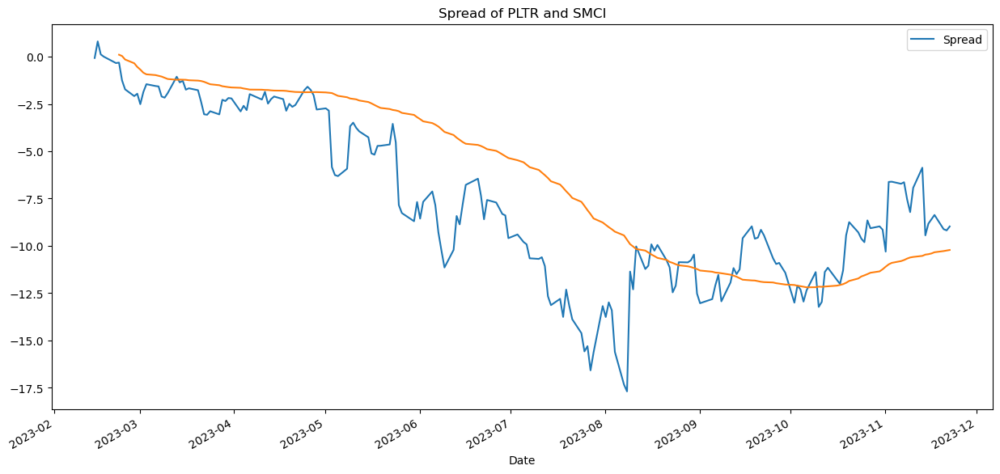

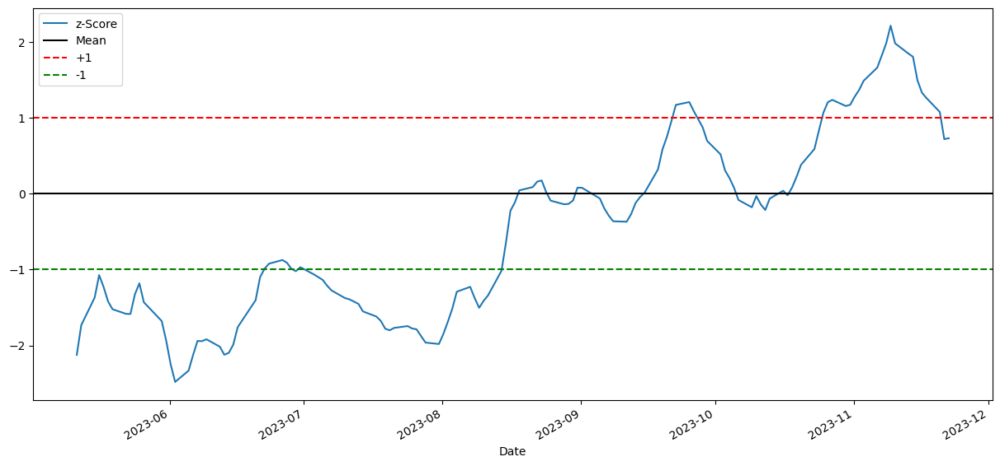

-9.129567197576662


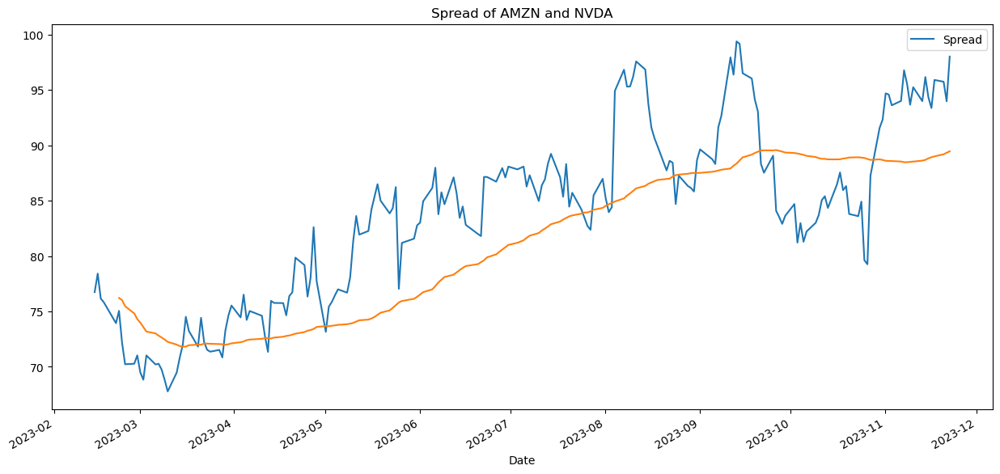

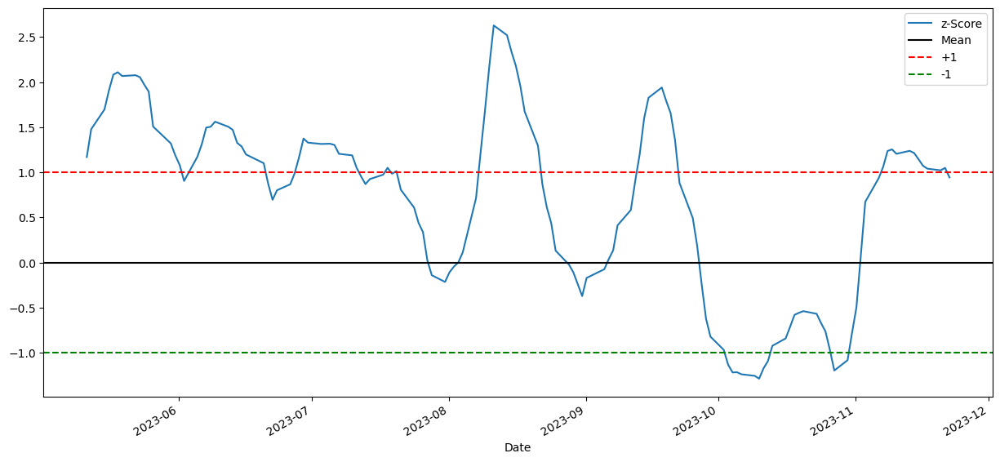

1077.0578642188063


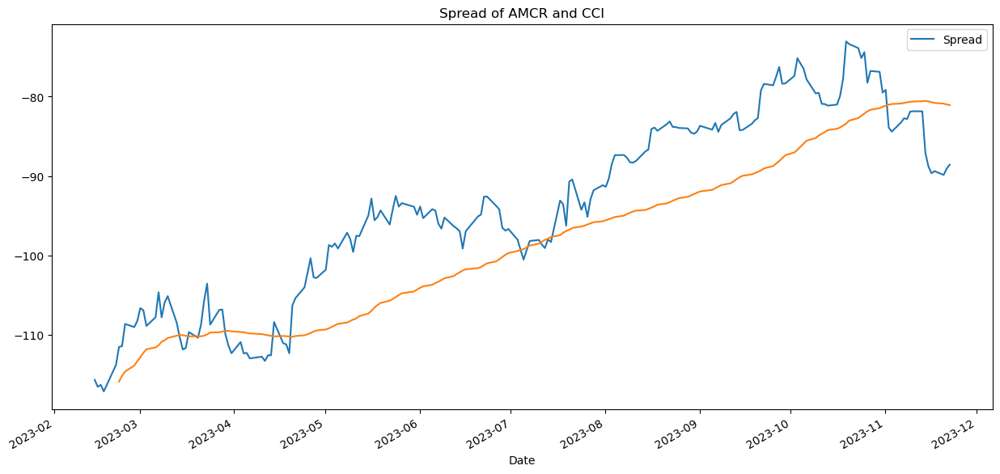

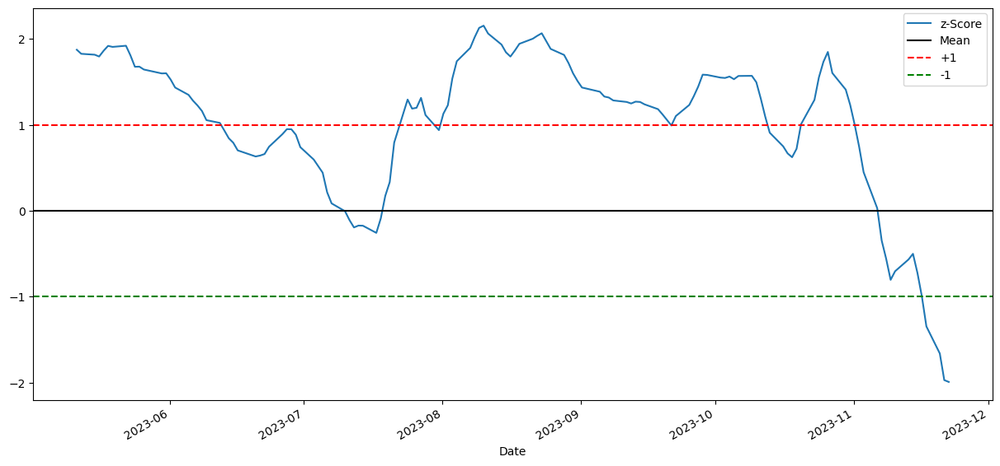

35.111311101632026


In [118]:
def trade_pairs_rolling(filename, df=price_df, top_n_pairs=20, trading_horizon_days=180, plot='off'):
        """
        Executes the rolling mean trading strategy for top n pairs in the pairs file within a defined trading period.
        """
        start_formation, end_formation = extract_date(filename)
        start_date = end_formation + timedelta(days=1)
        trading_horizon = timedelta(days=trading_horizon_days)
        money_list = []
        end_date = start_date + trading_horizon
        end_date = pd.to_datetime(end_date, utc=True)

        if filename[:5] == 'pairs':
            pairs = pd.read_csv('data/coint_pairs/'+filename)
        else:
            pairs = pd.read_csv('data/nocluster_pairs/'+filename)

        pairs = pairs.iloc[:top_n_pairs]

        for _, row in pairs.iterrows():
            asset1_name, asset2_name = row["Asset 1"], row["Asset 2"]
            asset1 = df[asset1_name].loc[start_formation:end_date]
            asset2 = df[asset2_name].loc[start_formation:end_date]
            spread = asset1 - asset2
            ratio = asset1/asset2
            rolling_mean_5 = spread.shift(1).rolling(window=5, min_periods=5).mean() #avoid lookahead bias
            rolling_mean = spread.shift(1).rolling(window=60, min_periods=5).mean()
            rolling_std = spread.shift(1).rolling(window=60,center=False).std()
            zscore= (rolling_mean_5 - rolling_mean)/rolling_std

            if plot == 'on':
                spread.plot(figsize=(15,7))
                rolling_mean.plot()
                plt.legend(['Spread'])
                plt.title(f'Spread of {asset1_name} and {asset2_name}')
                plt.show()
                plt.figure(figsize=(15,7))
                zscore.plot()
                plt.axhline(0, color='black')
                plt.axhline(1.0, color='red', linestyle='--')
                plt.axhline(-1.0, color='green', linestyle='--')
                plt.legend(['z-Score', 'Mean', '+1', '-1'])
                plt.show()
            ##trade
            money = 0
            countS1 = 0
            countS2 = 0
            for i in spread.index:
                # Sell short if the z-score is > 1
                if zscore[i] > 1:
                        money += asset1[i] - asset2[i]*ratio[i]
                        countS1 -= 1
                        countS2 += ratio[i]
                # Buy long if the z-score is < 1
                elif zscore[i] < -1:
                        money -= asset1[i] - asset2[i]*ratio[i]
                        countS1 += 1
                        countS2 -= ratio[i]
                # Clear positions if the z-score between -.5 and .5
                elif abs(zscore[i]) < 0.5:
                        money += countS1*asset1[i] + asset2[i] * countS2
                        countS1 = 0
                        countS2 = 0
                #print('Z-score: '+ str(zscore[i]), countS1, countS2, S1[i] , S2[i])
            if plot == 'on': print(money)
            money_list.append(money)
        return money_list

money_data = trade_pairs_rolling('pairs_2023-02-14_2023-10-23.csv', top_n_pairs=3, trading_horizon_days=30, plot='on')

With clustering, avg results is -31.878106008278962
Without, avg results is 402.0406938922876
__

With clustering, avg results is 74.06645775869002
Without, avg results is 54.20231546928231
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is -56.86788507087005
Without, avg results is -13.422827750091807
__

With clustering, avg results is 13.400567052787341
Without, avg results is 20.15549785175667
__


With clustering, avg results is 47.13746285614069
Without, avg results is 26.078343805648778
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 14.73381838266225
Without, avg results is 31.766630868183245
__


With clustering, avg results is 27.625017234629233
Without, avg results is 29.349123892784927
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 32.382360264765396
Without, avg results is 30.54517778763241
__
Reject the null hypothesis: The mean is greater than

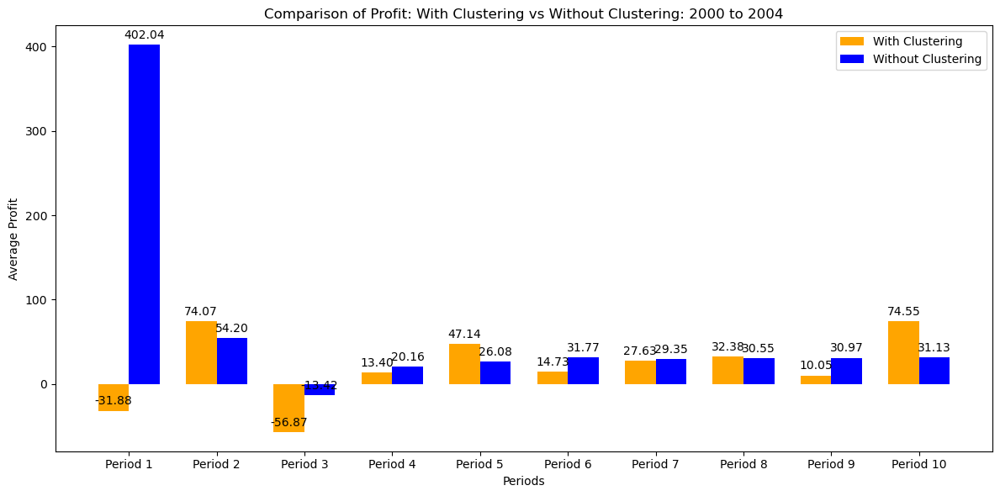

################# recent:
With clustering, avg results is 218.49122068938914
Without, avg results is 188.58017100889538
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 8.760036240557202
Without, avg results is -48.72855170485407
__


With clustering, avg results is 138.2270869154401
Without, avg results is 230.91130188069556
__


With clustering, avg results is -14.48939261814355
Without, avg results is 284.61679726274434
__

With clustering, avg results is 181.03999318393747
Without, avg results is 220.88471639248345
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 251.41234008229898
Without, avg results is 352.04561262666977
__
Reject the null hypothesis: The mean is greater than 0.

With clustering, avg results is 375.0779934442093
Without, avg results is -389.47645902122224
__


With clustering, avg results is 622.6863691975584
Without, avg results is 693.2007938214044
__


With clustering, avg r

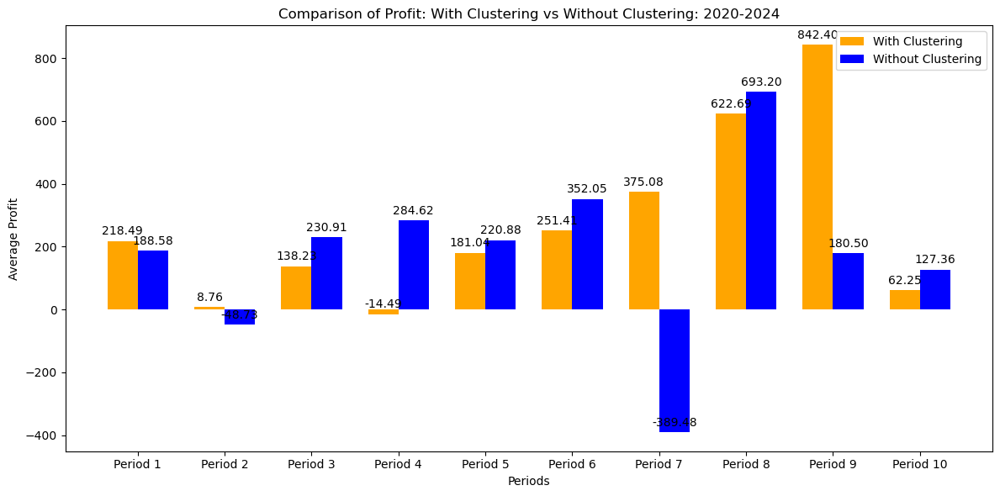

In [ ]:
filenames = [
    'pairs_2000-05-09_2001-01-15.csv',
    'pairs_2000-09-12_2001-05-21.csv',
    'pairs_2001-05-22_2002-01-28.csv',
    'pairs_2001-09-25_2002-06-03.csv',
    'pairs_2002-01-29_2002-10-07.csv',
    'pairs_2002-06-04_2003-02-10.csv',
    'pairs_2002-10-08_2003-06-16.csv',
    'pairs_2003-02-11_2003-10-20.csv',
    'pairs_2003-06-17_2004-02-23.csv',
    'pairs_2003-10-21_2004-06-28.csv',
]

# Initialize lists to store average returns for plotting
avg_returns_with_cluster = []
avg_returns_without_cluster = []

# Iterate through filenames and compute returns
for f in filenames:
    f2 = 'nocluster' + f
    money_list = trade_pairs_rolling(f, trading_horizon_days=30) #change to trade_pairs_rolling to get the results for that strategy
    money_list2 = trade_pairs_rolling(f2, trading_horizon_days=30)

    # Compute averages
    avg_with_cluster = np.mean(money_list)
    avg_without_cluster = np.mean(money_list2)
    avg_returns_with_cluster.append(avg_with_cluster)
    avg_returns_without_cluster.append(avg_without_cluster)

    # Print results
    print(f"With clustering, avg results is {avg_with_cluster}")
    print(f"Without, avg results is {avg_without_cluster}")
    _, _, result_0 = test_mean_greater_than_zero(money_list)
    _, _, result = test_mean_greater_than(money_list, money_list2)
    print("__")
    if avg_with_cluster > 0:
        print(result_0)
    print(result)

# Plot the comparison of returns
x_labels = [f"Period {i+1}" for i in range(len(filenames))]
x = np.arange(len(x_labels))  # Label locations
width = 0.35  # Width of the bars

# Create the bar chart
fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width/2, avg_returns_with_cluster, width, label='With Clustering', color='orange')
bars2 = ax.bar(x + width/2, avg_returns_without_cluster, width, label='Without Clustering', color='blue')

# Adding labels, title, and legend
ax.set_xlabel("Periods")
ax.set_ylabel("Average Profit")
ax.set_title("Comparison of Profit: With Clustering vs Without Clustering: 2000 to 2004")
ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.legend()

# Adding values above the bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

# Display the plot
plt.tight_layout()
plt.show()


print("################# recent:")    
later_filenames = [
    'pairs_2020-09-15_2021-05-24.csv',
    'pairs_2021-01-19_2021-09-27.csv',
    'pairs_2021-05-25_2022-01-31.csv',
    'pairs_2021-09-28_2022-06-06.csv',
    'pairs_2022-02-01_2022-10-10.csv',
    'pairs_2022-06-07_2023-02-13.csv',
    'pairs_2022-10-11_2023-06-19.csv',
    'pairs_2023-02-14_2023-10-23.csv',
    'pairs_2023-06-20_2024-02-26.csv',
    'pairs_2024-02-27_2024-11-04.csv'
]
avg_returns_with_cluster = []
avg_returns_without_cluster = []

# Iterate through filenames and compute returns
for f in later_filenames:
    f2 = 'nocluster' + f
    money_list = trade_pairs_rolling(f, trading_horizon_days=30)
    money_list2 = trade_pairs_rolling(f2, trading_horizon_days=30)

    # Compute averages
    avg_with_cluster = np.mean(money_list)
    avg_without_cluster = np.mean(money_list2)
    avg_returns_with_cluster.append(avg_with_cluster)
    avg_returns_without_cluster.append(avg_without_cluster)

    # Print results
    print(f"With clustering, avg results is {avg_with_cluster}")
    print(f"Without, avg results is {avg_without_cluster}")
    _, _, result_0 = test_mean_greater_than_zero(money_list)
    _, _, result = test_mean_greater_than(money_list, money_list2)
    print("__")
    if avg_with_cluster > 0:
        print(result_0)
    print(result)

# Plot the comparison of returns
x_labels = [f"Period {i+1}" for i in range(len(filenames))]
x = np.arange(len(x_labels))  # Label locations
width = 0.35  # Width of the bars

# Create the bar chart
fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width/2, avg_returns_with_cluster, width, label='With Clustering', color='orange')
bars2 = ax.bar(x + width/2, avg_returns_without_cluster, width, label='Without Clustering', color='blue')

# Adding labels, title, and legend
ax.set_xlabel("Periods")
ax.set_ylabel("Average Profit")
ax.set_title("Comparison of Profit: With Clustering vs Without Clustering: 2020-2024")
ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.legend()

# Adding values above the bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

# Display the plot
plt.tight_layout()
plt.show()

### Vasicek Spread Model + 2-Regime HMM Model
We tried two variations of this.


The first block of code fits a regime switching MLE at the same time as the Vasicek model. Honestly not super sure how it did it (ChatGPT wrote the code), so we ended up dropping this code since it wasn't fitting correctly.

The second block of code fits an 2-state HMM to the formation period data and then fits Vasicek models after, to each regime. We were able to fit Vasicek models for each regime but the parameters + trading rule resulted in continuous sell signals, and we weren't sure how to fix this. 

In the end, neither of these models ended up working, so we ended up dropping the Vasicek spread fitting and used a simpler distance method trading rule instead.

In [120]:
# # import pandas as pd
# # import numpy as np
# # import matplotlib.pyplot as plt
# # from itertools import combinations
# # from scipy.optimize import minimize
# # from scipy.stats import norm

# # # Step 1: SSD-Based Pair Selection (in method calculate_ssd(data, start_date, num_days=365, top_n=20, min_valid_ratio=0.8))

# # # Step 2: Maximum Likelihood Regime-Switching Model
# # class RegimeSwitchingMLE:
# #     def __init__(self, spread):
# #         self.spread = np.array(spread)
# #         self.n = len(spread)

# #     def likelihood(self, params):
# #         kappa_low, theta_low, sigma_low, kappa_high, theta_high, sigma_high, p_11, p_22 = params
# #         p_12, p_21 = 1 - p_11, 1 - p_22
# #         regime_probs = np.zeros((self.n, 2))
# #         regime_probs[0] = [0.5, 0.5]
# #         log_likelihood = 0

# #         for t in range(1, self.n):
# #             f_low = norm.pdf(
# #                 self.spread[t],
# #                 loc=kappa_low * (theta_low + self.spread[t - 1]),
# #                 scale=sigma_low
# #             )
# #             f_high = norm.pdf(
# #                 self.spread[t],
# #                 loc=kappa_high * (theta_high + self.spread[t - 1]),
# #                 scale=sigma_high
# #             )

# #             p_low = f_low * (p_11 * regime_probs[t - 1, 0] + p_21 * regime_probs[t - 1, 1])
# #             p_high = f_high * (p_12 * regime_probs[t - 1, 0] + p_22 * regime_probs[t - 1, 1])
# #             total_prob = p_low + p_high

# #             regime_probs[t, 0] = p_low / total_prob
# #             regime_probs[t, 1] = p_high / total_prob
# #             log_likelihood += np.log(total_prob)

# #         return -log_likelihood

# #     def fit(self, initial_params):
# #         result = minimize(
# #             self.likelihood,
# #             initial_params,
# #             bounds=[
# #                 (0.01, 1), (-5, 5), (0.01, 5),
# #                 (0.01, 1), (-5, 5), (0.01, 5),
# #                 (0.7, 1), (0.7, 1)
# #             ],
# #             method='L-BFGS-B'
# #         )
# #         params = result.x
# #         self.params = {
# #             "kappa_low": params[0],
# #             "theta_low": params[1],
# #             "sigma_low": params[2],
# #             "kappa_high": params[3],
# #             "theta_high": params[4],
# #             "sigma_high": params[5],
# #             "p_11": params[6],
# #             "p_22": params[7],
# #             "p_12": 1 - params[6],
# #             "p_21": 1 - params[7]
# #         }
# #         return result


# # # Step 3: Rolling Window Estimation
# # # def estimate_parameters_with_1_day_move(spread, window=365):
# # #     parameter_history = []
# # #     for start in range(len(spread) - window):
# # #         print(f"Iteration {start}\n")
# # #         rolling_spread = spread[start:start + window]
# # #         rs_model = RegimeSwitchingMLE(rolling_spread)
# # #         initial_params = [0.5, 0, 1, 0.5, 0, 1, 0.9, 0.9]
# # #         rs_model.fit(initial_params)
# # #         parameter_history.append(rs_model.params)
# # #     return parameter_history

# # def estimate_parameters_with_1_day_move(spread, window=365):
# #     """
# #     Optimized rolling window parameter estimation for RegimeSwitchingMLE.
# #     """
# #     parameter_history = []
# #     rolling_spread = spread.loc[:window]  # Initial rolling window
# #     rs_model = RegimeSwitchingMLE(rolling_spread)
# #     initial_params = [0.5, 0, 1, 0.5, 0, 1, 0.9, 0.9]
# #     rs_model.fit(initial_params)
# #     parameter_history.append(rs_model.params)

# #     print(f"Initial window completed with parameters: {rs_model.params}\n")

# #     # Use the initial window and update iteratively
# #     for start in range(1, len(spread) - window):
# #         print(f"Iteration {start}\n")
# #         new_value = spread.loc[start + window - 1]  # New value entering the window
# #         old_value = spread.loc[start - 1]          # Old value leaving the window

# #         # Update the spread (efficient memory handling)
# #         rolling_spread = np.roll(rolling_spread, -1)  # Shift left
# #         rolling_spread[-1] = new_value                # Update the last value

# #         # Fit model for updated spread
# #         rs_model = RegimeSwitchingMLE(rolling_spread)
# #         rs_model.fit(initial_params)
# #         parameter_history.append(rs_model.params)

# #         if start % 10 == 0:  # Print progress every 10 iterations
# #             print(f"Iteration {start}: Params - {rs_model.params}")

# #     return parameter_history


# import numpy as np
# from scipy.stats import norm
# from scipy.optimize import minimize


# class RegimeSwitchingMLE:
#     def __init__(self, spread):
#         self.spread = np.array(spread)
#         self.n = len(spread)

#     def likelihood(self, params, spread=None):
#         """
#         Calculate the likelihood for the regime-switching Vasicek model.
#         Accepts a `spread` argument for flexibility; defaults to `self.spread`.
#         """
#         if spread is None:
#             spread = self.spread
#         spread = np.array(spread)
#         n = len(spread)

#         kappa_low, theta_low, sigma_low, kappa_high, theta_high, sigma_high, p_11, p_22 = params
#         p_12, p_21 = 1 - p_11, 1 - p_22

#         # Initialize probabilities
#         regime_probs = np.zeros((n, 2))
#         regime_probs[0] = [0.5, 0.5]  # Equal probability at start

#         log_likelihood = 0
#         for t in range(1, n):
#             # Regime densities
#             f_low = norm.pdf(spread[t], loc=kappa_low * (theta_low + spread[t - 1]), scale=sigma_low)
#             f_high = norm.pdf(spread[t], loc=kappa_high * (theta_high + spread[t - 1]), scale=sigma_high)

#             # Regime probabilities
#             p_low = f_low * (p_11 * regime_probs[t - 1, 0] + p_21 * regime_probs[t - 1, 1])
#             p_high = f_high * (p_12 * regime_probs[t - 1, 0] + p_22 * regime_probs[t - 1, 1])
#             total_prob = p_low + p_high + 1e-10  # Prevent division by very small numbers

#             regime_probs[t, 0] = p_low / total_prob
#             regime_probs[t, 1] = p_high / total_prob
#             log_likelihood += np.log(total_prob)

#         return -log_likelihood

#     def fit(self, initial_params):
#         """
#         Fit the model using maximum likelihood estimation.
#         """
#         bounds = [
#             (-5,5), (0,10), (0, 10),   # kappa_low, theta_low, sigma_low
#             (-5,5), (10,20), (0, 10),   # kappa_high, theta_high, sigma_high
#             (0, 1), (0, 1)                   # p_11, p_22
#         ]

# #         # Clip initial parameters to be within bounds
# #         initial_params = np.clip(
# #             initial_params,
# #             [b[0] for b in bounds],
# #             [b[1] for b in bounds]
# #         )

#         # Pass likelihood as a callable with fixed `spread`
#         result = minimize(
#             fun=lambda params: self.likelihood(params, spread=self.spread),
#             x0=initial_params,
#             bounds=bounds,
#             method='L-BFGS-B'
#         )

#         # Diagnostics
#         print(f"Optimization success: {result.success}, Message: {result.message}")
#         if not result.success:
#             raise ValueError(f"Optimization failed: {result.message}")

#         params = result.x
#         self.params = {
#             "kappa_low": params[0],
#             "theta_low": params[1],
#             "sigma_low": params[2],
#             "kappa_high": params[3],
#             "theta_high": params[4],
#             "sigma_high": params[5],
#             "p_11": params[6],
#             "p_22": params[7],
#         }

#         return self.params

# def estimate_parameters_with_rolling_update(spread, window=365):
#     """
#     Estimate parameters for rolling windows with efficient updates.
#     """
#     # Initialize rolling window
#     rolling_spread = spread.iloc[:window]
#     initial_params = [0.5, 0, 1, 0.5, 0, 1, 0.9, 0.9]

#     # Fit the first window
#     print("Fitting initial window...")
#     model = RegimeSwitchingMLE(rolling_spread)
#     params = model.fit(initial_params)
#     parameter_history = [params]
#     print(f"Initial window params: {params}")

#     # Efficient rolling updates
#     for i in range(1, len(spread) - window):
#         # Update the rolling spread: shift left and append the new value
#         rolling_spread = np.roll(rolling_spread, -1)
#         rolling_spread[-1] = spread.iloc[i + window - 1]

#         # Fit the updated window
#         model = RegimeSwitchingMLE(rolling_spread)
#         params = model.fit(initial_params)
#         parameter_history.append(params)

#         if i % 10 == 0:  # Progress update every 10 iterations
#             print(f"Window {i}: Params - {params}")

#     return parameter_history


# # Step 4: Generate Trading Signals
# def generate_signals(spread, params, delta=1.96):
#     signals = []
#     for t in range(1, len(spread)):
#         prev_spread = spread[t - 1]
#         curr_spread = spread[t]

#         high_threshold_low = params["kappa_low"] * (params["theta_low"] + prev_spread) + delta * params["sigma_low"]
#         low_threshold_low = params["kappa_low"] * (params["theta_low"] + prev_spread) - delta * params["sigma_low"]
#         high_threshold_high = params["kappa_high"] * (params["theta_high"] + prev_spread) + delta * params["sigma_high"]
#         low_threshold_high = params["kappa_high"] * (params["theta_high"] + prev_spread) - delta * params["sigma_high"]

#         if curr_spread >= high_threshold_low:
#             signals.append(-1)  # Sell
#         elif curr_spread <= low_threshold_low:
#             signals.append(1)  # Buy
#         else:
#             signals.append(0)  # Hold
#     return signals


# # Step 5: Evaluate Strategy
# def evaluate_strategy(prices, signals, pair, risk_free_rate=0.05 / 252):
#     """
#     Evaluate trading strategy performance for a given pair, focusing on excess returns.

#     Arguments:
#         prices: DataFrame of stock prices.
#         signals: List of trading signals (-1, 0, 1).
#         pair: Tuple of stock tickers (stock1, stock2).
#         risk_free_rate: Daily risk-free rate (default: 5% annualized).

#     Returns:
#         cumulative_excess_returns: Cumulative excess returns for the trading period.
#         excess_returns: Daily excess returns.
#     """
#     stock1, stock2 = pair
#     daily_returns = []

#     # Calculate daily strategy returns based on signals
#     for t in range(1, len(signals)):
#         if signals[t] == 1:  # Buy spread
#             daily_returns.append(prices[stock1].pct_change().iloc[t] - prices[stock2].pct_change().iloc[t])
#         elif signals[t] == -1:  # Sell spread
#             daily_returns.append(prices[stock2].pct_change().iloc[t] - prices[stock1].pct_change().iloc[t])
#         else:  # Hold
#             daily_returns.append(0)

#     # Subtract risk-free rate to compute excess returns
#     excess_returns = np.array(daily_returns) - risk_free_rate

#     # Cumulative excess returns
#     cumulative_excess_returns = np.cumsum(excess_returns)

#     return cumulative_excess_returns, excess_returns

# # Step 6: Full Pipeline with SSD Pair Selection
# def pairs_trading_pipeline(prices_data, normalized_data, formation_window=365, trading_window=31, step=31, top_n_pairs=1, risk_free_rate=0.05 / 252):
#     """
#     Full pipeline for pairs trading, outputting excess returns as the performance metric.

#     Arguments:
#         data: DataFrame of normalized stock prices.
#         formation_window: Number of days in the formation period (default: 252).
#         trading_window: Number of days in the trading period (default: 21).
#         step: Step size to roll the formation window forward (default: 21 days).
#         top_n_pairs: Number of pairs to select based on smallest SSD.
#         risk_free_rate: Daily risk-free rate (default: 5% annualized).

#     Returns:
#         results: List of dictionaries with excess returns for each pair and period.
#     """
#     results = []
#     parameter_table = []

#     print(f"Starting pairs trading pipeline with the following settings:")
#     print(f"  Formation Window: {formation_window} days")
#     print(f"  Trading Window: {trading_window} days")
#     print(f"  Step Size: {step} days")
#     print(f"  Top N Pairs: {top_n_pairs}")
#     print(f"  Risk-Free Rate (daily): {risk_free_rate:.6f}\n")

#     for start in range(0, len(prices_data) - formation_window - trading_window, step):
#         print(f"Processing window starting at index {start}...")
#         formation_start_date = prices_data.index[start]
#         print(f"  Formation Period Start Date: {formation_start_date}")

#         # Select top pairs based on SSD
#         print("  Calculating SSD for top pairs...")
#         try:
#             ssd_pairs = calculate_ssd(normalized_data, formation_start_date, num_days=formation_window, top_n=top_n_pairs)
#             print(f"    Found {len(ssd_pairs)} valid pairs.")
#         except ValueError as e:
#             print(f"    No valid pairs found: {e}")
#             continue

#         for _, row in ssd_pairs.iterrows():
#             stock1, stock2 = row["Stock 1"], row["Stock 2"]
#             print(f"    Evaluating pair: {stock1} & {stock2}")
#             normalized_spread = normalized_data[stock1] - normalized_data[stock2]
#             # print(spread)

#             # Estimate parameters with 1-day rolling windows
#             print("    Estimating parameters using rolling windows...")
#             simple_spread = prices_data[stock1] - prices_data[stock2]
#             parameter_history = estimate_parameters_with_rolling_update(simple_spread[formation_start_date:], window=formation_window)
#             final_params = parameter_history[-1]
#             print(f"      Final Parameters: {final_params}")

#             # Trading Period
#             trading_data = prices_data.iloc[start + formation_window:start + formation_window + trading_window]
#             trading_spread = trading_data[stock1] - trading_data[stock2]
#             print("    Generating trading signals...")
#             signals = generate_signals(trading_spread, final_params)
#             print(f"      Generated {len(signals)} signals.")

#             # Evaluate Strategy with Excess Returns
#             print("    Evaluating strategy...")
#             cumulative_excess_returns, excess_returns = evaluate_strategy(
#                 trading_data, signals, (stock1, stock2), risk_free_rate=risk_free_rate
#             )
#             print(f"      Cumulative Excess Returns: {cumulative_excess_returns[-1]:.6f}")
#             print(f"      Average Daily Excess Return: {np.mean(excess_returns):.6f}")

#             # Append Results
#             results.append({
#                 "pair": (stock1, stock2),
#                 "formation_period": (start, start + formation_window),
#                 "trading_period": (start + formation_window, start + formation_window + trading_window),
#                 "cumulative_excess_returns": cumulative_excess_returns[-1] if len(cumulative_excess_returns) > 0 else 0,
#                 "average_excess_return": np.mean(excess_returns) if len(excess_returns) > 0 else 0,
#             })

#         print(f"  Completed processing for window starting at index {start}.\n")

#     print("Pairs trading pipeline completed.")
#     print(f"Total evaluation windows processed: {len(results)}")
#     return results

In [121]:
# import numpy as np
# import pandas as pd
# from hmmlearn.hmm import GaussianHMM
# from scipy.optimize import minimize
# from scipy.stats import norm
# import matplotlib.pyplot as plt


# # Step 1: Fit a 2-State HMM
# def fit_hmm(data):
#     """
#     Fit a 2-state Hidden Markov Model to the data.
#     """
#     print("Fitting HMM...")
#     model = GaussianHMM(n_components=2, covariance_type="diag", n_iter=100, random_state=42)
#     model.fit(data.reshape(-1, 1))
#     states = model.predict(data.reshape(-1, 1))
#     print(f"Transition probabilities: p_11={model.transmat_[0, 0]:.4f}, p_22={model.transmat_[1, 1]:.4f}")
#     return model, states

# # def plot_hmm_regimes(spread, regimes, start_date, end_date, stock1, stock2):
# #     """
# #     Plot the spread with the fitted HMM regimes.
# #     """
# #     plt.figure(figsize=(10, 6))
# #     plt.plot(spread.index, spread, label="Spread", color="blue", alpha=0.7)
# #     plt.scatter(spread.index, spread, c=regimes, cmap="viridis", label="HMM Regimes", alpha=0.6)
# #     plt.title(f"HMM-Fitted Regimes for {stock1}-{stock2} Spread ({start_date} to {end_date})")
# #     plt.xlabel("Date")
# #     plt.ylabel("Spread")
# #     plt.legend()
# #     plt.show()

# def plot_hmm_regimes(spread, regimes, start_date, end_date, stock1, stock2):
#     """
#     Plot the spread with the fitted HMM regimes, using shaded regions for each regime.
#     """
#     plt.figure(figsize=(12, 6))
    
#     # Plot the spread as a line
#     plt.plot(spread.index, spread, label="Spread", color="blue", linewidth=1.5)

#     # Shade the regimes
#     regime_colors = {0: "lightblue", 1: "lightgray"}  # Colors for regimes
#     for regime in np.unique(regimes):
#         regime_mask = regimes == regime
#         plt.fill_between(
#             spread.index,
#             spread.min(), spread.max(),  # Fill vertically
#             where=regime_mask,
#             facecolor=regime_colors[regime],
#             alpha=0.3,
#             label=f"Regime {regime}"
#         )
    
#     # Titles and labels
#     plt.title(f"Spread and Regimes for {stock1}-{stock2} ({start_date} to {end_date})", fontsize=14)
#     plt.xlabel("Date", fontsize=12)
#     plt.ylabel("Spread", fontsize=12)
#     plt.legend()
#     plt.grid(alpha=0.5)
#     plt.show()


# # Step 2: Define the Vasicek Model Likelihood Function
# def vasicek_likelihood(params, data):
#     """
#     Compute the negative log-likelihood for the Vasicek model given the parameters.
#     """
#     kappa, theta, sigma = params
#     n = len(data)
#     likelihood = 0
#     for t in range(1, n):
#         mean = theta + (data[t - 1] - theta) * np.exp(-kappa)
#         variance = sigma**2 * (1 - np.exp(-2 * kappa)) / (2 * kappa)
#         likelihood += -0.5 * (np.log(2 * np.pi * variance) + ((data[t] - mean) ** 2) / variance)
#     return -likelihood

# # Step 3: Fit Vasicek Parameters for Each State
# def fit_vasicek(data):
#     """
#     Fit Vasicek parameters using Maximum Likelihood Estimation.
#     """
#     initial_params = [0.1, data.mean(), data.std()]  # Initial guess for kappa, theta, sigma
#     bounds = [(-1,1), (data.min(), data.max()), (0.01, 10)]  # Reasonable bounds
#     result = minimize(vasicek_likelihood, initial_params, args=(data,), bounds=bounds, method="L-BFGS-B")
    
#     if not result.success:
#         print(f"Vasicek fitting failed: {result.message}")
#     return result.x

# def fit_vasicek_moving_window(data, window_size=30):
#     """
#     Estimate Vasicek parameters using a moving window approach.
#     """
# #     print(f"Estimating Vasicek parameters with a moving window of size {window_size}...")
#     n = len(data)
# #     print(n)
# #     input()
#     params_windows = []

#     for start in range(n - window_size + 1):
#         window_data = data[start:start + window_size]
#         params = fit_vasicek(window_data)
#         params_windows.append(params)

# #         if start % 50 == 0:  # Log progress every 50 iterations
# #             print(f"Window {start + 1}/{n - window_size + 1}: kappa={params[0]:.4f}, theta={params[1]:.4f}, sigma={params[2]:.4f}")
        
#         final_params = params_windows[-1] if params_windows else [None, None, None]
#         print(f"    Fit parameters: kappa={final_params[0]:.4f}, theta={final_params[1]:.4f}, sigma={final_params[2]:.4f}")
# #     print("Moving window estimation complete.")
#     return parameters

# # Step 4: Generate Trading Signals
# def generate_signals(spread, params, predicted_states, delta=1.96):
#     """
#     Generate trading signals based on the predicted regime and the Vasicek parameters.
    
#     Arguments:
#         spread: The observed spread data (array).
#         params: Dictionary containing Vasicek parameters for each regime.
#         predicted_states: Array of HMM-predicted states for the trading period.
#         delta: The confidence interval multiplier (e.g., 1.96 for 95% CI).
    
#     Returns:
#         signals: Array of trading signals (-1, 0, +1).
#     """
    
#     if predicted_states is None:
#         print("Generating trading signals based on one regime...")
        
#         signals = []
        
#         # Single-regime Vasicek logic
#         for t in range(1, len(spread)):
#             prev_spread = spread[t - 1]
#             curr_spread = spread[t]

#             high_threshold = params["kappa"] * (params["theta"] + prev_spread) + delta * params["sigma"]
#             low_threshold = params["kappa"] * (params["theta"] + prev_spread) - delta * params["sigma"]

#             # Determine the signal based on the thresholds
#             if curr_spread >= high_threshold:
#                 signals.append(-1)  # Sell
#             elif curr_spread <= low_threshold:
#                 signals.append(1)  # Buy
#             else:
#                 signals.append(0)  # Hold

#         print(f"Signals generated: {len(signals)}")
#         return signals
        
        
#     else:
#         print("Generating trading signals based on two regimes...")
#         signals = []

#         for t in range(1, len(spread)):
#             prev_spread = spread[t - 1]
#             curr_spread = spread[t]
#             regime = predicted_states[t]  # Predicted regime at time t

#             if regime == 0:  # Low mean regime
#                 high_threshold = params["kappa_low"] * (params["theta_low"] + prev_spread) + delta * params["sigma_low"]
#                 low_threshold = params["kappa_low"] * (params["theta_low"] + prev_spread) - delta * params["sigma_low"]
#             elif regime == 1:  # High mean regime
#                 high_threshold = params["kappa_high"] * (params["theta_high"] + prev_spread) + delta * params["sigma_high"]
#                 low_threshold = params["kappa_high"] * (params["theta_high"] + prev_spread) - delta * params["sigma_high"]
#             else:
#                 raise ValueError(f"Invalid regime: {regime}")

#             # Determine the signal based on the thresholds
#             if curr_spread >= high_threshold:
#                 signals.append(-1)  # Sell
#             elif curr_spread <= low_threshold:
#                 signals.append(1)  # Buy
#             else:
#                 signals.append(0)  # Hold

#         print(f"Signals generated: {len(signals)}")
#     return signals

# # Step 5: Evaluate Strategy
# def evaluate_strategy(prices, signals, pair, risk_free_rate=0.05 / 252):
#     print("Evaluating trading strategy...")
#     stock1, stock2 = pair
#     daily_returns = []

#     for t in range(1, len(signals)):
#         if signals[t] == 1:
#             daily_returns.append(prices[stock1].pct_change().iloc[t] - prices[stock2].pct_change().iloc[t])
#         elif signals[t] == -1:
#             daily_returns.append(prices[stock2].pct_change().iloc[t] - prices[stock1].pct_change().iloc[t])
#         else:
#             daily_returns.append(0)

#     excess_returns = np.array(daily_returns) - risk_free_rate
#     cumulative_excess_returns = np.cumsum(excess_returns)

# #     print(f"Strategy evaluated. Cumulative excess returns: {cumulative_excess_returns[-1]:.6f}")
#     return cumulative_excess_returns, excess_returns

# # Step 6: Pairs Trading Pipeline
# def pairs_trading_pipeline(prices_data, normalized_data, formation_window=365, trading_window=30, step=21, top_n_pairs=1, risk_free_rate=0.05 / 252):
#     print("Starting pairs trading pipeline...")
#     results = []

#     for start in range(0, len(prices_data) - formation_window - trading_window, step):
#         formation_start_date = prices_data.index[start]
#         formation_end_date = formation_start_date + pd.Timedelta(days=formation_window - 1)

#         # Filter the relevant date range
#         formation_data = prices_data.loc[formation_start_date:formation_end_date][1:]
#         print(f"----------Formation period: {formation_start_date} to {formation_end_date}----------")

#         # Select top pairs based on SSD
#         print("Calculating SSD and selecting top pairs...")
#         # note that calculate_ssd will filter the data for the correct formation period
#         ssd_pairs = calculate_ssd(normalized_data, formation_start_date, num_days=formation_window, top_n=top_n_pairs)

#         for _, row in ssd_pairs.iterrows():
#             stock1, stock2 = row["Stock 1"], row["Stock 2"]
#             print(f"Processing pair: {stock1} & {stock2}")
#             simple_spread = formation_data[stock1] - formation_data[stock2]
# #             print("HIIIII:", len(simple_spread))
            
#             # Check for NaN values in the spread -- this should not throw an error because calculate_ssd already checks
#             if simple_spread.isna().any():
#                 nan_locations = simple_spread[simple_spread.isna()].index
#                 print(f"NaN values detected in spread for pair {stock1}-{stock2}. Locations: {nan_locations}")
#                 raise ValueError(f"NaN detected in spread for pair {stock1}-{stock2}. Please clean the data.")

#             # Step 1: Fit HMM
#             hmm_model, regimes = fit_hmm(simple_spread.values)
            
#             # Plot the HMM-fitted regimes on the spread
#             plot_hmm_regimes(simple_spread, regimes, formation_start_date, formation_end_date, stock1, stock2)
            
#             regime_0_data = simple_spread[regimes == 0]
# #             print("HIIIII:", len(regime_0_data))
#             regime_1_data = simple_spread[regimes == 1]
# #             print("HIIIII:", len(regime_1_data))

#             # Step 2: Fit Vasicek Parameters for Each Regime 
#             # these few lines did not use moving windows to fit -- it used the entire formation period data at once
# #             print("Estimating Vasicek parameters for regime 0...")
# #             params_0 = fit_vasicek(regime_0_data.values)
# #             print("Estimating Vasicek parameters for regime 1...")
# #             params_1 = fit_vasicek(regime_1_data.values)
            
#             # Step 2: Fit Vasicek Parameters for Each Regime using Moving Windows
#             print("Estimating Vasicek parameters for regime 0...")
#             params_0_windows = (
#                 fit_vasicek_moving_window(regime_0_data.values, window_size=step)
#                 if len(regime_0_data) > step
#                 else None
#             )
#             print("Estimating Vasicek parameters for regime 1...")
#             params_1_windows = (
#                 fit_vasicek_moving_window(regime_1_data.values, window_size=step)
#                 if len(regime_1_data) > step
#                 else None
#             )
            
#             if params_0_windows is None and params_1_windows is None:
#                 print(f"No data assigned to any regime for pair {stock1}-{stock2}. Skipping.")
#                 continue
#             elif params_1_windows is None:
#                 params_0 = params_0_windows[-1]  # Latest parameters for regime 0
#                 final_params = {
#                     "kappa": params_0[0],
#                     "theta": params_0[1],
#                     "sigma": params_0[2]
#                 }
#                 single_regime = True
                
#             elif params_0_windows is None:
#                 params_1 = params_1_windows[-1]  # Latest parameters for regime 1
#                 final_params = {
#                     "kappa": params_1[0],
#                     "theta": params_1[1],
#                     "sigma": params_1[2]
#                 }
#                 single_regime = True
#             else:
#                 params_0 = params_0_windows[-1]  # Latest parameters for regime 0
#                 params_1 = params_1_windows[-1]  # Latest parameters for regime 1
#                 final_params = {
#                     "kappa_low": params_0[0], "theta_low": params_0[1], "sigma_low": params_0[2],
#                     "kappa_high": params_1[0], "theta_high": params_1[1], "sigma_high": params_1[2]
#                 }
#                 single_regime = False


# #             # Step 3: Trading Period and Signals
# #             trading_data = prices_data.iloc[start + formation_window:start + formation_window + trading_window]
# #             trading_spread = trading_data[stock1] - trading_data[stock2]
# #             signals = generate_signals(trading_spread.values, final_params)

#             # Step 3: Predict Regimes for the Trading Period
#             trading_start_date = formation_end_date + pd.Timedelta(days=1)
#             trading_end_date = trading_start_date + pd.Timedelta(days=trading_window - 1)

#             # Filter the relevant date range for the trading period
#             trading_data = prices_data.loc[trading_start_date:trading_end_date]
# #             print("LOL:",len(trading_data))
# #             if len(trading_data) < trading_window:
# #                 print(f"Not enough data for trading period: {trading_start_date} to {trading_end_date}. Skipping.")
# #                 continue

#             trading_spread = trading_data[stock1] - trading_data[stock2]
    
#             # If using single-regime model, no regime prediction is needed
#             if single_regime:
#                 predicted_states = None  # No regimes in single-regime model
                
#             else:
#                 predicted_states = hmm_model.predict(trading_spread.values.reshape(-1, 1))

#             # Step 4: Generate Trading Signals
#             signals = generate_signals(trading_spread.values, final_params, predicted_states)

#             # Step 5: Evaluate Strategy
#             cumulative_excess_returns, excess_returns = evaluate_strategy(
#                 trading_data, signals, (stock1, stock2), risk_free_rate=risk_free_rate
#             )

#             results.append({
#                 "pair": (stock1, stock2),
#                 "formation_period": (start, start + formation_window),
#                 "trading_period": (start + formation_window, start + formation_window + trading_window),
#                 "cumulative_excess_returns": cumulative_excess_returns[-1] if len(cumulative_excess_returns) > 0 else 0,
#                 "average_excess_return": np.mean(excess_returns) if len(excess_returns) > 0 else 0,
#             })

#             print(f"Results for {stock1}-{stock2}: Cumulative Excess Returns={cumulative_excess_returns[-1]:.6f}")
    
#     # Calculate and report overall cumulative results
#     print("\nPipeline completed. Reporting cumulative results...\n")
#     cumulative_df = pd.DataFrame(results)

#     # Calculate aggregate metrics
#     total_cumulative_returns = cumulative_df["cumulative_excess_returns"].sum()
#     average_return_per_pair = cumulative_df["average_excess_return"].mean()
#     total_pairs_evaluated = len(cumulative_df["pair"].unique())
#     total_windows_evaluated = len(cumulative_df)

#     # Print summary
#     print("Cumulative Results Summary:")
#     print(f"  Total Cumulative Excess Returns: {total_cumulative_returns:.6f}")
#     print(f"  Average Excess Return per Pair: {average_return_per_pair:.6f}")
#     print(f"  Total Pairs Evaluated: {total_pairs_evaluated}")
#     print(f"  Total Evaluation Windows: {total_windows_evaluated}")

#     return results

In [122]:
# results = pairs_trading_pipeline(price_df, normalized_prices)
# pd.DataFrame(results)

### Distance Method + 2-State HMM Model on SSD Pairs

This model ended up working (ish?). It fits two regimes to the formation period data then finds the mean and stdev of each regime and sets 1.96 z-score thresholds for each. Then, for each day in the trading period, it predicts what regime that day is in, compares the spread to the thresholds for that regime, and generates a signal (+1, 0, or -1) based on the comparison. At the end of each trading period, all positions are closed.

You can run the following function (pairs_trading_pipeline_ssd) on a variety of number of top SSD pairs, for different trading lengths, and formation windows. In the middle of the function, I also test the ED-SO (Consolidated Edison, Southern Co) pair used in our reference paper -- it's commented out. 

We test TOP 1, TOP 5, and TOP 10 pair selection with 1 month trading below.

In [123]:
import numpy as np
import pandas as pd
from hmmlearn.hmm import GaussianHMM
import matplotlib.pyplot as plt
from datetime import datetime
import os

# Step 1: Fit a 2-State HMM
def fit_hmm(data):
    """
    Fit a 2-state Hidden Markov Model to the data.
    """
    print("Fitting HMM...")
    model = GaussianHMM(n_components=2, covariance_type="diag", n_iter=500, random_state=42)
    model.fit(data.reshape(-1, 1))
    states = model.predict(data.reshape(-1, 1))
    print(f"Transition probabilities: p_11={model.transmat_[0, 0]:.4f}, p_22={model.transmat_[1, 1]:.4f}")
    return model, states


# Step 2: Plot HMM Regimes
def plot_hmm_regimes(spread, regimes, start_date, end_date, stock1, stock2):
    """
    Plot the spread with the fitted HMM regimes, using shaded regions for each regime.
    """
    plt.figure(figsize=(10, 6))
    plt.plot(spread.index, spread, label="Spread", color="blue", linewidth=1.5)

    # Shade the regimes
    regime_colors = {0: "lightblue", 1: "lightgray"}
    for regime in np.unique(regimes):
        regime_mask = regimes == regime
        plt.fill_between(
            spread.index,
            spread.min(), spread.max(),  # Fill vertically
            where=regime_mask,
            facecolor=regime_colors[regime],
            alpha=0.3,
            label=f"Regime {regime}"
        )

    plt.title(f"Spread and Regimes for {stock1}-{stock2} ({start_date} to {end_date})", fontsize=14)
    plt.xlabel("Date", fontsize=12)
    plt.ylabel("Spread", fontsize=12)
    plt.legend()
    plt.grid(alpha=0.5)
    plt.show()


# Step 3: Generate Trading Signals Based on Distance from Mean
def generate_signals_distance_method(spread, means, stds, predicted_states, delta=1.96):
    """
    Generate trading signals based on the distance from the mean for each regime.
    """
    print("Generating trading signals...")
    signals = []

    for t in range(len(spread)):
        curr_spread = spread[t]

        if len(means) == 1: # only one regime fitted in the formation period
            regime = 0
        else: # two regimes fitted
            regime = predicted_states[t]  # Predicted regime at time t

        # Determine thresholds based on the regime
        high_threshold = means[regime] + delta * stds[regime]
        low_threshold = means[regime] - delta * stds[regime]

        # Determine the signal based on the thresholds
        if curr_spread >= high_threshold:
            signals.append(-1)  # Sell
        elif curr_spread <= low_threshold:
            signals.append(1)  # Buy
        else:
            signals.append(0)  # Hold

        # print(f"Spread: {curr_spread}, Predicted Regime: {regime}, High Threshold: {high_threshold}, Low Threshold: {low_threshold}")

    signals[-1] = 0
    # print(f"Signals generated: {signals}")
    return signals

def plot_combined_regimes_and_signals(
    formation_spread, formation_regimes, trading_spread, trading_signals, predicted_states,
    regime_means, regime_stds, start_date, end_date, stock1, stock2
):
    """
    Plot the spread with the fitted HMM regimes for the formation period and trading period,
    including buy/sell signals and high/low thresholds for each regime.
    
    Modifications:
    - Added a vertical line separating formation and trading periods.
    - Extended shaded regions for regimes across the entire y-axis.
    - Added horizontal lines for high/low thresholds that extend across the x-axis.
    - Updated high/low threshold colors based on regimes.
    
    Arguments:
        formation_spread: Series of spread data for the formation period.
        formation_regimes: Array of HMM-predicted regimes for the formation period.
        trading_spread: Series of spread data for the trading period.
        trading_signals: Array of trading signals (-1, 0, +1) for the trading period.
        predicted_states: Array of HMM-predicted states for the trading period.
        regime_means: Dict of means for each regime (keys: 0, 1).
        regime_stds: Dict of standard deviations for each regime (keys: 0, 1).
        start_date: Start date of the plot.
        end_date: End date of the plot.
        stock1: Name of stock 1 in the pair.
        stock2: Name of stock 2 in the pair.
    """
    plt.figure(figsize=(14,8))

    # Combine formation and trading spread
    combined_spread = pd.concat([formation_spread, trading_spread])
    combined_index = combined_spread.index

    # Determine overall y-axis range
    y_min = combined_spread.min() - 0.1 * combined_spread.std()
    y_max = combined_spread.max() + 0.1 * combined_spread.std()

    # Plot the spread
    plt.plot(combined_index, combined_spread, label="Spread", color="black", linewidth=1.5)

    # Plot formation period regimes (extended across the y-axis)
    regime_colors = {0: "lightblue", 1: "lightgray"}
    for regime in np.unique(formation_regimes):
        regime_mask = formation_regimes == regime
        plt.fill_between(
            formation_spread.index,
            y_min-0.25, y_max+0.25,  # Extend shading across the y-axis
            where=regime_mask,
            facecolor=regime_colors[regime],
            alpha=0.3,
            label=f"Regime {regime}"
        )

    # Plot trading period regimes (extended across the y-axis)
    for regime in np.unique(predicted_states):
        regime_mask = predicted_states == regime
        plt.fill_between(
            trading_spread.index,
            y_min-0.25, y_max+0.25,  # Extend shading across the y-axis
            where=regime_mask,
            facecolor=regime_colors[regime],
            alpha=0.3
        )

    # Draw vertical line to separate formation and trading periods
    trading_start_date = trading_spread.index[0]
    plt.axvline(x=trading_start_date, color="red", linestyle="-", linewidth=1, label="Start of Trading Period")

    # Plot high and low thresholds for each regime
    for regime in regime_means.keys():
        high_threshold = regime_means[regime] + 1.96 * regime_stds[regime]
        low_threshold = regime_means[regime] - 1.96 * regime_stds[regime]
        threshold_color = "blue" if regime == 0 else "gray"
        plt.axhline(y=high_threshold, color=threshold_color, linestyle="--", linewidth=1.5, label=f"Regime {regime} Threshold")
        plt.axhline(y=low_threshold, color=threshold_color, linestyle="--", linewidth=1.5)

    # Add trading signals
    long_entries = [i for i, signal in enumerate(trading_signals) if signal == 1]
    short_entries = [i for i, signal in enumerate(trading_signals) if signal == -1]

    plt.scatter(trading_spread.index[long_entries],
                trading_spread.values[long_entries], color="green", marker="^", label="Long Entry")

    plt.scatter(trading_spread.index[short_entries],
                trading_spread.values[short_entries], color="red", marker="v", label="Short Entry")

    # Add labels and legend
    plt.title(f"Spread and Regimes for {stock1}-{stock2} ({start_date.date()} to {end_date.date()})", fontsize=16)
    plt.xlabel("Date", fontsize=12)
    plt.ylabel("Spread", fontsize=12)
    plt.xlim(combined_index[0], combined_index[-1])
    plt.ylim([y_min-0.25, y_max+0.25])  # Ensure consistent y-axis
    plt.legend(loc="upper left", fontsize=10)
    plt.grid(alpha=0.5)
    plt.show()


# Step 4: Evaluate Strategy

# this method uses excess returns????
# def evaluate_strategy(prices, signals, pair, risk_free_rate=0.05 / 252):
#     """
#     Evaluate the trading strategy's performance.
#     """
#     print("Evaluating trading strategy...")
#     stock1, stock2 = pair
#     daily_returns = []

#     signals[-1] = 0  # Force last signal to be 0 (close all positions)

#     for t in range(1, len(signals)):
#         if signals[t] == 1:  # Buy spread
#             return_t = prices[stock1].pct_change().iloc[t] - prices[stock2].pct_change().iloc[t]
#         elif signals[t] == -1:  # Sell spread
#             return_t = prices[stock2].pct_change().iloc[t] - prices[stock1].pct_change().iloc[t]
#         else:  # Hold
#             return_t = 0

#         # Adjust for risk-free rate to compute excess returns
#         daily_returns.append(return_t - risk_free_rate)

#     # Calculate cumulative excess returns
#     excess_returns = np.array(daily_returns)
#     cumulative_excess_returns = np.cumsum(excess_returns)

#     return cumulative_excess_returns, excess_returns

# this method just calculates profit
def evaluate_strategy_v2(prices, signals, pair, risk_free_rate=0.05 / 252):
    """
    Evaluate a trading strategy's performance, ensuring all positions are closed by the last trading day.
    """
    stock1, stock2 = pair
    results = pd.DataFrame(index=prices.index)
    results['Price1'] = prices[stock1]
    results['Price2'] = prices[stock2]
    results['Signal'] = signals
    results['Daily_Returns'] = 0.0
    results['Cumulative_Returns'] = 0.0

    position = 0  # Tracks current position (1: long spread, -1: short spread, 0: no position)
    entry_spread = 0  # Tracks the spread when entering a position

    for t in range(0, len(signals)):
        # print("Step:", t)
        # Exit an active position if signal indicates to close or it's the last day
        if position != 0 and (signals[t] == 0 or t == len(signals) - 1):
            current_spread = prices[stock1].iloc[t] - prices[stock2].iloc[t]
            if position == 1:  # Closing a long spread
                print(f"Closing long spread at spread {current_spread}")
                # results.loc[results.index[t], 'Daily_Returns'] = (current_spread - entry_spread) / np.abs(entry_spread)
                results.loc[results.index[t], 'Daily_Returns'] = (current_spread - entry_spread)
            elif position == -1:  # Closing a short spread
                print(f"Closing short spread at spread {current_spread}")
                results.loc[results.index[t], 'Daily_Returns'] = (entry_spread - current_spread)
            position = 0  # Reset position after exiting

        # Enter a new position if signal indicates to do so
        if position == 0 and signals[t] != 0:
            position = signals[t]
            entry_spread = prices[stock1].iloc[t] - prices[stock2].iloc[t]
            print(f"Entering {'long' if position == 1 else 'short'} spread at spread {entry_spread}")

        # Update cumulative returns
        if t > 0:
            results.loc[results.index[t], 'Cumulative_Returns'] = (
                results.loc[results.index[t - 1], 'Cumulative_Returns']
                + results.loc[results.index[t], 'Daily_Returns']
            )

    return results

# Step 5: Pairs Trading Pipeline
def pairs_trading_pipeline_ssd(prices_data, normalized_data, formation_window=365, trading_window=30, step=21, top_n_pairs=1, risk_free_rate=0.05 / 252):
    """
    Main pipeline for pairs trading with HMM-based regime detection.
    """
    print("Starting pairs trading pipeline...")
    all_results = []

    for start in range(0, len(prices_data) - formation_window - trading_window, step):
        # print("POOP:",start/step)
        formation_start_date = prices_data.index[start]
        formation_end_date = formation_start_date + pd.Timedelta(days=formation_window - 1)
        trading_start_date = formation_end_date + pd.Timedelta(days=1)
        trading_end_date = trading_start_date + pd.Timedelta(days=trading_window - 1)
        plotted_end_date = trading_end_date  # Adjusted for plotting combined formation/trading data

        # Filter the relevant date range for formation and trading periods
        formation_data = prices_data.loc[formation_start_date:formation_end_date]
        trading_data = prices_data.loc[trading_start_date:trading_end_date]
        plotted_data = prices_data.loc[formation_start_date:plotted_end_date]

        print(f"---------------------------Formation period: {formation_start_date} to {formation_end_date}---------------------------")

        # testing pair in paper -- ED and SO
        # ssd_results = pd.DataFrame({
        #     'Stock 1': ["ED"],
        #     'Stock 2': ["SO"],
        #     'SSD': [0]
        # })
        # ssd_pairs = pd.DataFrame(ssd_results)

        # Select top pairs based on SSD
        print("Calculating SSD for top pairs...")
        try:
            ssd_pairs = calculate_ssd(normalized_data, formation_start_date, num_days=formation_window, top_n=top_n_pairs)
            print(f"    Found {len(ssd_pairs)} valid pairs.")
        except ValueError as e:
            print(f"    No valid pairs found: {e}")
            continue
        
        i = 0
        for _, row in ssd_pairs.iterrows():
            # print("bruh:", i)
            stock1, stock2 = row["Stock 1"], row["Stock 2"]
            print(f"---Processing pair: {stock1} & {stock2}---")
            formation_spread = formation_data[stock1] - formation_data[stock2]
            trading_spread = trading_data[stock1] - trading_data[stock2]

            # Check for NaN values in the spread
            if formation_spread.isna().any():
                nan_locations = formation_spread[formation_spread.isna()].index
                print(f"NaN values detected in spread for pair {stock1}-{stock2}. Locations: {nan_locations}")
                raise ValueError(f"NaN detected in spread for pair {stock1}-{stock2}. Please clean the data.")

            # Step 1: Fit HMM
            hmm_model, regimes = fit_hmm(formation_spread.values)

            # Plot the HMM-fitted regimes on the spread
            # plot_hmm_regimes(formation_spread, regimes, formation_start_date, formation_end_date, stock1, stock2)

            # Calculate mean and standard deviation for each regime
            print("Calculating regime statistics...")
            regime_means = {regime: formation_spread[regimes == regime].mean() for regime in np.unique(regimes)}
            regime_stds = {regime: formation_spread[regimes == regime].std() for regime in np.unique(regimes)}

            print(f"Regime Means: {regime_means}")
            print(f"Regime Stds: {regime_stds}")

            # Step 2: Predict Regimes for the Trading Period
            print(f"---Trading period: {trading_start_date} to {trading_end_date}---")
            predicted_states = hmm_model.predict(trading_spread.values.reshape(-1, 1))
            # print("predicted states:", predicted_states)

            # Step 3: Generate Trading Signals
            signals = generate_signals_distance_method(
                trading_spread.values, regime_means, regime_stds, predicted_states
            )

            # Plot combined regimes and trading signals
            if (start/step % 90 == 0) and (i == 0): # occasionally plot to visualize
                plot_combined_regimes_and_signals(
                    formation_spread=formation_spread,
                    formation_regimes=regimes,
                    trading_spread=trading_spread,
                    trading_signals=signals,
                    predicted_states=predicted_states,
                    regime_means=regime_means,
                    regime_stds=regime_stds,
                    start_date=formation_start_date,
                    end_date=trading_end_date,
                    stock1=stock1,
                    stock2=stock2
                )

            # Step 4: Backtest Strategy
            results = evaluate_strategy_v2(
                prices_data.loc[trading_start_date:trading_end_date], signals, (stock1, stock2)
            )

            # Collect results
            all_results.append({
                "pair": (stock1, stock2),
                "formation_period": (formation_start_date.date(), formation_end_date.date()),
                "trading_period": (trading_start_date.date(), trading_end_date.date()),
                "cumulative_returns": results["Cumulative_Returns"].iloc[-1],
            })

            print(f"Results for {stock1}-{stock2}: Cumulative Returns={results['Cumulative_Returns'].iloc[-1]:.6f}")

            i += 1

    # Calculate and report overall cumulative results
    print("\nPipeline completed. Reporting cumulative results...\n")
    cumulative_df = pd.DataFrame(all_results)

    # Calculate aggregate metrics
    total_cumulative_returns = cumulative_df["cumulative_returns"].sum()
    average_return_per_pair = cumulative_df["cumulative_returns"].mean()
    total_pairs_evaluated = len(cumulative_df["pair"].unique())
    total_windows_evaluated = len(cumulative_df)

    # Print summary
    print("Cumulative Results Summary:")
    print(f"  Total Cumulative Returns: {total_cumulative_returns:.6f}")
    print(f"  Average Return per Pair: {average_return_per_pair:.6f}")
    print(f"  Total Pairs Evaluated: {total_pairs_evaluated}")
    print(f"  Total Windows Evaluated: {total_windows_evaluated}")
            
    return all_results

Starting pairs trading pipeline...
---------------------------Formation period: 2000-01-03 05:00:00+00:00 to 2001-01-01 05:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: AVB & BXP---
Fitting HMM...
Transition probabilities: p_11=0.9922, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 3.2991047725081444, 1: 4.202856086915539}
Regime Stds: {0: 0.27548023859631515, 1: 0.27729678093560617}
---Trading period: 2001-01-02 05:00:00+00:00 to 2001-01-31 05:00:00+00:00---
Generating trading signals...


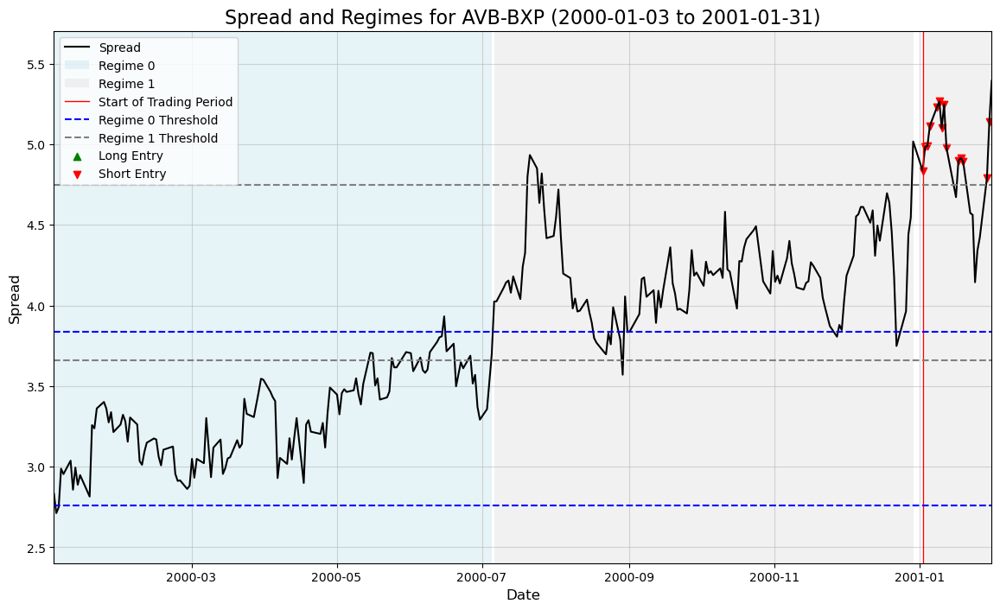

Entering short spread at spread 4.834916114807127
Closing short spread at spread 4.672022819519043
Entering short spread at spread 4.8966798782348615
Closing short spread at spread 4.5730695724487305
Entering short spread at spread 4.7920026779174805
Closing short spread at spread 5.393301963806152
Results for AVB-BXP: Cumulative Returns=-0.114796
---------------------------Formation period: 2000-02-02 05:00:00+00:00 to 2001-01-31 05:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: CPT & REG---
Fitting HMM...
Transition probabilities: p_11=0.9896, p_22=0.9818
Calculating regime statistics...
Regime Means: {0: 2.099885340181657, 1: 2.6847333261522195}
Regime Stds: {0: 0.17367862381209398, 1: 0.2028002622667631}
---Trading period: 2001-02-01 05:00:00+00:00 to 2001-03-02 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 2.802739143371582
Closing short spread at spread 2.7169885635375977
Resul

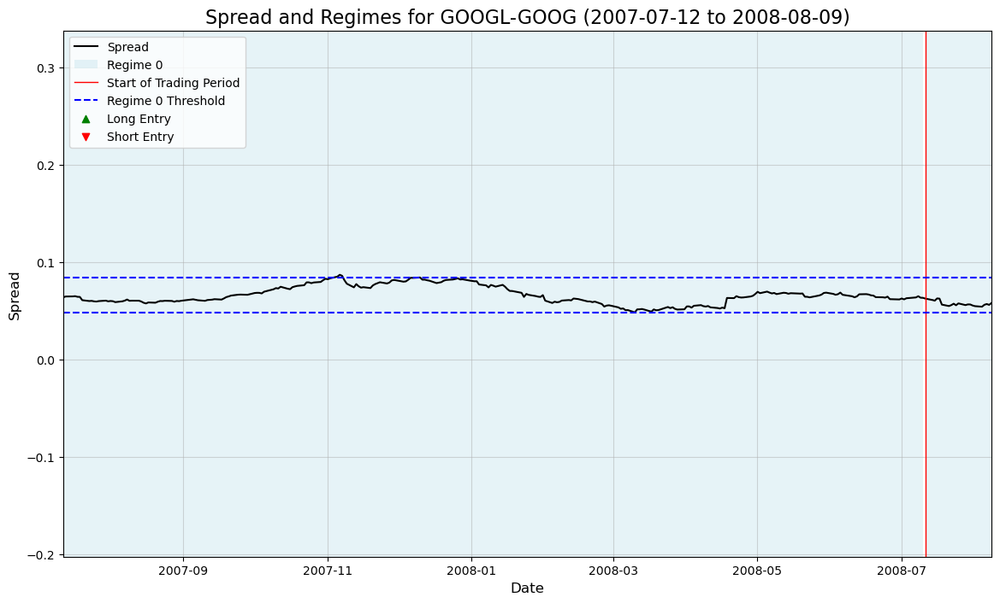

Results for GOOGL-GOOG: Cumulative Returns=0.000000
---------------------------Formation period: 2007-08-10 04:00:00+00:00 to 2008-08-08 04:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.06610525978936087}
Regime Stds: {0: 0.009434220509760467}
---Trading period: 2008-08-09 04:00:00+00:00 to 2008-09-07 04:00:00+00:00---
Generating trading signals...
Results for GOOGL-GOOG: Cumulative Returns=0.000000
---------------------------Formation period: 2007-09-11 04:00:00+00:00 to 2008-09-09 04:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.06575655180310443}
Regime Stds: {0: 0.0097557722273

Model is not converging.  Current: 859.3464803457045 is not greater than 859.3505601164278. Delta is -0.004079770723251386


    Found 1 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.04459976105101079, 1: 0.0627670288085973}
Regime Stds: {0: 0.007471557463969827, 1: nan}
---Trading period: 2009-07-11 04:00:00+00:00 to 2009-08-09 04:00:00+00:00---
Generating trading signals...
Results for GOOGL-GOOG: Cumulative Returns=0.000000
---------------------------Formation period: 2008-08-11 04:00:00+00:00 to 2009-08-10 04:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.04418102143302795}
Regime Stds: {0: 0.006799801289820294}
---Trading period: 2009-08-11 04:00:00+00:00 to 2009-09-09 04:00:00+00:00---
Generating trading signals...
Results for GOOGL-GOOG: Cumulative Returns=0.000000
---------------

Model is not converging.  Current: 688.9152800908636 is not greater than 688.9377500345652. Delta is -0.022469943701594275


    Found 1 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=0.9106, p_22=0.0011
Calculating regime statistics...
Regime Means: {0: 0.11316367069563558, 1: 0.09659957885742188}
Regime Stds: {0: 0.015421908938007586, 1: nan}
---Trading period: 2014-03-14 04:00:00+00:00 to 2014-04-12 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.1788616180419922
Closing short spread at spread 0.1966400146484375
Entering short spread at spread 0.20539474487304688
Closing short spread at spread 0.22111129760742188
Results for GOOGL-GOOG: Cumulative Returns=-0.033495
---------------------------Formation period: 2013-04-15 04:00:00+00:00 to 2014-04-14 04:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=0.9959, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 0.11544403543277677, 1: 0.30

Model is not converging.  Current: 288.07561368122555 is not greater than 288.07818031289355. Delta is -0.002566631668003083


    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9901, p_22=0.9388
Calculating regime statistics...
Regime Means: {0: 0.33462562936867435, 1: 0.06885680373834144}
Regime Stds: {0: 0.07303230474710537, 1: 0.06409316279276275}
---Trading period: 2014-12-11 05:00:00+00:00 to 2015-01-09 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.45218658447265625
Closing short spread at spread 0.31981658935546875
Entering short spread at spread 0.5233840942382795
Closing short spread at spread 0.4607057571411115
Entering short spread at spread 0.5044384002685565
Closing short spread at spread 0.39059638977050604
Entering short spread at spread 0.4965028762817383
Closing short spread at spread 0.43426036834716797
Results for NWSA-NWS: Cumulative Returns=0.371133
---------------------------Formation period: 2014-01-13 05:00:00+00:00 to 2015-01-12 05:00:00+00:00---------------------------
Calculating SSD for top p

Model is not converging.  Current: 294.5886837413462 is not greater than 294.5891081917183. Delta is -0.0004244503721224646


    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9726, p_22=0.9783
Calculating regime statistics...
Regime Means: {0: 0.18644454415920575, 1: 0.39454276956242634}
Regime Stds: {0: 0.08945117249547228, 1: 0.05512993570397591}
---Trading period: 2015-05-14 04:00:00+00:00 to 2015-06-12 04:00:00+00:00---
Generating trading signals...
Results for NWSA-NWS: Cumulative Returns=0.000000
---------------------------Formation period: 2014-06-13 04:00:00+00:00 to 2015-06-12 04:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9763, p_22=0.9837
Calculating regime statistics...
Regime Means: {0: 0.39821188468632734, 1: 0.18419996643066414}
Regime Stds: {0: 0.05588302872828751, 1: 0.08290605521535599}
---Trading period: 2015-06-13 04:00:00+00:00 to 2015-07-12 04:00:00+00:00---
Generating trading signals...
Entering l

Model is not converging.  Current: 187.0847019532426 is not greater than 187.08575428555102. Delta is -0.001052332308432824


    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9943, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 0.2727880806758486, 1: -0.15615726128602647}
Regime Stds: {0: 0.13174743604183073, 1: 0.08053357132045172}
---Trading period: 2015-12-11 05:00:00+00:00 to 2016-01-09 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.3342418670654297
Closing long spread at spread -0.4129724502563459
Results for NWSA-NWS: Cumulative Returns=-0.078731
---------------------------Formation period: 2015-01-13 05:00:00+00:00 to 2016-01-12 05:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9935, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 0.24918902154062308, 1: -0.21931634768091074}
Regime Stds: {0: 0.12067585689450584, 1: 0.14635581449579746}
---Trading per

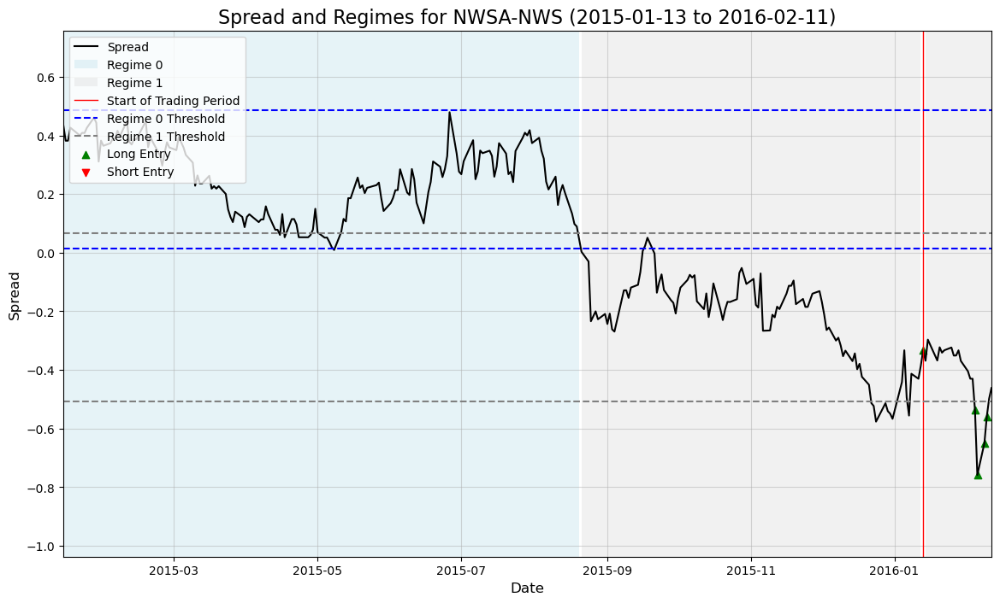

Entering long spread at spread -0.3316583633422834
Closing long spread at spread -0.3685922622680664
Entering long spread at spread -0.537229537963869
Closing long spread at spread -0.49780845642089844
Results for NWSA-NWS: Cumulative Returns=0.002487
---------------------------Formation period: 2015-02-12 05:00:00+00:00 to 2016-02-11 05:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9924, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 0.22527845700581864, 1: -0.2544125318527223}
Regime Stds: {0: 0.11189698677246432, 1: 0.16101947517612286}
---Trading period: 2016-02-12 05:00:00+00:00 to 2016-03-12 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.48921966552734375
Closing long spread at spread -0.5611343383789062
Entering long spread at spread -0.6236410140991211
Closing long spread at spread -0.551925659179

Model is not converging.  Current: 332.5482279084241 is not greater than 332.55013666704457. Delta is -0.001908758620459139


    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9365, p_22=0.9454
Calculating regime statistics...
Regime Means: {0: -0.3873138023635087, 1: -0.21276292585788809}
Regime Stds: {0: 0.06900842492094998, 1: 0.04489961413120855}
---Trading period: 2019-01-12 05:00:00+00:00 to 2019-02-10 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread -0.1606435775756836
Closing short spread at spread -0.13269138336181818
Entering short spread at spread -0.12340354919433594
Closing short spread at spread -0.151608467102049
Entering short spread at spread -0.10506725311279297
Closing short spread at spread -0.1425790786743164
Entering short spread at spread -0.11429882049560902
Closing short spread at spread -0.2075214385986328
Results for NWSA-NWS: Cumulative Returns=0.130987
---------------------------Formation period: 2018-02-13 05:00:00+00:00 to 2019-02-12 05:00:00+00:00---------------------------
Calculating SSD f

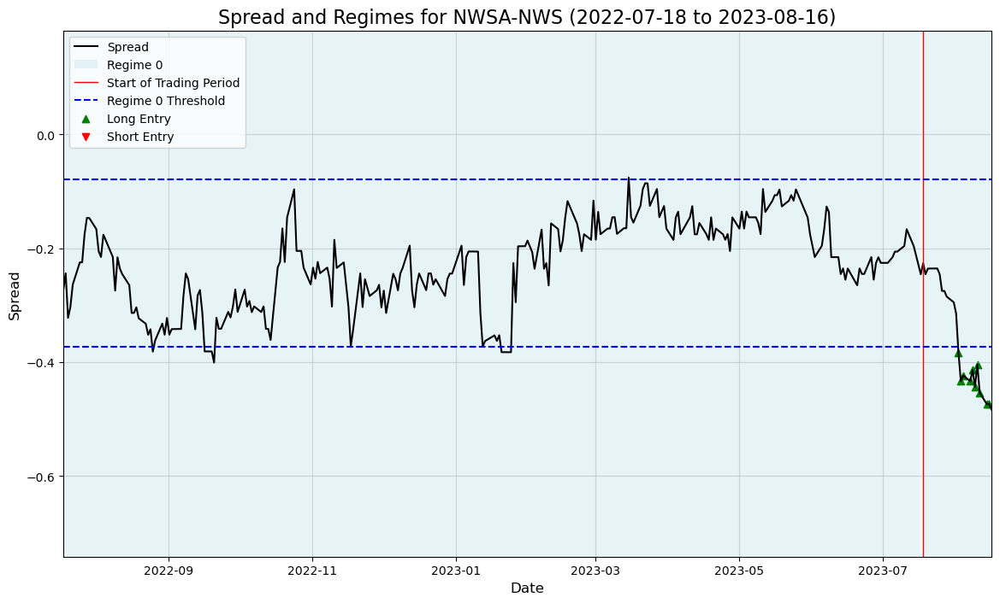

Entering long spread at spread -0.3835792541503942
Closing long spread at spread -0.4829902648925817
Results for NWSA-NWS: Cumulative Returns=-0.099411
---------------------------Formation period: 2022-08-16 04:00:00+00:00 to 2023-08-15 04:00:00+00:00---------------------------
Calculating SSD for top pairs...


Model is not converging.  Current: 370.8486909260233 is not greater than 370.8546479016982. Delta is -0.0059569756748487634


    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9775, p_22=0.9712
Calculating regime statistics...
Regime Means: {0: -0.2935990414149327, 1: -0.1611439153688762}
Regime Stds: {0: 0.06278050043644096, 1: 0.038150520873073926}
---Trading period: 2023-08-16 04:00:00+00:00 to 2023-09-14 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.4829902648925817
Closing long spread at spread -0.4136829376220703
Entering long spread at spread -0.4334373474121094
Closing long spread at spread -0.6708164215087891
Results for NWSA-NWS: Cumulative Returns=-0.168072
---------------------------Formation period: 2022-09-15 04:00:00+00:00 to 2023-09-14 04:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9827, p_22=0.9584
Calculating regime statistics...
Regime Means: {0: -0.19171350851826285

Model is not converging.  Current: 224.9058755532204 is not greater than 224.90708293338395. Delta is -0.0012073801635494874


    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9949, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -0.22994892524950447, 1: -0.7310468565742921}
Regime Stds: {0: 0.09658839313638623, 1: 0.0973859461140721}
---Trading period: 2023-11-14 05:00:00+00:00 to 2023-12-13 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.9091968536376953
Closing long spread at spread -0.8992977142333984
Entering long spread at spread -0.9293422698974609
Closing long spread at spread -1.0982913970947266
Results for NWSA-NWS: Cumulative Returns=-0.159050
---------------------------Formation period: 2022-12-14 05:00:00+00:00 to 2023-12-13 05:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 1 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9936, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -0.1971025588406119, 

,pair,formation_period,trading_period,cumulative_returns
0,"(AVB, BXP)","(2000-01-03, 2001-01-01)","(2001-01-02, 2001-01-31)",-0.114796
1,"(CPT, REG)","(2000-02-02, 2001-01-31)","(2001-02-01, 2001-03-02)",0.085751
2,"(CPT, EQR)","(2000-03-03, 2001-03-02)","(2001-03-03, 2001-04-01)",-0.118715
3,"(NUE, WY)","(2000-04-03, 2001-04-02)","(2001-04-03, 2001-05-02)",0.093164
4,"(CPT, EQR)","(2000-05-03, 2001-05-02)","(2001-05-03, 2001-06-01)",0.210027
...,...,...,...,...
275,"(NWSA, NWS)","(2022-12-14, 2023-12-13)","(2023-12-14, 2024-01-12)",0.059429
276,"(NWSA, NWS)","(2023-01-17, 2024-01-16)","(2024-01-17, 2024-02-15)",0.019827
277,"(NWSA, NWS)","(2023-02-15, 2024-02-14)","(2024-02-15, 2024-03-15)",0.000071
278,"(NWSA, NWS)","(2023-03-17, 2024-03-15)","(2024-03-16, 2024-04-14)",-0.000204


In [124]:
# THIS MODEL FITS TO DATA THAT FINDS TOP 1 SSD PAIRS 1 YEAR + 1 MONTH SHIFT + 1 MONTH TRADE
all_results = pairs_trading_pipeline_ssd(price_df, normalized_prices)
cumulative_df = pd.DataFrame(all_results)

# Save results to a CSV for further analysis
cumulative_df.to_csv("results/ssd_hmm/ssd_1mo_top1.csv", index=False)
print("\nDetailed results saved to 'ssd_1mo_top1.csv'.")

cumulative_df

Starting pairs trading pipeline...
---------------------------Formation period: 2000-01-03 05:00:00+00:00 to 2001-01-01 05:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 5 valid pairs.
---Processing pair: AVB & BXP---
Fitting HMM...
Transition probabilities: p_11=0.9922, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 3.2991047725081444, 1: 4.202856086915539}
Regime Stds: {0: 0.27548023859631515, 1: 0.27729678093560617}
---Trading period: 2001-01-02 05:00:00+00:00 to 2001-01-31 05:00:00+00:00---
Generating trading signals...


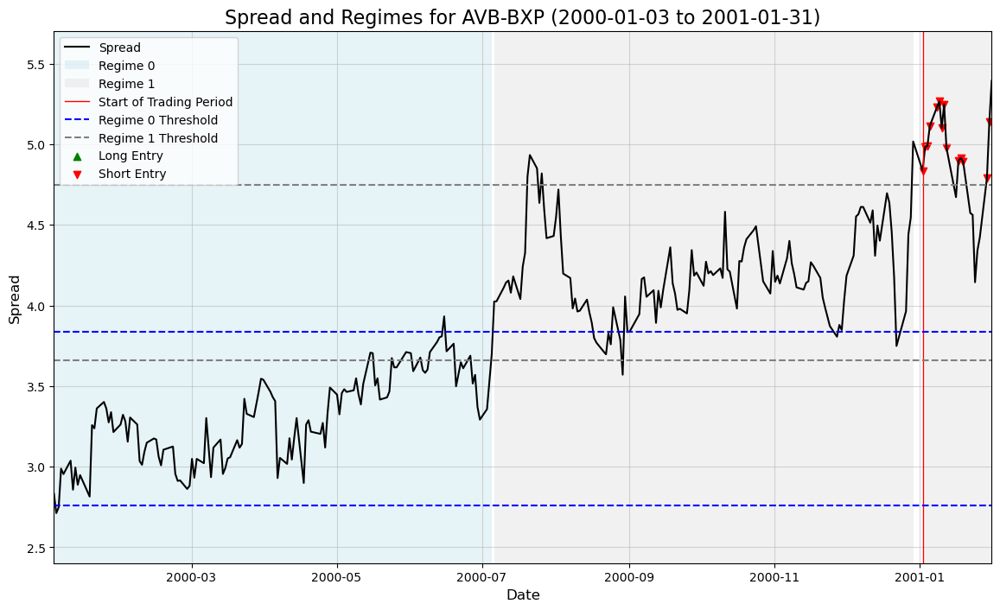

Entering short spread at spread 4.834916114807127
Closing short spread at spread 4.672022819519043
Entering short spread at spread 4.8966798782348615
Closing short spread at spread 4.5730695724487305
Entering short spread at spread 4.7920026779174805
Closing short spread at spread 5.393301963806152
Results for AVB-BXP: Cumulative Returns=-0.114796
---Processing pair: CPT & REG---
Fitting HMM...
Transition probabilities: p_11=0.9618, p_22=0.9464
Calculating regime statistics...
Regime Means: {0: 2.009551890991019, 1: 2.417597539963261}
Regime Stds: {0: 0.13915500033766878, 1: 0.2131433011296322}
---Trading period: 2001-01-02 05:00:00+00:00 to 2001-01-31 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 2.8064260482788104
Closing short spread at spread 2.7896795272827166
Entering short spread at spread 2.981539249420166
Closing short spread at spread 2.7890071868896467
Entering short spread at spread 2.8495130538940447
Closing short spread at spread 2.821064

Model is not converging.  Current: 52.51909152813148 is not greater than 52.51914311566122. Delta is -5.158752973954961e-05


Transition probabilities: p_11=0.9900, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -4.976379623507509, 1: -5.736054532575292}
Regime Stds: {0: 0.24960487464909764, 1: 0.19344902168052264}
---Trading period: 2001-03-03 05:00:00+00:00 to 2001-04-01 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -5.836868762969971
Closing long spread at spread -5.971366882324219
Results for KIM-PLD: Cumulative Returns=-0.134498
---Processing pair: NUE & WY---
Fitting HMM...
Transition probabilities: p_11=0.8882, p_22=0.0217
Calculating regime statistics...
Regime Means: {0: -2.854531475475856}
Regime Stds: {0: 0.32987760486630285}
---Trading period: 2001-03-03 05:00:00+00:00 to 2001-04-01 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -3.528881072998047
Closing long spread at spread -3.4104857444763184
Results for NUE-WY: Cumulative Returns=0.118395
---------------------------Formation period: 2000-04-03 04:00:00+00:00 to 2

KeyboardInterrupt: 

In [125]:
# THIS MODEL FITS TO DATA THAT FINDS TOP 5 SSD PAIRS 1 YEAR + 1 MONTH SHIFT + 1 MONTH TRADE
all_results = pairs_trading_pipeline_ssd(price_df, normalized_prices, top_n_pairs=5)
cumulative_df = pd.DataFrame(all_results)

# Save results to a CSV for further analysis
cumulative_df.to_csv("results/ssd_hmm/ssd_1mo_top5.csv", index=False)
print("\nDetailed results saved to 'ssd_1mo_top5.csv'.")

cumulative_df

Starting pairs trading pipeline...
---------------------------Formation period: 2000-01-03 05:00:00+00:00 to 2001-01-01 05:00:00+00:00---------------------------
Calculating SSD for top pairs...
    Found 10 valid pairs.
---Processing pair: AVB & BXP---
Fitting HMM...
Transition probabilities: p_11=0.9922, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 3.2991047725081444, 1: 4.202856086915539}
Regime Stds: {0: 0.27548023859631515, 1: 0.27729678093560617}
---Trading period: 2001-01-02 05:00:00+00:00 to 2001-01-31 05:00:00+00:00---
Generating trading signals...


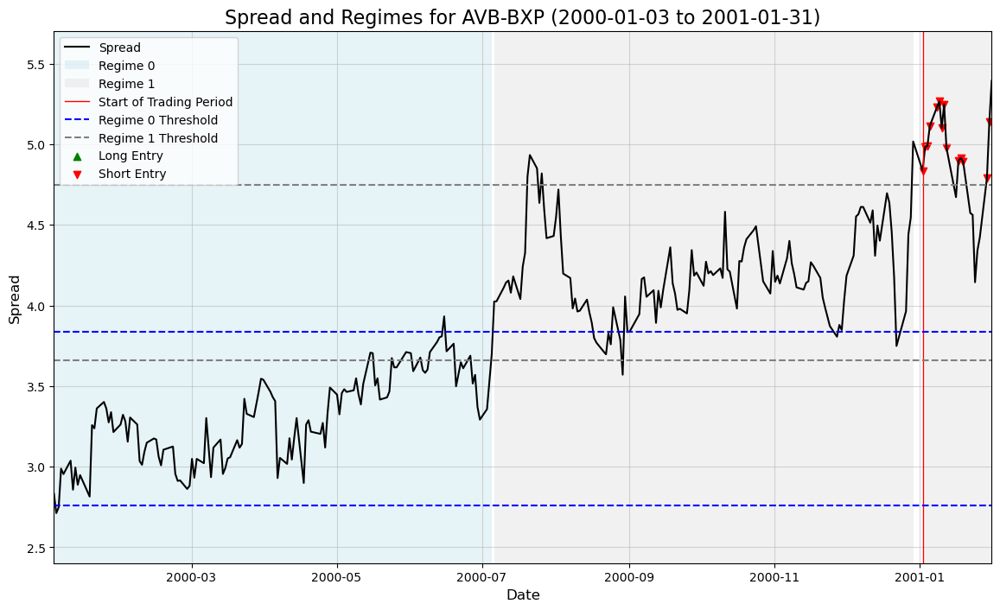

Entering short spread at spread 4.834916114807127
Closing short spread at spread 4.672022819519043
Entering short spread at spread 4.8966798782348615
Closing short spread at spread 4.5730695724487305
Entering short spread at spread 4.7920026779174805
Closing short spread at spread 5.393301963806152
Results for AVB-BXP: Cumulative Returns=-0.114796
---Processing pair: CPT & REG---
Fitting HMM...
Transition probabilities: p_11=0.9618, p_22=0.9464
Calculating regime statistics...
Regime Means: {0: 2.009551890991019, 1: 2.417597539963261}
Regime Stds: {0: 0.13915500033766878, 1: 0.2131433011296322}
---Trading period: 2001-01-02 05:00:00+00:00 to 2001-01-31 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 2.8064260482788104
Closing short spread at spread 2.7896795272827166
Entering short spread at spread 2.981539249420166
Closing short spread at spread 2.7890071868896467
Entering short spread at spread 2.8495130538940447
Closing short spread at spread 2.821064

Model is not converging.  Current: 52.51909152813148 is not greater than 52.51914311566122. Delta is -5.158752973954961e-05


    Found 10 valid pairs.
---Processing pair: NUE & WY---
Fitting HMM...
Transition probabilities: p_11=0.8899, p_22=0.0173
Calculating regime statistics...
Regime Means: {0: -2.8958531655962507}
Regime Stds: {0: 0.31475350449566525}
---Trading period: 2001-04-03 04:00:00+00:00 to 2001-05-02 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread -2.2323923110961914
Closing short spread at spread -2.325556755065916
Results for NUE-WY: Cumulative Returns=0.093164
---Processing pair: CPT & EQR---
Fitting HMM...
Transition probabilities: p_11=0.9740, p_22=0.9564
Calculating regime statistics...
Regime Means: {0: 2.1437806749040154, 1: 2.4872802784568386}
Regime Stds: {0: 0.10739575831683583, 1: 0.15115055480029171}
---Trading period: 2001-04-03 04:00:00+00:00 to 2001-05-02 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 2.787973403930666
Closing short spread at spread 2.750210762023926
Entering short spread at spread 2.92196178436279

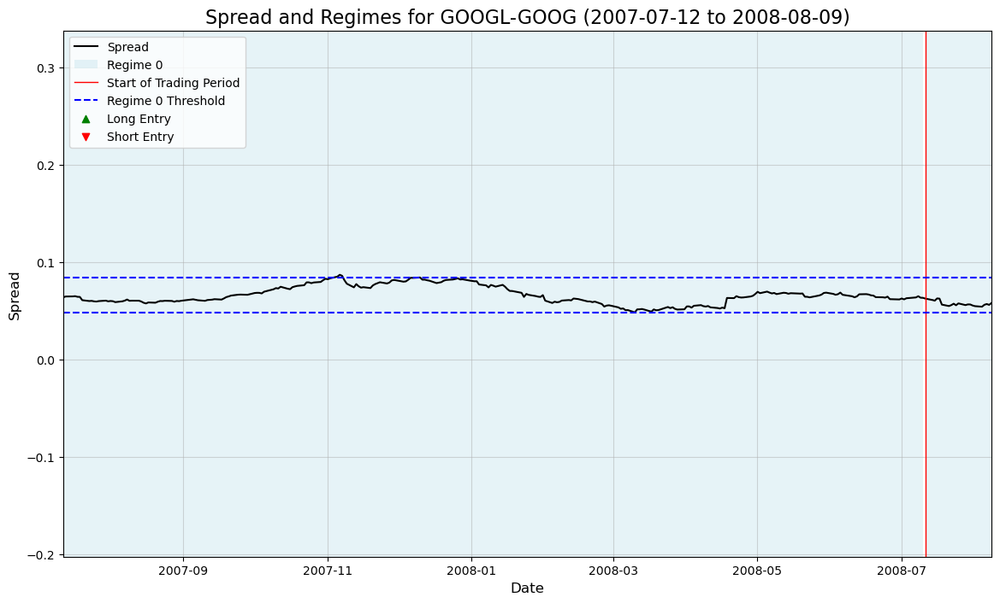

Results for GOOGL-GOOG: Cumulative Returns=0.000000
---Processing pair: PTC & SWKS---
Fitting HMM...
Transition probabilities: p_11=0.9730, p_22=0.9657
Calculating regime statistics...
Regime Means: {0: 9.212266391323459, 1: 10.743592109531164}
Regime Stds: {0: 0.6746850294582497, 1: 0.43239166774728477}
---Trading period: 2008-07-11 04:00:00+00:00 to 2008-08-09 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread 9.875205993652344
Closing long spread at spread 9.461703300476074
Entering short spread at spread 12.069314956665039
Closing short spread at spread 11.494697570800781
Entering short spread at spread 11.746370315551758
Closing short spread at spread 12.383068561553955
Results for PTC-SWKS: Cumulative Returns=-0.475584
---Processing pair: IPG & VRSN---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.9888
Calculating regime statistics...
Regime Means: {0: -25.375924001505346, 1: -20.791520203484428}
Regime Stds: {0: 1.7799274386662662, 1: 1

Model is not converging.  Current: 859.3464803457045 is not greater than 859.3505601164278. Delta is -0.004079770723251386


    Found 10 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.04459976105101079, 1: 0.0627670288085973}
Regime Stds: {0: 0.007471557463969827, 1: nan}
---Trading period: 2009-07-11 04:00:00+00:00 to 2009-08-09 04:00:00+00:00---
Generating trading signals...
Results for GOOGL-GOOG: Cumulative Returns=0.000000
---Processing pair: IPG & TER---
Fitting HMM...
Transition probabilities: p_11=0.9798, p_22=0.9866
Calculating regime statistics...
Regime Means: {0: -1.309307297070821, 1: -2.7192687638600668}
Regime Stds: {0: 0.31507853677038367, 1: 0.6128263549353659}
---Trading period: 2009-07-11 04:00:00+00:00 to 2009-08-09 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread -4.105046987533569
Closing long spread at spread -3.798346996307373
Entering long spread at spread -3.9555110931396484
Closing long spread at spread -3.735885858535766
Results fo

Model is not converging.  Current: -132.65695516868334 is not greater than -132.6569136520176. Delta is -4.1516665731933244e-05


    Found 10 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.0668588176606193}
Regime Stds: {0: 0.005091553413686865}
---Trading period: 2012-03-10 05:00:00+00:00 to 2012-04-08 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.07710647583007812
Closing short spread at spread 0.07624244689941406
Results for GOOGL-GOOG: Cumulative Returns=0.000864
---Processing pair: CMS & WMT---
Fitting HMM...
Transition probabilities: p_11=0.9401, p_22=0.9668
Calculating regime statistics...
Regime Means: {0: -0.9147115258609549, 1: -0.688721662509941}
Regime Stds: {0: 0.4167612937136434, 1: 0.14814115286886517}
---Trading period: 2012-03-10 05:00:00+00:00 to 2012-04-08 05:00:00+00:00---
Generating trading signals...
Results for CMS-WMT: Cumulative Returns=0.000000
---Processing pair: IPG & VRSN---
Fitting HMM...
Transition probabilities: p_11=0.9834, p

Model is not converging.  Current: -141.3544718835126 is not greater than -141.3544674696695. Delta is -4.413843100792292e-06


    Found 10 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.073171127410162}
Regime Stds: {0: 0.005451051715676875}
---Trading period: 2012-10-09 04:00:00+00:00 to 2012-11-07 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.08749008178711293
Closing short spread at spread 0.08172035217285156
Results for GOOGL-GOOG: Cumulative Returns=0.005770
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.9805
Calculating regime statistics...
Regime Means: {0: 10.897220287322998, 1: 5.399513794825627}
Regime Stds: {0: 2.2342663594377936, 1: 2.816999741587805}
---Trading period: 2012-10-09 04:00:00+00:00 to 2012-11-07 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 11.92585563659668
Closing short spread at spread 10.98330307006836
Results for AKAM-C: Cumulative Returns=0.9425

Model is not converging.  Current: -142.90606406320347 is not greater than -142.90604338770183. Delta is -2.0675501644973338e-05


    Found 10 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.07431262969970698}
Regime Stds: {0: 0.0058987498502103535}
---Trading period: 2012-11-07 05:00:00+00:00 to 2012-12-06 05:00:00+00:00---
Generating trading signals...
Results for GOOGL-GOOG: Cumulative Returns=0.000000
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9807, p_22=0.9518
Calculating regime statistics...
Regime Means: {0: 9.11794610840181, 1: 13.60337301613628}
Regime Stds: {0: 1.3299418050548504, 1: 1.0635327654748963}
---Trading period: 2012-11-07 05:00:00+00:00 to 2012-12-06 05:00:00+00:00---
Generating trading signals...
Results for AKAM-C: Cumulative Returns=0.000000
---Processing pair: HBAN & JCI---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.9858
Calculating regime statistics...
Regime Means: {0: -14.884991365008885, 1: -13.02176216329847}
Re

Model is not converging.  Current: -341.9992878804476 is not greater than -341.9992878583578. Delta is -2.208980731666088e-08


    Found 10 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.0000
Calculating regime statistics...
Regime Means: {0: 0.07908686447143544}
Regime Stds: {0: 0.008222404577096266}
---Trading period: 2013-03-12 04:00:00+00:00 to 2013-04-10 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.09731292724609375
Closing short spread at spread 0.09498405456542969
Entering short spread at spread 0.09539794921875
Closing short spread at spread 0.09519958496094105
Entering short spread at spread 0.09553146362304688
Closing short spread at spread 0.09438133239746449
Entering short spread at spread 0.09560203552246094
Closing short spread at spread 0.09479522705078125
Results for GOOGL-GOOG: Cumulative Returns=0.004484
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9627, p_22=0.9627
Calculating regime statistics...
Regime Means: {0: 10.942420439286666, 1: 8.898330565861293}
Re

Model is not converging.  Current: 688.9152800908636 is not greater than 688.9377500345652. Delta is -0.022469943701594275


    Found 10 valid pairs.
---Processing pair: GOOGL & GOOG---
Fitting HMM...
Transition probabilities: p_11=0.9106, p_22=0.0011
Calculating regime statistics...
Regime Means: {0: 0.11316367069563558, 1: 0.09659957885742188}
Regime Stds: {0: 0.015421908938007586, 1: nan}
---Trading period: 2014-03-14 04:00:00+00:00 to 2014-04-12 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.1788616180419922
Closing short spread at spread 0.1966400146484375
Entering short spread at spread 0.20539474487304688
Closing short spread at spread 0.22111129760742188
Results for GOOGL-GOOG: Cumulative Returns=-0.033495
---Processing pair: IPG & VRSN---
Fitting HMM...
Transition probabilities: p_11=0.9934, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -37.30180476359184, 1: -45.10731876486599}
Regime Stds: {0: 1.6139212240027565, 1: 2.5056236282995448}
---Trading period: 2014-03-14 04:00:00+00:00 to 2014-04-12 04:00:00+00:00---
Generating trading signals...
Ente

Model is not converging.  Current: 288.07561368122555 is not greater than 288.07818031289355. Delta is -0.002566631668003083


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9901, p_22=0.9388
Calculating regime statistics...
Regime Means: {0: 0.33462562936867435, 1: 0.06885680373834144}
Regime Stds: {0: 0.07303230474710537, 1: 0.06409316279276275}
---Trading period: 2014-12-11 05:00:00+00:00 to 2015-01-09 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.45218658447265625
Closing short spread at spread 0.31981658935546875
Entering short spread at spread 0.5233840942382795
Closing short spread at spread 0.4607057571411115
Entering short spread at spread 0.5044384002685565
Closing short spread at spread 0.39059638977050604
Entering short spread at spread 0.4965028762817383
Closing short spread at spread 0.43426036834716797
Results for NWSA-NWS: Cumulative Returns=0.371133
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9663, p_22=0.9874
Calculating regime statistics...
Regime Means: {0: 13

Model is not converging.  Current: 294.5886837413462 is not greater than 294.5891081917183. Delta is -0.0004244503721224646


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9726, p_22=0.9783
Calculating regime statistics...
Regime Means: {0: 0.18644454415920575, 1: 0.39454276956242634}
Regime Stds: {0: 0.08945117249547228, 1: 0.05512993570397591}
---Trading period: 2015-05-14 04:00:00+00:00 to 2015-06-12 04:00:00+00:00---
Generating trading signals...
Results for NWSA-NWS: Cumulative Returns=0.000000
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9947, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 20.987993512834823, 1: 31.93621141948397}
Regime Stds: {0: 2.376397100641582, 1: 2.009171327527899}
---Trading period: 2015-05-14 04:00:00+00:00 to 2015-06-12 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 36.517234802246094
Closing short spread at spread 34.89781188964844
Results for AKAM-C: Cumulative Returns=1.619423
---Processing pair: CSCO & EQIX---
Fitting HMM...
Trans

Model is not converging.  Current: -245.51940583159654 is not greater than -245.5194046159385. Delta is -1.2156580453392962e-06


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9113, p_22=0.0332
Calculating regime statistics...
Regime Means: {0: 0.2750456570629105, 1: 0.27070140838623225}
Regime Stds: {0: 0.12110095033946383, 1: nan}
---Trading period: 2015-08-13 04:00:00+00:00 to 2015-09-11 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread 0.0032167434692347285
Closing long spread at spread -0.11893939971924006
Results for NWSA-NWS: Cumulative Returns=-0.122156
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9920, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 20.78216845703125, 1: 31.128561785840613}
Regime Stds: {0: 2.196422485749581, 1: 2.624342657759346}
---Trading period: 2015-08-13 04:00:00+00:00 to 2015-09-11 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 29.867774963378906
Closing short spread at spread 29.198368072509766
Results for AK

Model is not converging.  Current: 187.0847019532426 is not greater than 187.08575428555102. Delta is -0.001052332308432824


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9943, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 0.2727880806758486, 1: -0.15615726128602647}
Regime Stds: {0: 0.13174743604183073, 1: 0.08053357132045172}
---Trading period: 2015-12-11 05:00:00+00:00 to 2016-01-09 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.3342418670654297
Closing long spread at spread -0.4129724502563459
Results for NWSA-NWS: Cumulative Returns=-0.078731
---Processing pair: IPG & MSI---
Fitting HMM...
Transition probabilities: p_11=0.9796, p_22=0.9801
Calculating regime statistics...
Regime Means: {0: -38.03694015944085, 1: -43.75163939339774}
Regime Stds: {0: 2.128781239894924, 1: 1.3769890991054416}
---Trading period: 2015-12-11 05:00:00+00:00 to 2016-01-09 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -43.5085973739624
Closing long spread at spread -43.04404640197754


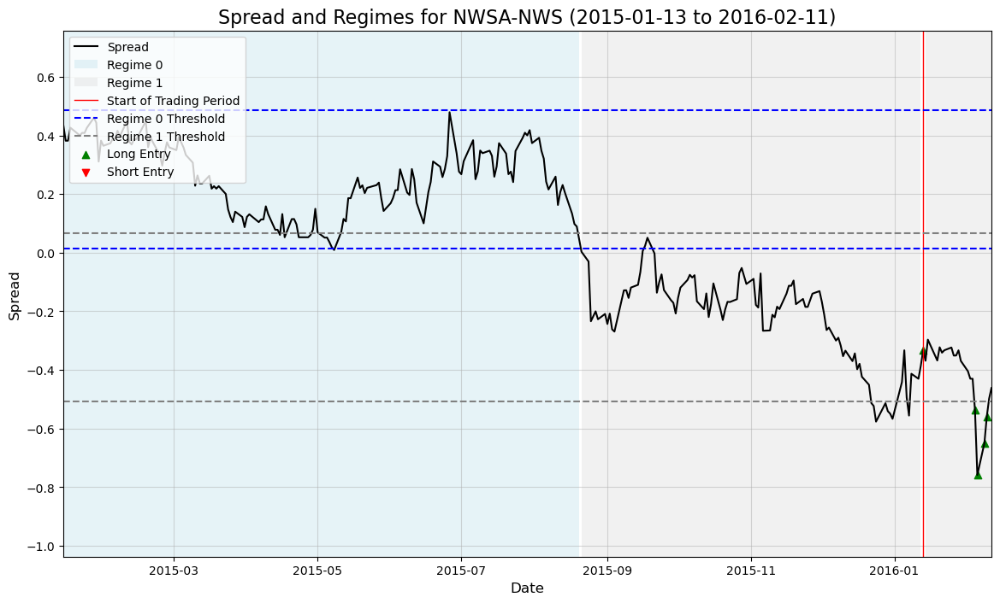

Entering long spread at spread -0.3316583633422834
Closing long spread at spread -0.3685922622680664
Entering long spread at spread -0.537229537963869
Closing long spread at spread -0.49780845642089844
Results for NWSA-NWS: Cumulative Returns=0.002487
---Processing pair: IPG & MSI---
Fitting HMM...
Transition probabilities: p_11=0.9859, p_22=0.9810
Calculating regime statistics...
Regime Means: {0: -38.02446981627366, 1: -43.85794017470886}
Regime Stds: {0: 2.1389754605213387, 1: 1.2596874849663582}
---Trading period: 2016-01-13 05:00:00+00:00 to 2016-02-11 05:00:00+00:00---
Generating trading signals...
Results for IPG-MSI: Cumulative Returns=0.000000
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9944, p_22=0.9860
Calculating regime statistics...
Regime Means: {0: 31.37580119298157, 1: 17.51260532744943}
Regime Stds: {0: 2.5274232296542065, 1: 4.545147168033031}
---Trading period: 2016-01-13 05:00:00+00:00 to 2016-02-11 05:00:00+00:00---
Generating tr

Model is not converging.  Current: 113.2423729609268 is not greater than 113.24484645760519. Delta is -0.0024734966783910295


    Found 10 valid pairs.
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9877, p_22=0.9886
Calculating regime statistics...
Regime Means: {0: 28.654895571843248, 1: 14.719330369756463}
Regime Stds: {0: 4.498768524723503, 1: 2.403796051559054}
---Trading period: 2016-05-13 04:00:00+00:00 to 2016-06-11 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread 17.31842803955078
Closing long spread at spread 18.157642364501953
Entering short spread at spread 19.808631896972656
Closing short spread at spread 18.950550079345703
Results for AKAM-C: Cumulative Returns=1.697296
---Processing pair: IPG & MSI---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.9824
Calculating regime statistics...
Regime Means: {0: -44.16919532189002, 1: -36.01842818343849}
Regime Stds: {0: 3.2640381873684383, 1: 0.4243481959779113}
---Trading period: 2016-05-13 04:00:00+00:00 to 2016-06-11 04:00:00+00:00---
Generating trading signals...
Results fo

Model is not converging.  Current: 332.5482279084241 is not greater than 332.55013666704457. Delta is -0.001908758620459139


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9365, p_22=0.9454
Calculating regime statistics...
Regime Means: {0: -0.3873138023635087, 1: -0.21276292585788809}
Regime Stds: {0: 0.06900842492094998, 1: 0.04489961413120855}
---Trading period: 2019-01-12 05:00:00+00:00 to 2019-02-10 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread -0.1606435775756836
Closing short spread at spread -0.13269138336181818
Entering short spread at spread -0.12340354919433594
Closing short spread at spread -0.151608467102049
Entering short spread at spread -0.10506725311279297
Closing short spread at spread -0.1425790786743164
Entering short spread at spread -0.11429882049560902
Closing short spread at spread -0.2075214385986328
Results for NWSA-NWS: Cumulative Returns=0.130987
---Processing pair: IPG & JNPR---
Fitting HMM...
Transition probabilities: p_11=0.9748, p_22=0.9882
Calculating regime statistics...
Regime Mea

Model is not converging.  Current: 351.0041347865942 is not greater than 351.0060078851872. Delta is -0.0018730985930233146


    Found 10 valid pairs.
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9947, p_22=0.9838
Calculating regime statistics...
Regime Means: {0: 22.041271689050486, 1: 34.12732471403528}
Regime Stds: {0: 3.4753354986872864, 1: 2.0505476373797973}
---Trading period: 2020-01-15 05:00:00+00:00 to 2020-02-13 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 28.887130737304688
Closing short spread at spread 28.277961730957045
Entering short spread at spread 28.926101684570327
Closing short spread at spread 30.4987335205078
Results for AKAM-C: Cumulative Returns=-0.963463
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9942, p_22=0.9726
Calculating regime statistics...
Regime Means: {0: -0.32696145267809834, 1: -0.1282703399658199}
Regime Stds: {0: 0.0597999329167857, 1: 0.051162546325762524}
---Trading period: 2020-01-15 05:00:00+00:00 to 2020-02-13 05:00:00+00:00---
Generating trading signals...
E

Model is not converging.  Current: 104.21412729486944 is not greater than 104.21459923266762. Delta is -0.0004719377981814432


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9760, p_22=0.9847
Calculating regime statistics...
Regime Means: {0: -0.31451288859049475, 1: -0.009584862088400396}
Regime Stds: {0: 0.07079342944815037, 1: 0.10582714656189153}
---Trading period: 2020-10-14 04:00:00+00:00 to 2020-11-12 04:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.052896499633787286
Closing short spread at spread 0.07223510742187678
Results for NWSA-NWS: Cumulative Returns=-0.019339
---Processing pair: FOXA & FOX---
Fitting HMM...
Transition probabilities: p_11=0.9943, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 0.6816059567711572, 1: 0.0439437565050628}
Regime Stds: {0: 0.2022134181584908, 1: 0.08731881390899207}
---Trading period: 2020-10-14 04:00:00+00:00 to 2020-11-12 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.07238578796386719
Closing long spread at spread -0.1045

Model is not converging.  Current: 86.25496266144026 is not greater than 86.25651136657542. Delta is -0.0015487051351641412


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9868, p_22=0.9714
Calculating regime statistics...
Regime Means: {0: -0.0011804833704113279, 1: -0.3089469728015718}
Regime Stds: {0: 0.10526021138332492, 1: 0.06715523706649441}
---Trading period: 2020-11-12 05:00:00+00:00 to 2020-12-11 05:00:00+00:00---
Generating trading signals...
Results for NWSA-NWS: Cumulative Returns=0.000000
---Processing pair: FOXA & FOX---
Fitting HMM...
Transition probabilities: p_11=0.9940, p_22=0.9880
Calculating regime statistics...
Regime Means: {0: 0.6458584147797534, 1: 0.036086944212396506}
Regime Stds: {0: 0.22067420207152208, 1: 0.09192838321464489}
---Trading period: 2020-11-12 05:00:00+00:00 to 2020-12-11 05:00:00+00:00---
Generating trading signals...
Results for FOXA-FOX: Cumulative Returns=0.000000
---Processing pair: F & IPG---
Fitting HMM...
Transition probabilities: p_11=0.9941, p_22=0.9876
Calculating regime statistics...
Regime Mean

Model is not converging.  Current: 122.98177181570803 is not greater than 122.98334775418562. Delta is -0.0015759384775861918


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9716, p_22=0.9937
Calculating regime statistics...
Regime Means: {0: -0.27731768290201825, 1: 0.024690862429343933}
Regime Stds: {0: 0.0887939168056952, 1: 0.12278499072105242}
---Trading period: 2021-01-14 05:00:00+00:00 to 2021-02-12 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.3403587341308594
Closing short spread at spread 0.1946392059326172
Results for NWSA-NWS: Cumulative Returns=0.145720
---Processing pair: FOXA & FOX---
Fitting HMM...
Transition probabilities: p_11=0.9940, p_22=0.9880
Calculating regime statistics...
Regime Means: {0: 0.558621795925163, 1: 0.036086944212396506}
Regime Stds: {0: 0.17736324029258485, 1: 0.09192838321464489}
---Trading period: 2021-01-14 05:00:00+00:00 to 2021-02-12 05:00:00+00:00---
Generating trading signals...
Entering short spread at spread 1.0103149414062536
Closing short spread at spread 1.213739395

Model is not converging.  Current: -59.25645435637132 is not greater than -59.25644548921678. Delta is -8.867154541292166e-06


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9541, p_22=0.9115
Calculating regime statistics...
Regime Means: {0: -0.30608518214165403, 1: -0.14139183531416216}
Regime Stds: {0: 0.054259332867420344, 1: 0.10106907540873798}
---Trading period: 2022-11-12 05:00:00+00:00 to 2022-12-11 05:00:00+00:00---
Generating trading signals...
Results for NWSA-NWS: Cumulative Returns=0.000000
---Processing pair: FOX & IPG---
Fitting HMM...
Transition probabilities: p_11=0.9842, p_22=0.9666
Calculating regime statistics...
Regime Means: {0: 3.7100199858347573, 1: 0.06849629084269224}
Regime Stds: {0: 1.1185134621401225, 1: 0.9061686381114528}
---Trading period: 2022-11-12 05:00:00+00:00 to 2022-12-11 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -1.8980598449707031
Closing long spread at spread -1.5375041961669922
Entering long spread at spread -1.9386653900146449
Closing long spread at spread -1.7022953033

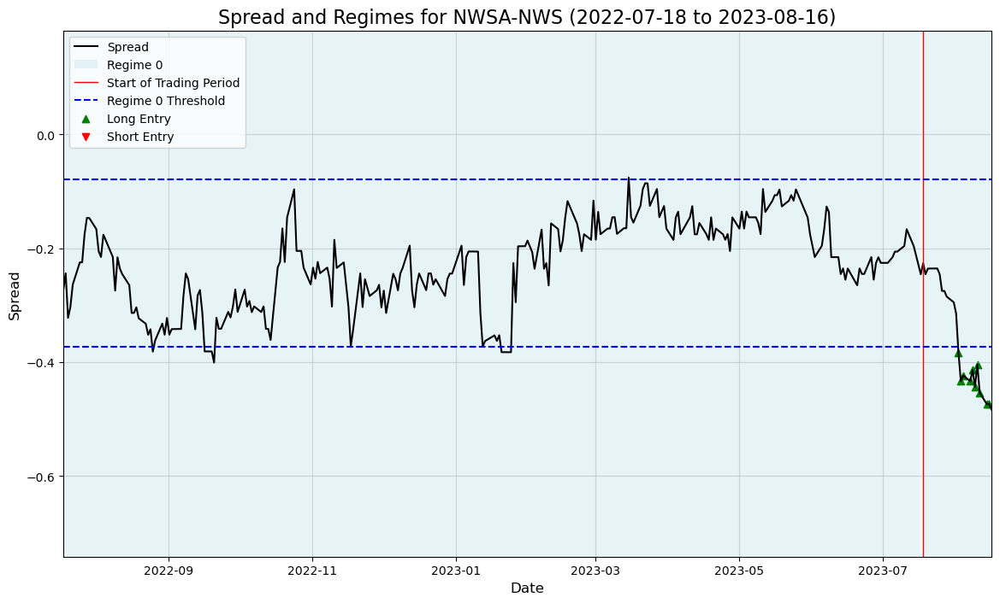

Entering long spread at spread -0.3835792541503942
Closing long spread at spread -0.4829902648925817
Results for NWSA-NWS: Cumulative Returns=-0.099411
---Processing pair: CSCO & VRSN---
Fitting HMM...
Transition probabilities: p_11=0.9870, p_22=0.9896
Calculating regime statistics...
Regime Means: {0: -148.73509991633426, 1: -172.09738524918703}
Regime Stds: {0: 7.966944559276863, 1: 4.6339726358210855}
---Trading period: 2023-07-18 04:00:00+00:00 to 2023-08-16 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread -166.19114303588867
Closing long spread at spread -163.2446136474609
Results for CSCO-VRSN: Cumulative Returns=2.946529
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9945, p_22=0.9841
Calculating regime statistics...
Regime Means: {0: 45.19391025380885, 1: 33.19301060267857}
Regime Stds: {0: 2.7467361899490315, 1: 4.163770570170017}
---Trading period: 2023-07-18 04:00:00+00:00 to 2023-08-16 04:00:00+00:00---
Generati

Model is not converging.  Current: 370.8486909260233 is not greater than 370.8546479016982. Delta is -0.0059569756748487634


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9775, p_22=0.9712
Calculating regime statistics...
Regime Means: {0: -0.2935990414149327, 1: -0.1611439153688762}
Regime Stds: {0: 0.06278050043644096, 1: 0.038150520873073926}
---Trading period: 2023-08-16 04:00:00+00:00 to 2023-09-14 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.4829902648925817
Closing long spread at spread -0.4136829376220703
Entering long spread at spread -0.4334373474121094
Closing long spread at spread -0.6708164215087891
Results for NWSA-NWS: Cumulative Returns=-0.168072
---Processing pair: AKAM & C---
Fitting HMM...
Transition probabilities: p_11=0.9755, p_22=0.9689
Calculating regime statistics...
Regime Means: {0: 38.47848303222656, 1: 46.76871145339239}
Regime Stds: {0: 7.276905789056434, 1: 2.097468605444505}
---Trading period: 2023-08-16 04:00:00+00:00 to 2023-09-14 04:00:00+00:00---
Generating trading signals...


Model is not converging.  Current: 224.9058755532204 is not greater than 224.90708293338395. Delta is -0.0012073801635494874


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9949, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -0.22994892524950447, 1: -0.7310468565742921}
Regime Stds: {0: 0.09658839313638623, 1: 0.0973859461140721}
---Trading period: 2023-11-14 05:00:00+00:00 to 2023-12-13 05:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.9091968536376953
Closing long spread at spread -0.8992977142333984
Entering long spread at spread -0.9293422698974609
Closing long spread at spread -1.0982913970947266
Results for NWSA-NWS: Cumulative Returns=-0.159050
---Processing pair: JNPR & KHC---
Fitting HMM...
Transition probabilities: p_11=0.9803, p_22=0.9676
Calculating regime statistics...
Regime Means: {0: -4.575457918643951, 1: -7.222659729339264}
Regime Stds: {0: 0.8864586996312493, 1: 1.2035779556327673}
---Trading period: 2023-11-14 05:00:00+00:00 to 2023-12-13 05:00:00+00:00---
Generating trading signal

Model is not converging.  Current: 160.22212986625695 is not greater than 160.22298421278413. Delta is -0.0008543465271770856


    Found 10 valid pairs.
---Processing pair: NWSA & NWS---
Fitting HMM...
Transition probabilities: p_11=0.9899, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -0.2615386115180123, 1: -0.9333951975169935}
Regime Stds: {0: 0.13074288876505022, 1: 0.16123297124250827}
---Trading period: 2024-04-17 04:00:00+00:00 to 2024-05-16 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread -0.8007221221923828
Closing long spread at spread -0.7807731628417969
Results for NWSA-NWS: Cumulative Returns=0.019949
---Processing pair: AES & KHC---
Fitting HMM...
Transition probabilities: p_11=0.9873, p_22=0.9865
Calculating regime statistics...
Regime Means: {0: -15.224454431306748, 1: -18.54186826728913}
Regime Stds: {0: 1.3908837242592091, 1: 0.6315592324652191}
---Trading period: 2024-04-17 04:00:00+00:00 to 2024-05-16 04:00:00+00:00---
Generating trading signals...
Entering long spread at spread -19.94658374786377
Closing long spread at spread -19.7189464569091

,pair,formation_period,trading_period,cumulative_returns
0,"(AVB, BXP)","(2000-01-03, 2001-01-01)","(2001-01-02, 2001-01-31)",-0.114796
1,"(CPT, REG)","(2000-01-03, 2001-01-01)","(2001-01-02, 2001-01-31)",0.237727
2,"(CPT, EQR)","(2000-01-03, 2001-01-01)","(2001-01-02, 2001-01-31)",-0.075233
3,"(KIM, PLD)","(2000-01-03, 2001-01-01)","(2001-01-02, 2001-01-31)",0.077879
4,"(ARE, CPT)","(2000-01-03, 2001-01-01)","(2001-01-02, 2001-01-31)",0.120270
...,...,...,...,...
2795,"(FOXA, FOX)","(2023-04-18, 2024-04-16)","(2024-04-17, 2024-05-16)",0.000000
2796,"(CMS, KO)","(2023-04-18, 2024-04-16)","(2024-04-17, 2024-05-16)",0.713139
2797,"(FOXA, IPG)","(2023-04-18, 2024-04-16)","(2024-04-17, 2024-05-16)",-0.191702
2798,"(IVZ, QRVO)","(2023-04-18, 2024-04-16)","(2024-04-17, 2024-05-16)",8.963286


In [ ]:
# THIS MODEL FITS TO DATA THAT FINDS TOP 10 SSD PAIRS 1 YEAR + 1 MONTH SHIFT + 1 MONTH TRADE
all_results = pairs_trading_pipeline_ssd(price_df, normalized_prices, top_n_pairs=10)
cumulative_df = pd.DataFrame(all_results)

# Save results to a CSV for further analysis
cumulative_df.to_csv("results/ssd_hmm/ssd_1mo_top10.csv", index=False)
print("\nDetailed results saved to 'ssd_1mo_top10.csv'.")

cumulative_df

### Distance Method + 2-State HMM Model on Cointegrated Pairs
Same fitting methods + trading rule, but trading on top cointegrated pairs every 6 months. 

In [ ]:
def extract_date(filename):
        """
        Extracts the formation end date from the pairs_file name and determines the start date for trading.
        """
        formation_start = filename.split("_")[1]
        formation_end = filename.split("_")[2]  # Assuming "pairs_STARTDATE_ENDDATE.csv"
        formation_end_date = datetime.strptime(formation_end.split(".csv")[0], "%Y-%m-%d")
        formation_end_date = pd.to_datetime(formation_end_date, utc=True)
        formation_start_date = pd.to_datetime(formation_start, utc=True)
        return formation_start_date, formation_end_date

# Step 5: Pairs Trading Pipeline
def pairs_trading_pipeline_coint(prices_data, formation_window=365, trading_window=30, step=21, top_n_pairs=20, risk_free_rate=0.05 / 252):
    """
    Main pipeline for pairs trading with HMM-based regime detection.
    """
    print("Starting pairs trading pipeline...")
    all_results = []

    # extract all coint clustering files from data
    # Specify the folder containing the CSV files
    data_folder = 'data/coint_pairs'  # Change this to your actual folder path

    # Initialize the list for filenames
    filenames = []

    # Loop through the files in the folder
    for file in os.listdir(data_folder):
        if file.endswith('.csv'):
            filenames.append(file)
    
    filenames.sort()

    i = 0 
    for filename in filenames:
        formation_start_date, formation_end_date = extract_date(filename)
        trading_start_date = formation_end_date + pd.Timedelta(days=1)
        trading_horizon = pd.Timedelta(days=trading_window)
        trading_end_date = trading_start_date + trading_horizon
        trading_end_date = pd.to_datetime(trading_end_date, utc=True)
        pairs = pd.read_csv('data/coint_pairs/'+filename)[:top_n_pairs]

        formation_data = prices_data.loc[formation_start_date:formation_end_date]
        trading_data = prices_data.loc[trading_start_date:trading_end_date]
        print(f"---------------------------Formation period: {formation_start_date} to {formation_end_date}---------------------------")


        for _, row in pairs.iterrows():
            stock1, stock2 = row["Asset 1"], row["Asset 2"]
            print(f"---Processing pair: {stock1} & {stock2}---")
            formation_spread = formation_data[stock1] - formation_data[stock2]
            trading_spread = trading_data[stock1] - trading_data[stock2]

            # Check for NaN values in the spread
            if formation_spread.isna().any():
                nan_locations = formation_spread[formation_spread.isna()].index
                print(f"NaN values detected in spread for pair {stock1}-{stock2}. Locations: {nan_locations}")
                raise ValueError(f"NaN detected in spread for pair {stock1}-{stock2}. Please clean the data.")

            # Step 1: Fit HMM
            hmm_model, regimes = fit_hmm(formation_spread.values)

            # Plot the HMM-fitted regimes on the spread
            # plot_hmm_regimes(formation_spread, regimes, formation_start_date, formation_end_date, stock1, stock2)

            # Calculate mean and standard deviation for each regime
            print("Calculating regime statistics...")
            regime_means = {regime: formation_spread[regimes == regime].mean() for regime in np.unique(regimes)}
            regime_stds = {regime: formation_spread[regimes == regime].std() for regime in np.unique(regimes)}

            print(f"Regime Means: {regime_means}")
            print(f"Regime Stds: {regime_stds}")

            # Step 2: Predict Regimes for the Trading Period
            print(f"---Trading period: {trading_start_date} to {trading_end_date}---")
            predicted_states = hmm_model.predict(trading_spread.values.reshape(-1, 1))
            # print("predicted states:", predicted_states)

            # Step 3: Generate Trading Signals
            signals = generate_signals_distance_method(
                trading_spread.values, regime_means, regime_stds, predicted_states
            )

            # Plot combined regimes and trading signals
            if i % 500 == 0: # only plot every 300 trading periods
                plot_combined_regimes_and_signals(
                    formation_spread=formation_spread,
                    formation_regimes=regimes,
                    trading_spread=trading_spread,
                    trading_signals=signals,
                    predicted_states=predicted_states,
                    regime_means=regime_means,
                    regime_stds=regime_stds,
                    start_date=formation_start_date,
                    end_date=trading_end_date,
                    stock1=stock1,
                    stock2=stock2
                )

            # Step 4: Backtest Strategy
            results = evaluate_strategy_v2(
                prices_data.loc[trading_start_date:trading_end_date], signals, (stock1, stock2)
            )
            # backtest_results = backtest_strategy(trading_spread, signals)

            # Collect results
            all_results.append({
                "pair": (stock1, stock2),
                "formation_period": (formation_start_date.date(), formation_end_date.date()),
                "trading_period": (trading_start_date.date(), trading_end_date.date()),
                "cumulative_returns": results["Cumulative_Returns"].iloc[-1],
            })

            print(f"Results for {stock1}-{stock2}: Cumulative Returns={results['Cumulative_Returns'].iloc[-1]:.6f}")

            i += 1

    # Calculate and report overall cumulative results
    print("\nPipeline completed. Reporting cumulative results...\n")
    cumulative_df = pd.DataFrame(all_results)

    # Calculate aggregate metrics
    total_cumulative_returns = cumulative_df["cumulative_returns"].sum()
    average_return_per_pair = cumulative_df["cumulative_returns"].mean()
    total_pairs_evaluated = len(cumulative_df["pair"].unique())
    total_windows_evaluated = len(cumulative_df)

    # Print summary
    print("Cumulative Results Summary:")
    print(f"  Total Cumulative Returns: {total_cumulative_returns:.6f}")
    print(f"  Average Return per Pair: {average_return_per_pair:.6f}")
    print(f"  Total Pairs Evaluated: {total_pairs_evaluated}")
    print(f"  Total Windows Evaluated: {total_windows_evaluated}")
            
    return all_results

Starting pairs trading pipeline...
---------------------------Formation period: 2000-01-04 00:00:00+00:00 to 2000-09-11 00:00:00+00:00---------------------------
---Processing pair: CPT & REG---
Fitting HMM...
Transition probabilities: p_11=0.9267, p_22=0.9446
Calculating regime statistics...
Regime Means: {0: 2.2401254106970394, 1: 1.974446796235584}
Regime Stds: {0: 0.0996636939391727, 1: 0.1232885680853414}
---Trading period: 2000-09-12 00:00:00+00:00 to 2000-10-12 00:00:00+00:00---
Generating trading signals...


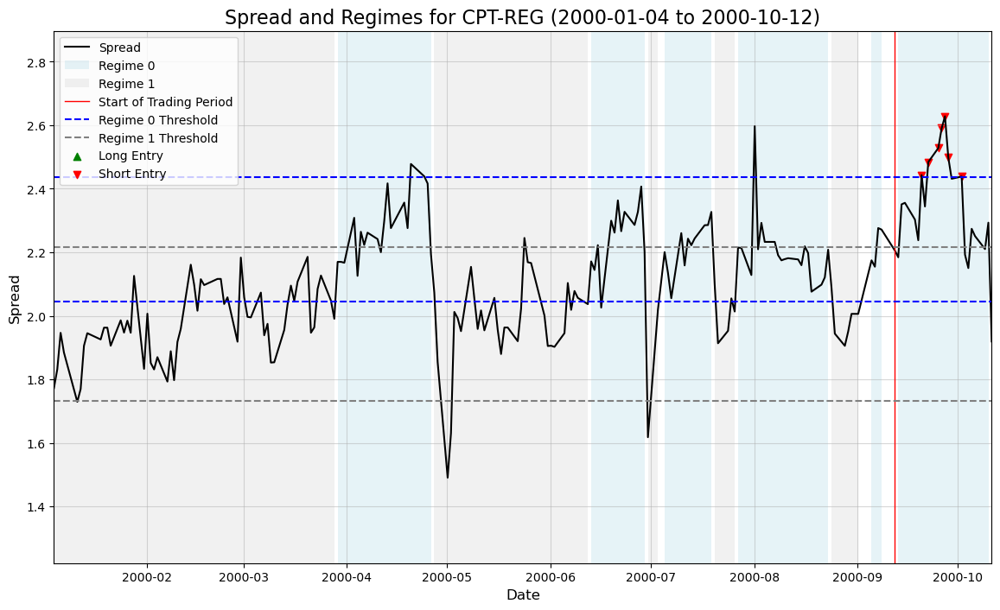

Entering short spread at spread 2.4429869651794416
Closing short spread at spread 2.3443236351013184
Entering short spread at spread 2.4841723442077637
Closing short spread at spread 2.431568622589113
Entering short spread at spread 2.4385128021240234
Closing short spread at spread 2.192563056945801
Results for CPT-REG: Cumulative Returns=0.397217
---Processing pair: EQR & REG---
Fitting HMM...
Transition probabilities: p_11=0.9370, p_22=0.8857
Calculating regime statistics...
Regime Means: {0: -0.0036877341892408598, 1: -0.23501947830463277}
Regime Stds: {0: 0.09183540790944408, 1: 0.1182411376601475}
---Trading period: 2000-09-12 00:00:00+00:00 to 2000-10-12 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.19192075729370028
Closing short spread at spread 0.12591075897216797
Entering short spread at spread 0.20333003997802734
Closing short spread at spread 0.07846879959106445
Results for EQR-REG: Cumulative Returns=0.190871
---Processing pair: BXP & RE

Model is not converging.  Current: 87.26661058825644 is not greater than 87.26891894804315. Delta is -0.002308359786709957


Transition probabilities: p_11=0.9910, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -9.346660093827682, 1: -10.799818615759573}
Regime Stds: {0: 0.379892891703739, 1: 0.3791601045045691}
---Trading period: 2004-02-24 00:00:00+00:00 to 2004-03-25 00:00:00+00:00---
Generating trading signals...
Entering long spread at spread -11.103221416473389
Closing long spread at spread -11.130033016204834
Entering long spread at spread -11.584572315216064
Closing long spread at spread -11.441951751708984
Entering long spread at spread -11.797058582305908
Closing long spread at spread -11.444534301757812
Results for BF-B-MET: Cumulative Returns=0.468333
---Processing pair: TROW & CCL---
Fitting HMM...
Transition probabilities: p_11=0.9918, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -10.551201359170381, 1: -13.39719347000122}
Regime Stds: {0: 0.46725748433905984, 1: 0.8148768247973623}
---Trading period: 2004-02-24 00:00:00+00:00 to 2004-03-25 00:00:00+00:00---
Ge

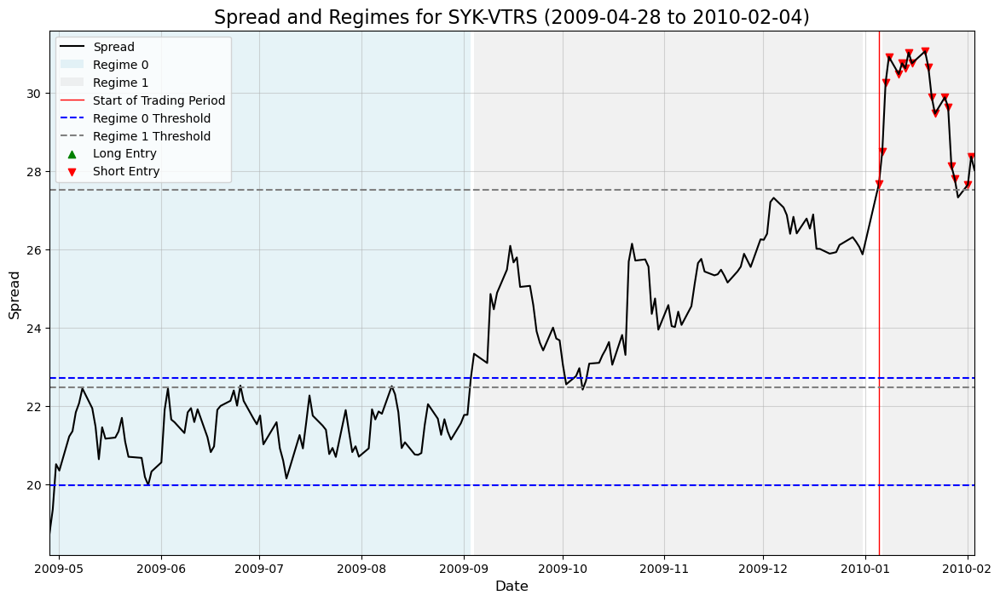

Entering short spread at spread 27.680638313293457
Closing short spread at spread 27.32537078857422
Entering short spread at spread 27.651659011840827
Closing short spread at spread 28.027628898620605
Results for SYK-VTRS: Cumulative Returns=-0.020702
---Processing pair: KMB & MTD---
Fitting HMM...
Transition probabilities: p_11=0.9893, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -48.48341807913273, 1: -61.16566930843305}
Regime Stds: {0: 4.606676751865167, 1: 3.7767251623791576}
---Trading period: 2010-01-05 00:00:00+00:00 to 2010-02-04 00:00:00+00:00---
Generating trading signals...
Entering long spread at spread -66.23385620117188
Closing long spread at spread -65.89543533325195
Results for KMB-MTD: Cumulative Returns=0.338421
---Processing pair: JCI & WELL---
Fitting HMM...
Transition probabilities: p_11=0.9833, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -8.220546619097393, 1: -10.523009874124442}
Regime Stds: {0: 0.5109093284234038, 1: 0.6243

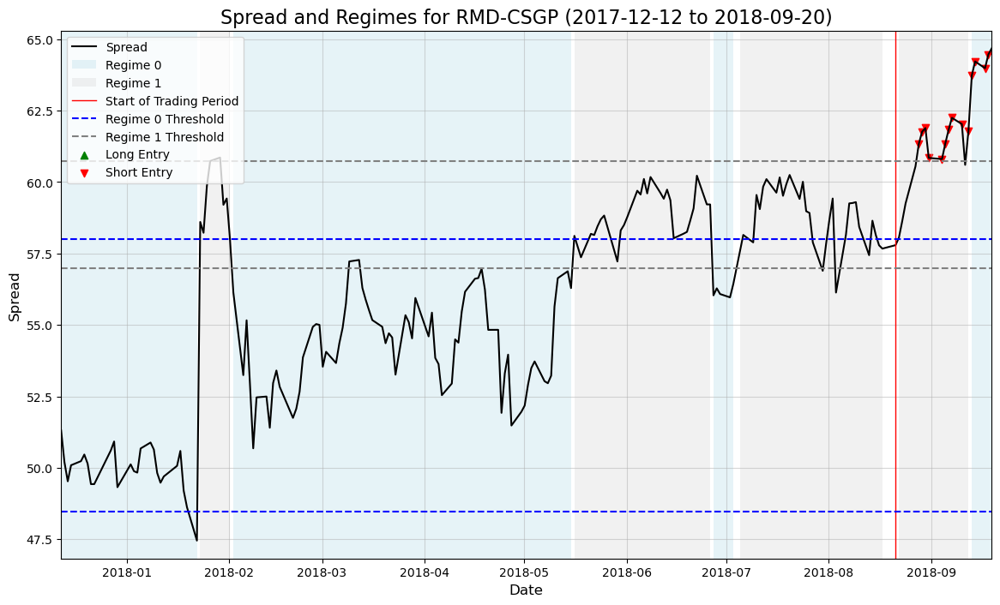

Entering short spread at spread 61.3371467590332
Closing short spread at spread 60.60356521606445
Entering short spread at spread 61.79732894897461
Closing short spread at spread 64.67561721801758
Results for RMD-CSGP: Cumulative Returns=-2.144707
---Processing pair: AXON & NDAQ---
Fitting HMM...
Transition probabilities: p_11=0.9901, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 9.068264158645478, 1: 36.896405287191904}
Regime Stds: {0: 6.135259363595907, 1: 4.372878176095821}
---Trading period: 2018-08-21 00:00:00+00:00 to 2018-09-20 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread 35.943756103515625
Closing short spread at spread 36.38437271118164
Entering short spread at spread 45.95383644104004
Closing short spread at spread 41.70104217529297
Results for AXON-NDAQ: Cumulative Returns=3.812178
---Processing pair: BSX & TPL---
Fitting HMM...
Transition probabilities: p_11=0.9896, p_22=1.0000
Calculating regime statistics...
Regime Mean

,pair,formation_period,trading_period,cumulative_returns
0,"(CPT, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",0.397217
1,"(EQR, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",0.190871
2,"(BXP, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",0.548814
3,"(BK, AJG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",2.404180
4,"(AJG, EG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",2.012115
...,...,...,...,...
1370,"(DXCM, REG)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",-0.519997
1371,"(ICE, KIM)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",6.122793
1372,"(HWM, SRE)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",8.630646
1373,"(MMM, PNW)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",-0.230843


In [ ]:
# THIS MODEL FITS TO DATA THAT FINDS TOP 20 COINTEGRATED PAIRS ACROSS 1 YEAR + 6 MONTH SHIFT + 1 MONTH TRADE (so 5 month gap between trading periods)
all_results = pairs_trading_pipeline_coint(price_df)
cumulative_df = pd.DataFrame(all_results)

# Save results to a CSV for further analysis
cumulative_df.to_csv("results/coint_hmm/coint_1mo_top20.csv", index=False)
print("\nDetailed results saved to 'coint_1mo_top20.csv'.")

cumulative_df

Starting pairs trading pipeline...
---------------------------Formation period: 2000-01-04 00:00:00+00:00 to 2000-09-11 00:00:00+00:00---------------------------
---Processing pair: CPT & REG---
Fitting HMM...
Transition probabilities: p_11=0.9267, p_22=0.9446
Calculating regime statistics...
Regime Means: {0: 2.2401254106970394, 1: 1.974446796235584}
Regime Stds: {0: 0.0996636939391727, 1: 0.1232885680853414}
---Trading period: 2000-09-12 00:00:00+00:00 to 2001-03-11 00:00:00+00:00---
Generating trading signals...


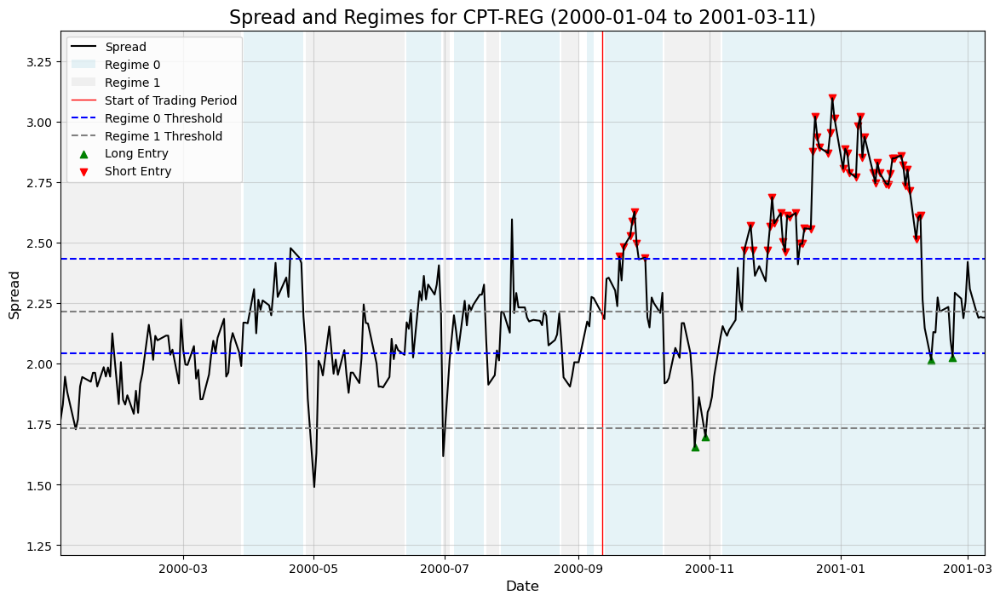

Entering short spread at spread 2.4429869651794416
Closing short spread at spread 2.3443236351013184
Entering short spread at spread 2.4841723442077637
Closing short spread at spread 2.431568622589113
Entering short spread at spread 2.4385128021240234
Closing short spread at spread 2.192563056945801
Entering long spread at spread 1.656761646270752
Closing long spread at spread 1.7580900192260742
Entering long spread at spread 1.698333740234375
Closing long spread at spread 1.8002381324768066
Entering short spread at spread 2.46821928024292
Closing short spread at spread 2.363640308380127
Entering short spread at spread 2.4692749977111834
Closing short spread at spread 2.4109621047973633
Entering short spread at spread 2.496096611022949
Closing short spread at spread 2.2652511596679688
Entering long spread at spread 2.016733169555664
Closing long spread at spread 2.1312007904052734
Entering long spread at spread 2.027444839477539
Closing long spread at spread 2.2933874130249023
Results 

Model is not converging.  Current: 87.26661058825644 is not greater than 87.26891894804315. Delta is -0.002308359786709957


Closing long spread at spread 0.4841194152832031
Entering short spread at spread 1.7694787979125994
Closing short spread at spread 1.8622684478759783
Results for SRE-IRM: Cumulative Returns=1.100109
---Processing pair: PNR & EL---
Fitting HMM...
Transition probabilities: p_11=0.8684, p_22=0.0166
Calculating regime statistics...
Regime Means: {0: -4.240223522074738}
Regime Stds: {0: 0.6292592379613284}
---Trading period: 2004-06-29 00:00:00+00:00 to 2004-12-26 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread -2.837657928466797
Closing short spread at spread -3.18924617767334
Entering short spread at spread -2.707810401916504
Closing short spread at spread -3.1318655014038086
Entering short spread at spread -2.6493234634399414
Closing short spread at spread 2.1797103881835938
Results for PNR-EL: Cumulative Returns=-4.053391
---Processing pair: SPGI & BDX---
Fitting HMM...
Transition probabilities: p_11=0.9859, p_22=1.0000
Calculating regime statistics...
Re

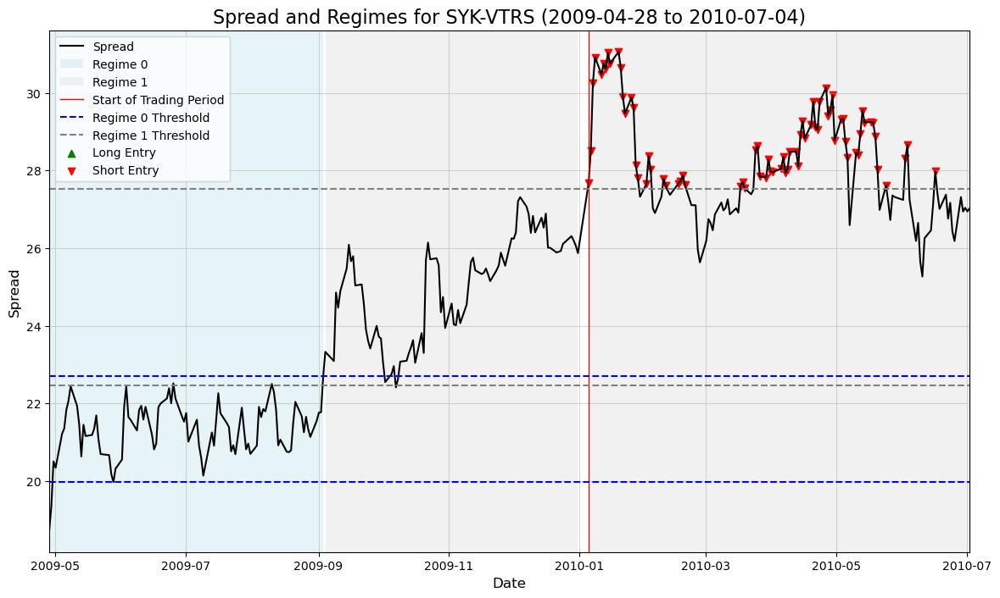

Entering short spread at spread 27.680638313293457
Closing short spread at spread 27.32537078857422
Entering short spread at spread 27.651659011840827
Closing short spread at spread 27.02474880218506
Entering short spread at spread 27.789527893066406
Closing short spread at spread 27.48081111907959
Entering short spread at spread 27.667377471923828
Closing short spread at spread 27.108659744262695
Entering short spread at spread 27.602567672729492
Closing short spread at spread 27.386991500854492
Entering short spread at spread 28.520694732666016
Closing short spread at spread 26.59222984313965
Entering short spread at spread 28.454278945922844
Closing short spread at spread 26.985427856445312
Entering short spread at spread 27.61577606201172
Closing short spread at spread 27.20335578918457
Entering short spread at spread 28.30480194091797
Closing short spread at spread 27.247029304504395
Entering short spread at spread 27.978224754333496
Closing short spread at spread 27.4253807067871

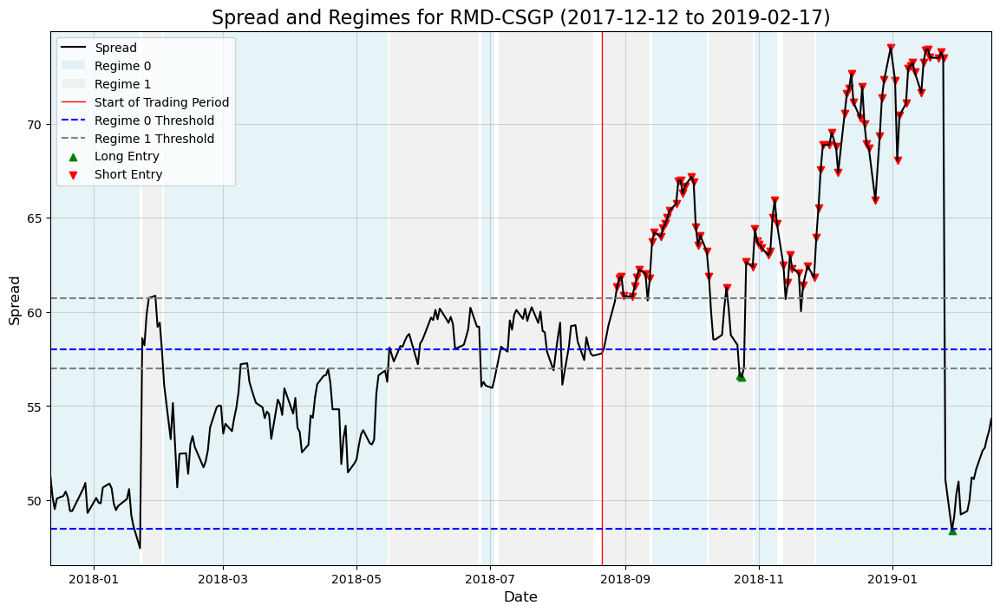

Entering short spread at spread 61.3371467590332
Closing short spread at spread 60.60356521606445
Entering short spread at spread 61.79732894897461
Closing short spread at spread 59.9589958190918
Entering short spread at spread 61.291572570800795
Closing short spread at spread 60.19343948364258
Entering long spread at spread 56.62611770629883
Closing long spread at spread 57.05248260498047
Entering short spread at spread 62.64144134521483
Closing short spread at spread 60.675354003906264
Entering short spread at spread 61.57557678222656
Closing short spread at spread 60.0381622314453
Entering short spread at spread 61.43367004394531
Closing short spread at spread 51.0872802734375
Entering long spread at spread 48.40620803833008
Closing long spread at spread 49.10945510864258
Results for RMD-CSGP: Cumulative Returns=18.649551
---Processing pair: AXON & NDAQ---
Fitting HMM...
Transition probabilities: p_11=0.9901, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 9.068264158

,pair,formation_period,trading_period,cumulative_returns
0,"(CPT, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",1.374597
1,"(EQR, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",1.902317
2,"(BXP, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",1.411101
3,"(BK, AJG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",6.024442
4,"(AJG, EG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",-9.105423
...,...,...,...,...
1370,"(DXCM, REG)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",1.530006
1371,"(ICE, KIM)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",5.812778
1372,"(HWM, SRE)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",9.130646
1373,"(MMM, PNW)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",-0.230843


In [ ]:
# THIS MODEL FITS TO DATA THAT FINDS TOP 20 COINTEGRATED PAIRS ACROSS 1 YEAR + 6 MONTH SHIFT + 6 MONTH TRADE (so no gap between trading periods)
all_results = pairs_trading_pipeline_coint(price_df, trading_window=30*6)
cumulative_df = pd.DataFrame(all_results)

# Save results to a CSV for further analysis
cumulative_df.to_csv("results/coint_hmm/coint_6mo_top20.csv", index=False)
print("\nDetailed results saved to 'coint_6mo_top20.csv'.")

cumulative_df

Starting pairs trading pipeline...
---------------------------Formation period: 2000-01-04 00:00:00+00:00 to 2000-09-11 00:00:00+00:00---------------------------
---Processing pair: CPT & REG---
Fitting HMM...
Transition probabilities: p_11=0.9267, p_22=0.9446
Calculating regime statistics...
Regime Means: {0: 2.2401254106970394, 1: 1.974446796235584}
Regime Stds: {0: 0.0996636939391727, 1: 0.1232885680853414}
---Trading period: 2000-09-12 00:00:00+00:00 to 2000-10-12 00:00:00+00:00---
Generating trading signals...


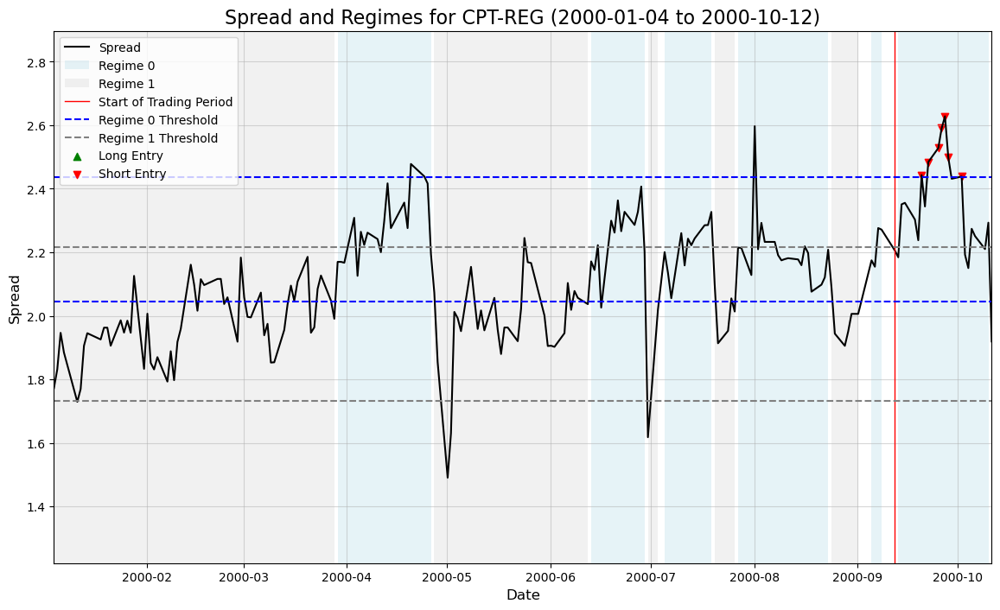

Entering short spread at spread 2.4429869651794416
Closing short spread at spread 2.3443236351013184
Entering short spread at spread 2.4841723442077637
Closing short spread at spread 2.431568622589113
Entering short spread at spread 2.4385128021240234
Closing short spread at spread 2.192563056945801
Results for CPT-REG: Cumulative Returns=0.397217
---Processing pair: EQR & REG---
Fitting HMM...
Transition probabilities: p_11=0.9370, p_22=0.8857
Calculating regime statistics...
Regime Means: {0: -0.0036877341892408598, 1: -0.23501947830463277}
Regime Stds: {0: 0.09183540790944408, 1: 0.1182411376601475}
---Trading period: 2000-09-12 00:00:00+00:00 to 2000-10-12 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread 0.19192075729370028
Closing short spread at spread 0.12591075897216797
Entering short spread at spread 0.20333003997802734
Closing short spread at spread 0.07846879959106445
Results for EQR-REG: Cumulative Returns=0.190871
---Processing pair: BXP & RE

Model is not converging.  Current: 87.26661058825644 is not greater than 87.26891894804315. Delta is -0.002308359786709957


Transition probabilities: p_11=0.9898, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 13.786311766113897, 1: 18.700335162959686}
Regime Stds: {0: 1.093400347993219, 1: 1.2350788877754937}
---Trading period: 2004-02-24 00:00:00+00:00 to 2004-03-25 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread 19.579371452331543
Closing short spread at spread 19.845680236816406
Results for ARE-HBAN: Cumulative Returns=-0.266309
---Processing pair: AXON & MS---
Fitting HMM...
Transition probabilities: p_11=0.9934, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -23.855419324024727, 1: -19.6526451587677}
Regime Stds: {0: 1.022243830444082, 1: 1.3390624769276593}
---Trading period: 2004-02-24 00:00:00+00:00 to 2004-03-25 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread -18.619789123535156
Closing short spread at spread -19.075451850891113
Entering short spread at spread -16.56873893737793
Closing short spread at 

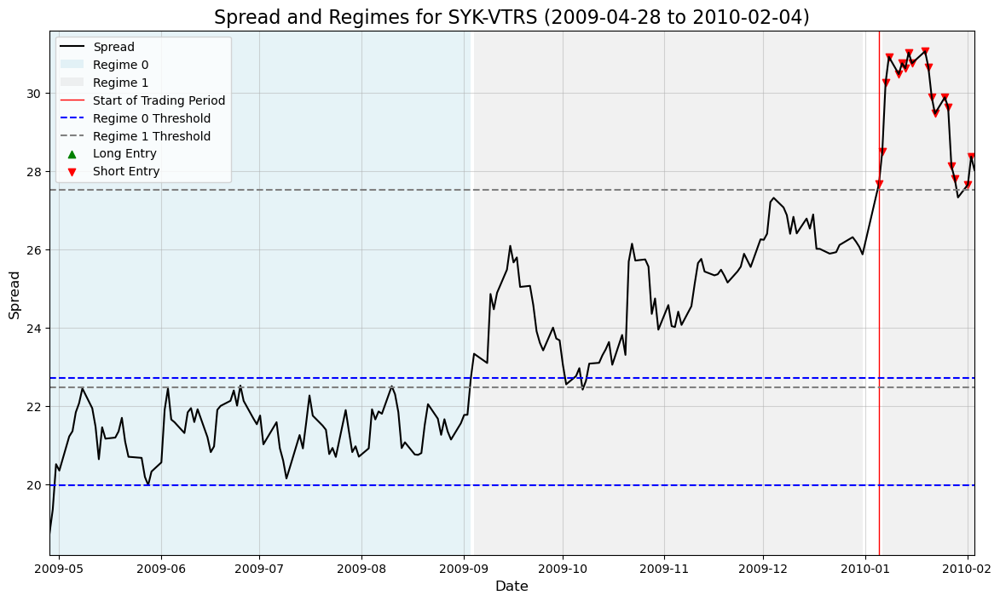

Entering short spread at spread 27.680638313293457
Closing short spread at spread 27.32537078857422
Entering short spread at spread 27.651659011840827
Closing short spread at spread 28.027628898620605
Results for SYK-VTRS: Cumulative Returns=-0.020702
---Processing pair: KMB & MTD---
Fitting HMM...
Transition probabilities: p_11=0.9893, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -48.48341807913273, 1: -61.16566930843305}
Regime Stds: {0: 4.606676751865167, 1: 3.7767251623791576}
---Trading period: 2010-01-05 00:00:00+00:00 to 2010-02-04 00:00:00+00:00---
Generating trading signals...
Entering long spread at spread -66.23385620117188
Closing long spread at spread -65.89543533325195
Results for KMB-MTD: Cumulative Returns=0.338421
---Processing pair: JCI & WELL---
Fitting HMM...
Transition probabilities: p_11=0.9833, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: -8.220546619097393, 1: -10.523009874124442}
Regime Stds: {0: 0.5109093284234038, 1: 0.6243

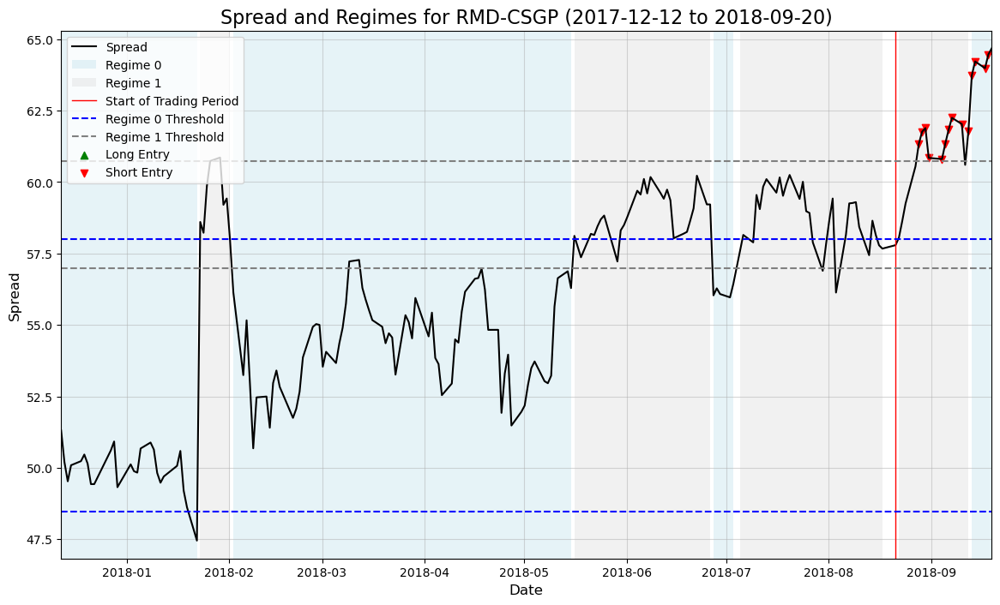

Entering short spread at spread 61.3371467590332
Closing short spread at spread 60.60356521606445
Entering short spread at spread 61.79732894897461
Closing short spread at spread 64.67561721801758
Results for RMD-CSGP: Cumulative Returns=-2.144707
---Processing pair: AXON & NDAQ---
Fitting HMM...
Transition probabilities: p_11=0.9901, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 9.068264158645478, 1: 36.896405287191904}
Regime Stds: {0: 6.135259363595907, 1: 4.372878176095821}
---Trading period: 2018-08-21 00:00:00+00:00 to 2018-09-20 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread 35.943756103515625
Closing short spread at spread 36.38437271118164
Entering short spread at spread 45.95383644104004
Closing short spread at spread 41.70104217529297
Results for AXON-NDAQ: Cumulative Returns=3.812178
---Processing pair: BSX & TPL---
Fitting HMM...
Transition probabilities: p_11=0.9896, p_22=1.0000
Calculating regime statistics...
Regime Mean

,pair,formation_period,trading_period,cumulative_returns
0,"(CPT, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",0.397217
1,"(EQR, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",0.190871
2,"(BXP, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",0.548814
3,"(BK, AJG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",2.404180
4,"(AJG, EG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2000-10-12)",2.012115
...,...,...,...,...
1370,"(DXCM, REG)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",-0.519997
1371,"(ICE, KIM)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",6.122793
1372,"(HWM, SRE)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",8.630646
1373,"(MMM, PNW)","(2024-02-27, 2024-11-04)","(2024-11-05, 2024-12-05)",-0.230843


In [ ]:
# THIS MODEL FITS TO DATA THAT FINDS TOP 5 COINTEGRATED PAIRS ACROSS 1 YEAR + 6 MONTH SHIFT + 1 MONTH TRADE (so 5 month gap between trading periods)
all_results = pairs_trading_pipeline_coint(price_df, top_n_pairs=5)
cumulative_df = pd.DataFrame(all_results)

# Save results to a CSV for further analysis
cumulative_df.to_csv("results/coint_hmm/coint_1mo_top5.csv", index=False)
print("\nDetailed results saved to 'coint_1mo_top5.csv'.")

cumulative_df

Starting pairs trading pipeline...
---------------------------Formation period: 2000-01-04 00:00:00+00:00 to 2000-09-11 00:00:00+00:00---------------------------
---Processing pair: CPT & REG---
Fitting HMM...
Transition probabilities: p_11=0.9267, p_22=0.9446
Calculating regime statistics...
Regime Means: {0: 2.2401254106970394, 1: 1.974446796235584}
Regime Stds: {0: 0.0996636939391727, 1: 0.1232885680853414}
---Trading period: 2000-09-12 00:00:00+00:00 to 2001-03-11 00:00:00+00:00---
Generating trading signals...


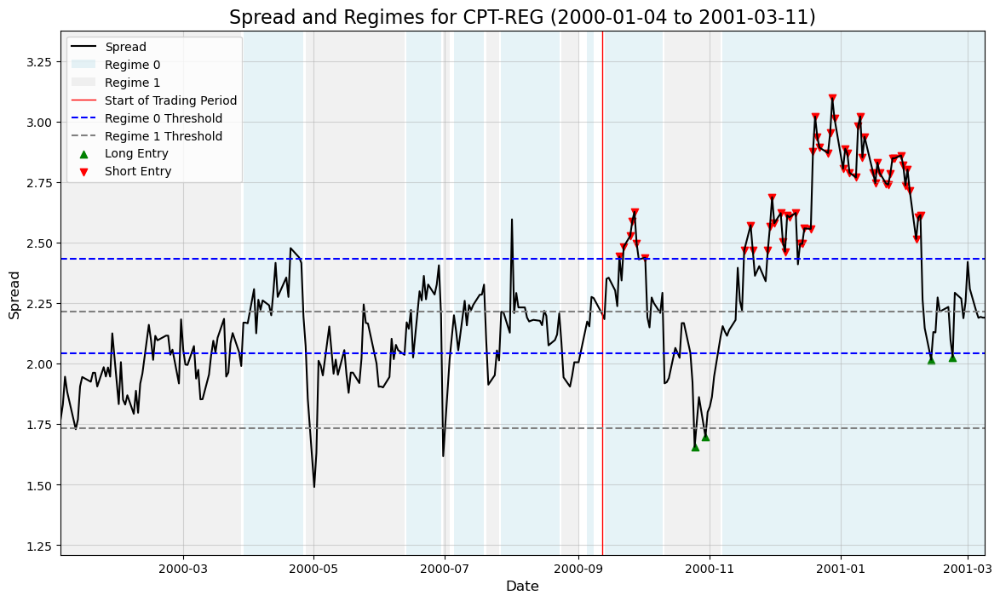

Entering short spread at spread 2.4429869651794416
Closing short spread at spread 2.3443236351013184
Entering short spread at spread 2.4841723442077637
Closing short spread at spread 2.431568622589113
Entering short spread at spread 2.4385128021240234
Closing short spread at spread 2.192563056945801
Entering long spread at spread 1.656761646270752
Closing long spread at spread 1.7580900192260742
Entering long spread at spread 1.698333740234375
Closing long spread at spread 1.8002381324768066
Entering short spread at spread 2.46821928024292
Closing short spread at spread 2.363640308380127
Entering short spread at spread 2.4692749977111834
Closing short spread at spread 2.4109621047973633
Entering short spread at spread 2.496096611022949
Closing short spread at spread 2.2652511596679688
Entering long spread at spread 2.016733169555664
Closing long spread at spread 2.1312007904052734
Entering long spread at spread 2.027444839477539
Closing long spread at spread 2.2933874130249023
Results 

Model is not converging.  Current: 87.26661058825644 is not greater than 87.26891894804315. Delta is -0.002308359786709957


Results for SPGI-BDX: Cumulative Returns=-0.245138
---Processing pair: BLK & FE---
Fitting HMM...
Transition probabilities: p_11=1.0000, p_22=0.9802
Calculating regime statistics...
Regime Means: {0: 22.004787000020347, 1: 17.522176649056227}
Regime Stds: {0: 1.112428164334492, 1: 0.5626278274705059}
---Trading period: 2004-06-29 00:00:00+00:00 to 2004-12-26 00:00:00+00:00---
Generating trading signals...
Entering short spread at spread 23.854650497436523
Closing short spread at spread 24.168532371520996
Entering short spread at spread 25.08099937438965
Closing short spread at spread 31.785022735595703
Results for BLK-FE: Cumulative Returns=-7.017905
---Processing pair: EL & PG---
Fitting HMM...
Transition probabilities: p_11=0.8943, p_22=0.9494
Calculating regime statistics...
Regime Means: {0: -12.430338165976785, 1: -13.04884885919505}
Regime Stds: {0: 0.20160189261001513, 1: 0.2550161364107043}
---Trading period: 2004-06-29 00:00:00+00:00 to 2004-12-26 00:00:00+00:00---
Generating 

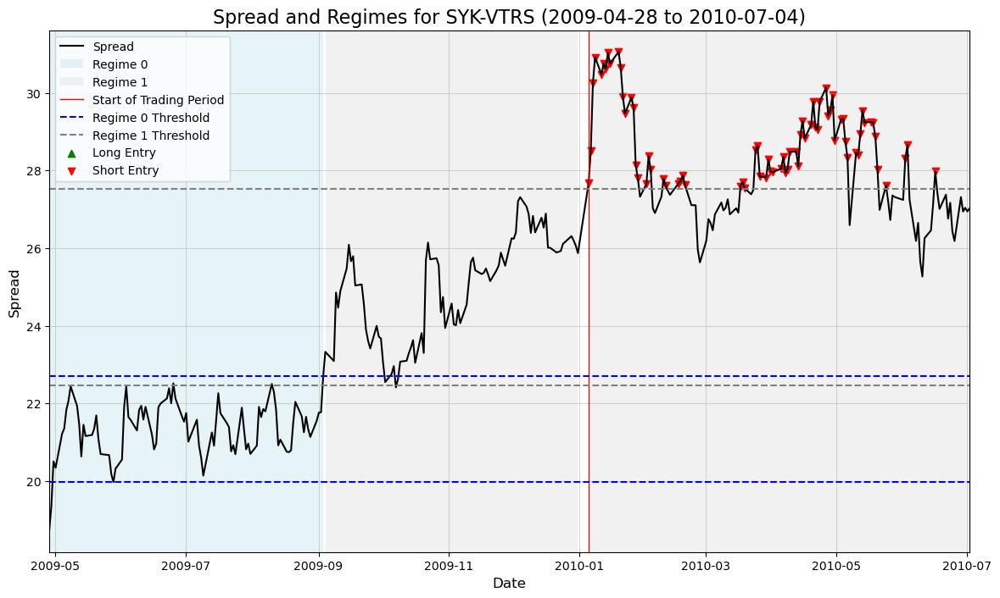

Entering short spread at spread 27.680638313293457
Closing short spread at spread 27.32537078857422
Entering short spread at spread 27.651659011840827
Closing short spread at spread 27.02474880218506
Entering short spread at spread 27.789527893066406
Closing short spread at spread 27.48081111907959
Entering short spread at spread 27.667377471923828
Closing short spread at spread 27.108659744262695
Entering short spread at spread 27.602567672729492
Closing short spread at spread 27.386991500854492
Entering short spread at spread 28.520694732666016
Closing short spread at spread 26.59222984313965
Entering short spread at spread 28.454278945922844
Closing short spread at spread 26.985427856445312
Entering short spread at spread 27.61577606201172
Closing short spread at spread 27.20335578918457
Entering short spread at spread 28.30480194091797
Closing short spread at spread 27.247029304504395
Entering short spread at spread 27.978224754333496
Closing short spread at spread 27.4253807067871

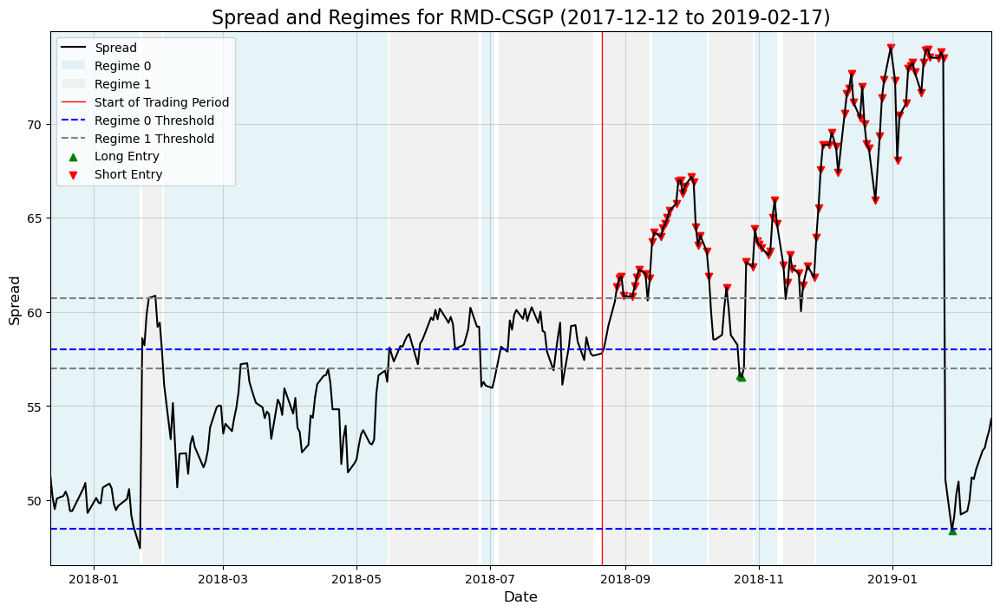

Entering short spread at spread 61.3371467590332
Closing short spread at spread 60.60356521606445
Entering short spread at spread 61.79732894897461
Closing short spread at spread 59.9589958190918
Entering short spread at spread 61.291572570800795
Closing short spread at spread 60.19343948364258
Entering long spread at spread 56.62611770629883
Closing long spread at spread 57.05248260498047
Entering short spread at spread 62.64144134521483
Closing short spread at spread 60.675354003906264
Entering short spread at spread 61.57557678222656
Closing short spread at spread 60.0381622314453
Entering short spread at spread 61.43367004394531
Closing short spread at spread 51.0872802734375
Entering long spread at spread 48.40620803833008
Closing long spread at spread 49.10945510864258
Results for RMD-CSGP: Cumulative Returns=18.649551
---Processing pair: AXON & NDAQ---
Fitting HMM...
Transition probabilities: p_11=0.9901, p_22=1.0000
Calculating regime statistics...
Regime Means: {0: 9.068264158

,pair,formation_period,trading_period,cumulative_returns
0,"(CPT, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",1.374597
1,"(EQR, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",1.902317
2,"(BXP, REG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",1.411101
3,"(BK, AJG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",6.024442
4,"(AJG, EG)","(2000-01-04, 2000-09-11)","(2000-09-12, 2001-03-11)",-9.105423
...,...,...,...,...
1370,"(DXCM, REG)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",1.530006
1371,"(ICE, KIM)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",5.812778
1372,"(HWM, SRE)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",9.130646
1373,"(MMM, PNW)","(2024-02-27, 2024-11-04)","(2024-11-05, 2025-05-04)",-0.230843


In [ ]:
# THIS MODEL FITS TO DATA THAT FINDS TOP 5 COINTEGRATED PAIRS ACROSS 1 YEAR + 6 MONTH SHIFT + 6 MONTH TRADE (so no month gap between trading periods)
all_results = pairs_trading_pipeline_coint(price_df, trading_window=30*6, top_n_pairs=5)
cumulative_df = pd.DataFrame(all_results)

# Save results to a CSV for further analysis
cumulative_df.to_csv("results/coint_hmm/coint_6mo_top5.csv", index=False)
print("\nDetailed results saved to 'coint_6mo_top5.csv'.")

cumulative_df